In [1]:
# Import all essential libraries

import os
import csv
# import ipdb
import math
import warnings
import random
import numpy as np
import networkx as nx
import scipy.constants as sc
import matplotlib.pyplot as plt
import networkx.algorithms.isomorphism as iso
# %matplotlib qt
from IPython.core.debugger import Pdb
ipdb = Pdb()

In [2]:
def plot_fig(G, title=""):
    A = nx.adjacency_matrix(G)
    pos = nx.spring_layout(G)
    nodes = list(nx.nodes(G))
    mapping = {}
    for i,j in enumerate(nodes):
        mapping[j] = i
        
    plt.figure()
    if title: plt.title(title)
    for i in G.edges():
        G[i[0]][i[1]][0]['number'] = A[mapping[i[0]], mapping[i[1]]]
    labels = nx.get_edge_attributes(G, 'number')
    edge_labels = {}
    for i in labels:
        edge_labels[(i[0], i[1])] = labels[i]
    nx.draw(G, pos, with_labels=True,edge_color='black',width=1,linewidths=1,node_size = 500,node_color='pink',alpha=0.9)
    nx.draw_networkx_edge_labels(G, pos, edge_labels = edge_labels)
    # plt.axis('off')
    plt.show()

In [3]:
class Compound():
    def __init__(self, name, number):
        self._name = name + " " + str(number)
        self._number = number
        self._valency = self.get_max_valency()

    def get_max_valency(self):
        name = self._name.split()[0]
        if name == "H":
            return 1
        elif name == "C":
            return 4
        elif name == "N":
            return 3
        elif name == "O":
            return 2
        elif name == "S":
            return 2

    def current_valency(self, G):
        neig = nx.degree(G, self)
        max_val = self.get_max_valency()
        if neig > max_val:
            ipdb.set_trace()
            raise ValueError('Compound has more neighbours than valence')
        else:
            # print(max_val, neig)
            self._valency = max_val - neig
        
    def get_total_valency(self, G):
        neig = nx.degree(G, self)
        free_electrons = self.get_max_valency() - neig
        return free_electrons
        
        
    def __repr__(self):
        return self._name

In [5]:
# Function to update the valencies of the atoms
# This function updates the atom valencies based 
# on the number of edges that atom forms.

def fix_valencies(G):
    for node in nx.nodes(G):
        degree = len(G[node])
        if degree > 0:
            node.current_valency(G)

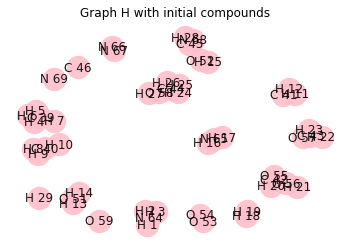

0


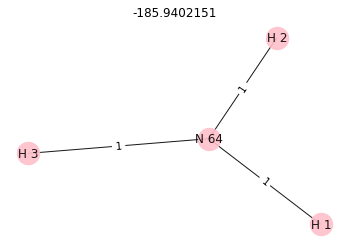

1


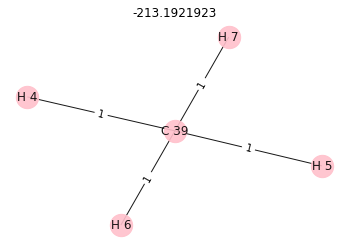

2


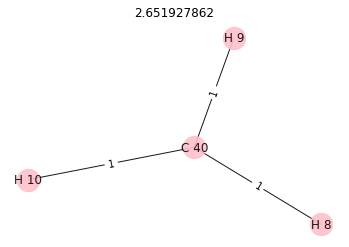

3


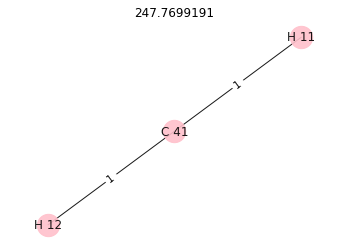

4


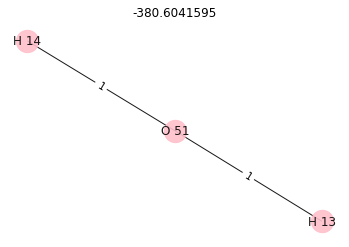

5


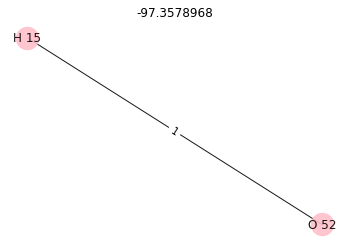

6


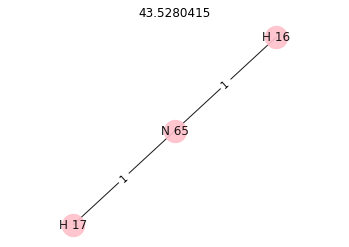

7


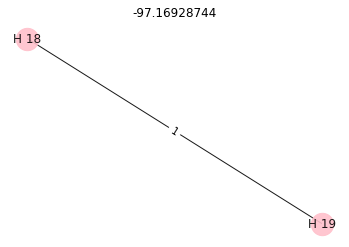

8


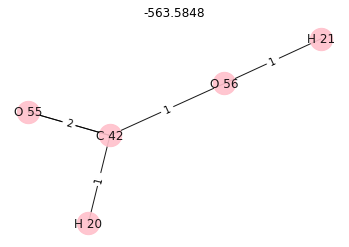

9


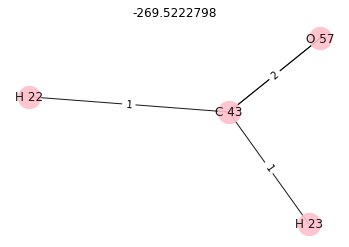

10


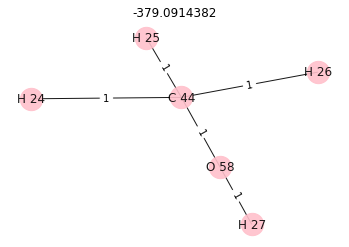

11


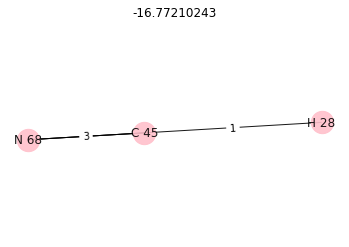

12


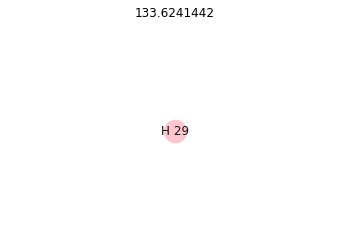

13


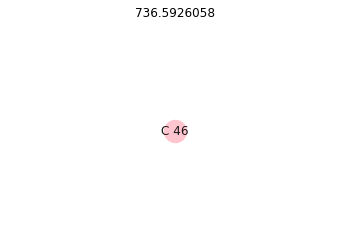

14


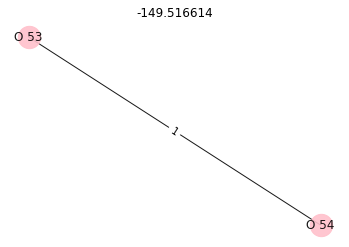

15


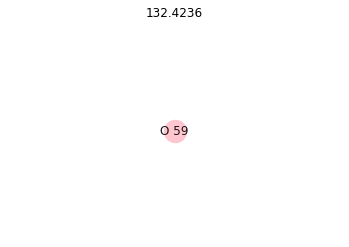

16


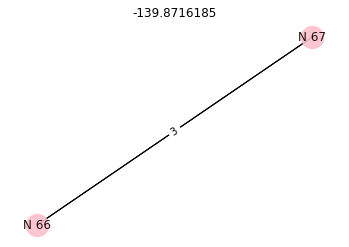

17


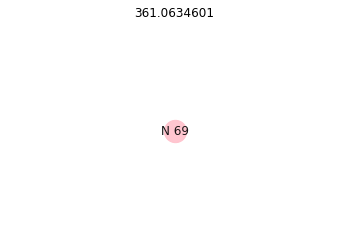

{<networkx.classes.multigraph.MultiGraph object at 0x7fbe60798c70>: -185.9402151, <networkx.classes.multigraph.MultiGraph object at 0x7fbe606251f0>: -213.1921923, <networkx.classes.multigraph.MultiGraph object at 0x7fbe6071ed60>: 2.651927862, <networkx.classes.multigraph.MultiGraph object at 0x7fbe606535b0>: 247.7699191, <networkx.classes.multigraph.MultiGraph object at 0x7fbe604c7640>: -380.6041595, <networkx.classes.multigraph.MultiGraph object at 0x7fbe6049e3d0>: -97.3578968, <networkx.classes.multigraph.MultiGraph object at 0x7fbe606fd6a0>: 43.5280415, <networkx.classes.multigraph.MultiGraph object at 0x7fbe6071e310>: -97.16928744, <networkx.classes.multigraph.MultiGraph object at 0x7fbe628e7dc0>: -563.5848, <networkx.classes.multigraph.MultiGraph object at 0x7fbe6071eaf0>: -269.5222798, <networkx.classes.multigraph.MultiGraph object at 0x7fbe607af310>: -379.0914382, <networkx.classes.multigraph.MultiGraph object at 0x7fbe606fd2b0>: -16.77210243, <networkx.classes.multigraph.MultiG

In [18]:
H = nx.MultiGraph()

H_lists = [Compound("H",i) for i in range(1,30)]
C_lists = [Compound("C",i) for i in range(39, 47)]
O_lists = [Compound("O",i) for i in range(51, 60)]
N_lists = [Compound("N",i) for i in range(64, 70)]
for i,lst in enumerate([H_lists, C_lists, O_lists, N_lists]):
    for comp in lst:
        H.add_node(comp, data=comp)

# nx.draw(H,with_labels=True)
H.add_edges_from([(H_lists[0], N_lists[0]), (N_lists[0], H_lists[1]), (N_lists[0], H_lists[2])])
H.add_edges_from([(H_lists[3], C_lists[0]), (H_lists[4], C_lists[0]), (H_lists[5], C_lists[0]), (H_lists[6], C_lists[0])])
H.add_edges_from([(H_lists[7], C_lists[1]), (H_lists[8], C_lists[1]), (H_lists[9], C_lists[1])])
H.add_edges_from([(H_lists[10], C_lists[2]), (H_lists[11], C_lists[2])])
H.add_edges_from([(H_lists[12], O_lists[0]), (H_lists[13], O_lists[0])])
H.add_edges_from([(H_lists[14], O_lists[1])])
H.add_edges_from([(H_lists[15], N_lists[1]), (N_lists[1], H_lists[16])])
H.add_edges_from([(H_lists[17], H_lists[18])])
H.add_edges_from([(O_lists[2], O_lists[3])])
H.add_edges_from([(N_lists[2], N_lists[3]), (N_lists[2], N_lists[3]), (N_lists[2], N_lists[3])])
H.add_edges_from([(H_lists[19], C_lists[3]),(O_lists[4], C_lists[3]),(O_lists[4], C_lists[3]),(O_lists[5], C_lists[3]),(H_lists[20], O_lists[5])])
H.add_edges_from([(H_lists[21], C_lists[4]),(O_lists[6], C_lists[4]),(O_lists[6], C_lists[4]),(H_lists[22], C_lists[4])])
H.add_edges_from([(H_lists[23], C_lists[5]), (H_lists[24], C_lists[5]), (H_lists[25], C_lists[5]),(O_lists[7], C_lists[5]),(O_lists[7], H_lists[26])])
H.add_edges_from([(H_lists[27], C_lists[6]), (N_lists[4], C_lists[6]), (N_lists[4], C_lists[6]), (N_lists[4], C_lists[6])])
# H.add_edges_from([(H_lists[28], N_lists[5]), (N_lists[5], H_lists[29]), (N_lists[5], C_lists[7]), (H_lists[30], C_lists[7]), (C_lists[7], H_lists[31]), (C_lists[7], C_lists[8]), (O_lists[8], C_lists[8]),(O_lists[8], C_lists[8]),(O_lists[9], C_lists[8]),(H_lists[32], O_lists[9])])
# H.add_edges_from([(H_lists[33], N_lists[6]), (N_lists[6], H_lists[34]), (N_lists[6], C_lists[9]), (H_lists[35], C_lists[9]), (C_lists[9], H_lists[36]), (C_lists[9], C_lists[10]), (O_lists[10], C_lists[10]),(O_lists[10], C_lists[10]),(O_lists[11], C_lists[10])])

plot_fig(H, "Graph H with initial compounds")

data_G = {}
G_value = [-185.9402151,-213.1921923,2.651927862,247.7699191,-380.6041595,-97.3578968,43.5280415,-97.16928744,-563.5848,-269.5222798,-379.0914382,-16.77210243,133.6241442,736.5926058,-149.516614,132.4236,-139.8716185,361.0634601]

entities = nx.connected_components(H)
entities = list(entities)
for i in range(len(entities)):
    print(i)
    sub = H.subgraph(list(entities[i]))
    data_G[sub] = G_value[i]
    plot_fig(sub, G_value[i])
fix_valencies(H)    
print(data_G)

In [19]:
# Finding G of all components given a network
def input_G(G):
    
    cc = list(nx.connected_components(G))
    G_energy = 0
    
    for i in range(len(cc)):
        found = 0
        
        # print("Connected Component G:", cc[i])
        sub_G = G.subgraph(list(cc[i]))
        same = False
        
        for j in data_G:
            # print(j.nodes)
            GH = iso.GraphMatcher(sub_G,j)
            
            # print("Isomorphic:", GH.is_isomorphic())
            if GH.is_isomorphic() == True:
                same = True
            else:
                same = False
            
            if same == True:
                if len(GH.mapping) != 2:
                    for k in GH.mapping: # check mapping of each nodes
                        # print(str(k)[0])
                        # print(str(GH.mapping[k])[0])
                        if str(k)[0] == str(GH.mapping[k])[0]: # Each node's label (without index) should coincide
                            same = True
                        else:
                            same = False
                            break
                else:
                    keys = []
                    values = []
                    for i in GH.mapping.keys():
                        keys.append(str(i).split()[0])
                    for i in GH.mapping.keys():
                        values.append(str(i).split()[0])
                    keys = keys.sort()
                    values = values.sort()
                    if keys == values:
                        same = True
                    else: 
                        same = False
                        
                # print(same)
                
            if same == True: # If compound is found, add G
                found = 1
                break

        if same == True:
            G_energy += data_G[j]
            
        elif same == False: # If compound not found,
            randomp = G.subgraph(list(cc[i]))
            plot_fig(randomp)
            
            val = float(input('Enter G value of %s: '%list(cc[i])))
            data_G[sub_G] = val # Add the new compound's data to our dictionary
            G_energy += val
            # print(G_energy)
    return G_energy

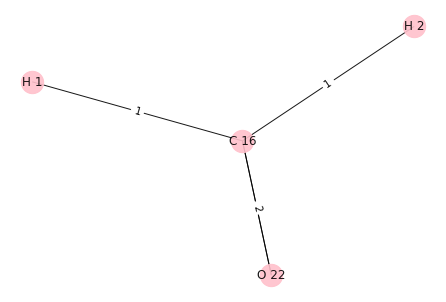

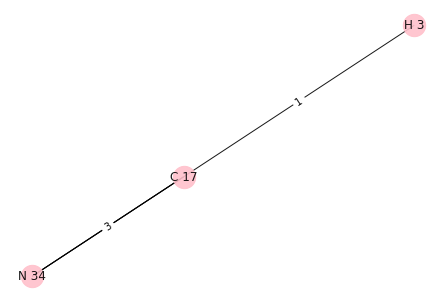

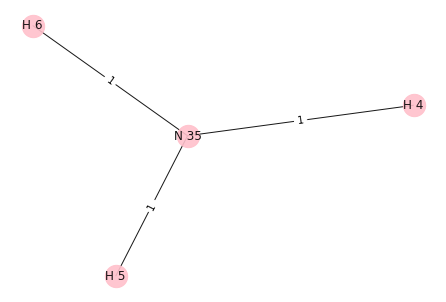

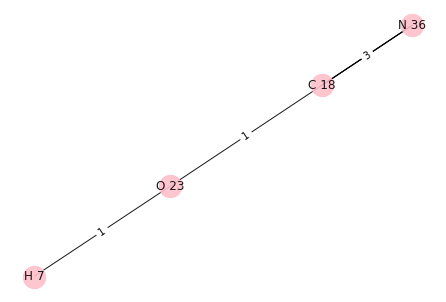

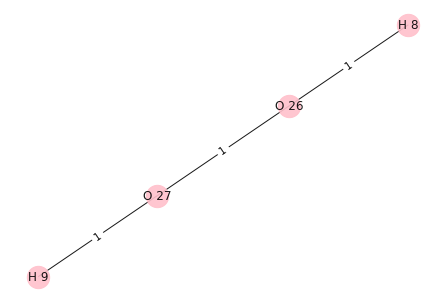

...

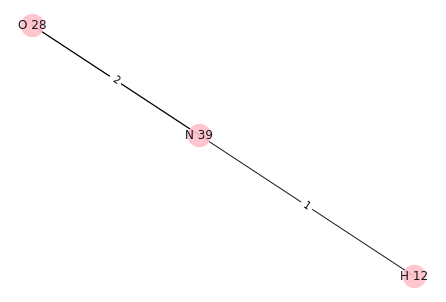

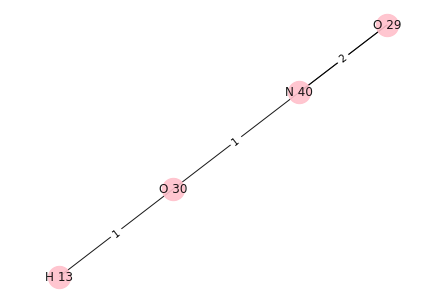

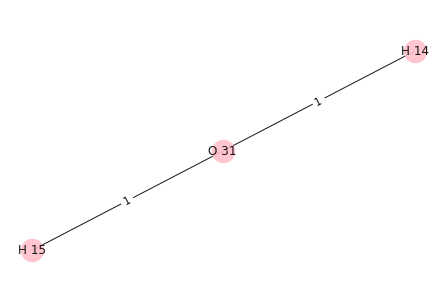

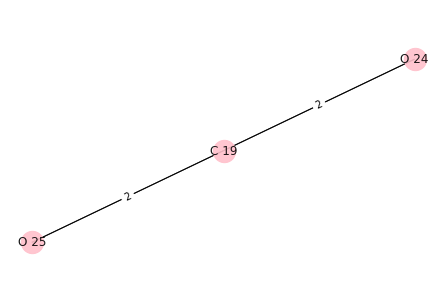

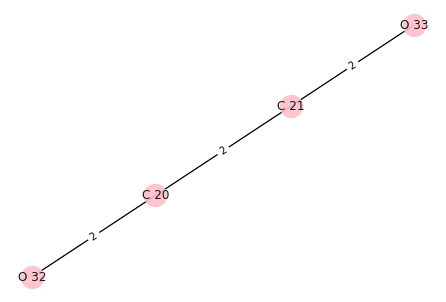

In [20]:
#Compounds of size = 3/4

N = nx.MultiGraph()

H_list_n = [Compound("H",i) for i in range(1,16)]
C_list_n = [Compound("C",i) for i in range(16, 22)]
O_list_n = [Compound("O",i) for i in range(22, 34)]
N_list_n = [Compound("N",i) for i in range(34, 41)]
for i,lst in enumerate([H_list_n, C_list_n, O_list_n, N_list_n]):
    for comp in lst:
        N.add_node(comp, data=comp)
#CH2O        
N.add_edges_from([(H_list_n[0], C_list_n[0]), (H_list_n[1], C_list_n[0]), (O_list_n[0], C_list_n[0]), (O_list_n[0], C_list_n[0])])
#HCN
N.add_edges_from([(C_list_n[1], H_list_n[2]), (C_list_n[1], N_list_n[0]), (C_list_n[1], N_list_n[0]), (C_list_n[1], N_list_n[0])])
#NH3
N.add_edges_from([(H_list_n[3], N_list_n[1]), (N_list_n[1], H_list_n[4]), (N_list_n[1], H_list_n[5])])
#CNOH
N.add_edges_from([(C_list_n[2], N_list_n[2]), (C_list_n[2], N_list_n[2]), (C_list_n[2], N_list_n[2]), (C_list_n[2], O_list_n[1]), (O_list_n[1], H_list_n[6])])
#CO2
N.add_edges_from([(O_list_n[2], C_list_n[3]), (O_list_n[2], C_list_n[3]), (O_list_n[3], C_list_n[3]), (O_list_n[3], C_list_n[3])])
#H2O2
N.add_edges_from([(O_list_n[4], H_list_n[7]), (O_list_n[4], O_list_n[5]), (O_list_n[5], H_list_n[8])])
#N2H2
N.add_edges_from([(H_list_n[9], N_list_n[3]), (N_list_n[3], N_list_n[4]), (N_list_n[3], N_list_n[4]), (H_list_n[10], N_list_n[4])])
#HNO
N.add_edges_from([(H_list_n[11], N_list_n[5]), (O_list_n[6], N_list_n[5]), (O_list_n[6], N_list_n[5])])
#HNO2
N.add_edges_from([(O_list_n[7], N_list_n[6]), (O_list_n[7], N_list_n[6]), (O_list_n[8], N_list_n[6]), (O_list_n[8], H_list_n[12])])
#H2O
N.add_edges_from([(H_list_n[13], O_list_n[9]), (H_list_n[14], O_list_n[9])])
#C2O2
N.add_edges_from([(O_list_n[10], C_list_n[4]), (O_list_n[10], C_list_n[4]), (C_list_n[4], C_list_n[5]), (C_list_n[5], C_list_n[4]), (O_list_n[11], C_list_n[5]), (O_list_n[11], C_list_n[5])])

fix_valencies(N)
for i in nx.connected_components(N):
    plot_fig(N.subgraph(list(i)))

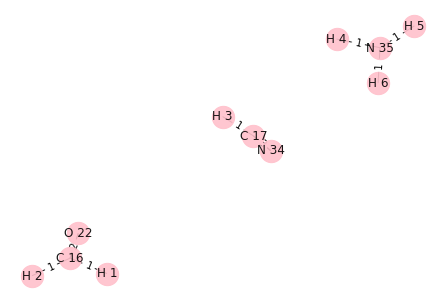

In [21]:
G = N.copy()
connected_components = list(nx.connected_components(G))
mol1 = G.subgraph(connected_components[0])
mol2 = G.subgraph(connected_components[1])
mol3 = G.subgraph(connected_components[2])

G_new = nx.MultiGraph()
nodes = []
edges = {}
for i in [mol1, mol2, mol3]:
    nodes.extend(nx.nodes(i))
    edg_data = nx.get_edge_attributes(i, 'number')
    for i in edg_data:
        edges[i] = edg_data[i]

for i in nodes:
    G_new.add_nodes_from(nodes)
for i in edges:
    for j in range(edges[i]):
        G_new.add_edge(i[0], i[1])
        
plot_fig(G_new)

In [54]:
def form_bonds(G_param, order):
    M = G_param.copy()
    M_dict = {}
    max_size = 11
    connected_components = list(nx.connected_components(M))
    n = len(connected_components)
    print(n)
    print(connected_components)
    print(connected_components[0])
    print(connected_components[1])
    print(len(connected_components[0]) + len(connected_components[1]))
    
    while n >= 2:
        if (len(connected_components[0]) + len(connected_components[1])) > max_size:
            if len(connected_components[0]) >= len(connected_components[1]):
                connected_components = connected_components[1:]
            else:
                connected_components.pop(1)
        else:
            mol1 = M.subgraph(list(connected_components[0]))
            mol2 = M.subgraph(list(connected_components[1]))

            plot_fig(mol1)
            plot_fig(mol2)

            H_list1 = [i for i in nx.nodes(mol1) if i._name.split()[0] == "H"]
            H_list2 = [i for i in nx.nodes(mol2) if i._name.split()[0] == "H"]

            flag = 1
            flag1 = 1
            flag2 = 1
            if len(H_list1) > 1:
                H_to_be_removed1 = H_list1[random.randint(0, len(H_list1)-1)]
            elif len(H_list1) == 1:
                H_to_be_removed1 = H_list1[0]
            else:
                flag1 = 0

            if len(H_list2) > 1:
                H_to_be_removed2 = H_list2[random.randint(0, len(H_list2)-1)]
            elif len(H_list2) == 1:
                H_to_be_removed2 = H_list2[0]
            else:
                flag2 = 0

            flag = flag1*flag2
            if flag:
                print(H_to_be_removed1)
                print(H_to_be_removed2)
                neigh1 = [i for i in mol1[H_to_be_removed1]][0]
                neigh2 = [i for i in mol2[H_to_be_removed2]][0]

                print(neigh1, neigh2)
                M.remove_edge(H_to_be_removed1, neigh1)
                M.remove_edge(H_to_be_removed2, neigh2)
                M.add_edge(neigh1, neigh2)

                fix_valencies(M)
                plot_fig(M.subgraph(list(nx.node_connected_component(M, neigh1))))
                non_H_nodes = []
                print(nx.node_connected_component(M, neigh1))
                for i in nx.node_connected_component(M, neigh1):
                    if (i._name.split()[0]!="H"):
                        non_H_nodes.append(i)
                non_H_nodes = list(set(non_H_nodes))

                print(non_H_nodes)
                for i in range(len(non_H_nodes)):
                    M_new = M.subgraph(list(nx.node_connected_component(M, neigh1))).copy()
                    print("i:", i)
                    temp1 = list(M_new[non_H_nodes[i]].keys())
                    temp1 = [i for i in temp1 if i._name.split()[0]!="H"][0]
                    print("Removing edge between:", non_H_nodes[i], temp1)
                    M_new.remove_edge(non_H_nodes[i], temp1)
                    print("Adding edge between:", non_H_nodes[i], H_to_be_removed1)
                    M_new.add_edge(H_to_be_removed1, non_H_nodes[i])
                    fix_valencies(M_new)
                    for node in nx.node_connected_component(M_new, H_to_be_removed1):
                        print(node, node._valency)

                    plot_fig(M_new.subgraph(nx.node_connected_component(M_new, neigh1)))

                    for j in non_H_nodes:
                        print(j._name, j._valency)
                    second_node = [j for j in non_H_nodes if j._valency!=0]
                    print(second_node, H_to_be_removed2)
                    M_new.add_edge(H_to_be_removed2, second_node[0])
                    fix_valencies(M_new)
                    plot_fig(M_new.subgraph(nx.node_connected_component(M_new, H_to_be_removed2)))

                    M_dict[M_new.subgraph(nx.node_connected_component(M_new, neigh1))] = input_G(M_new.subgraph(nx.node_connected_component(M_new, neigh1)))

                connected_components = connected_components[2:]
                print(connected_components)
                n = len(connected_components)
            else:
                connected_components = connected_components[1:]
                print(connected_components)
                n = len(connected_components)

    return M_dict

In [44]:
def simulated_annealing_bonds(G, order=[]):
    connected_components = list(nx.connected_components(G))
    num_components = len(connected_components)
        
    # randomly permute the order in which the compounds react
    if order == []:
        order = np.random.permutation(num_components)
    else:
        order = np.random.permutation(order)
    
    dict_vals = form_bonds(G, order)
    
    return dict_vals

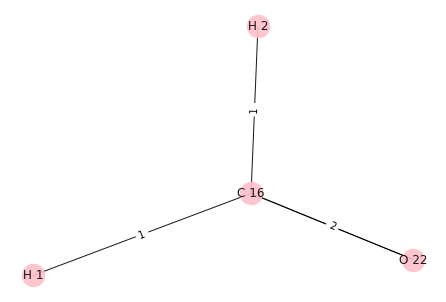

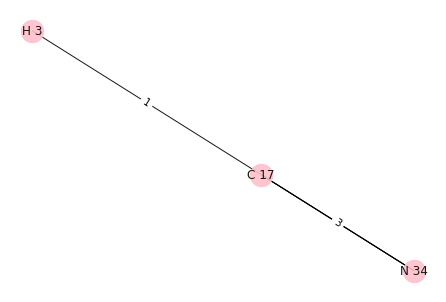

H 1
H 3
C 16 C 17


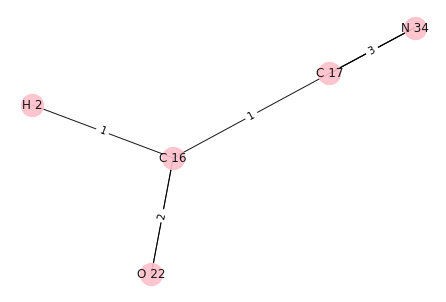

{O 22, N 34, C 16, H 2, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


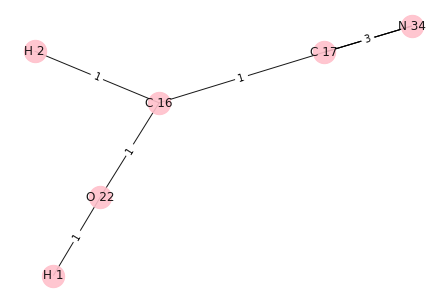

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


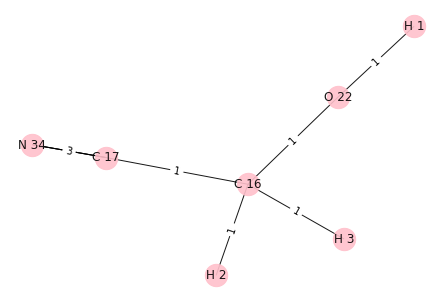

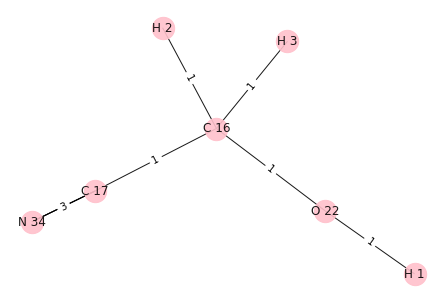

Enter G value of [O 22, H 1, H 3, C 16, N 34, H 2, C 17]: -261.5047571
i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


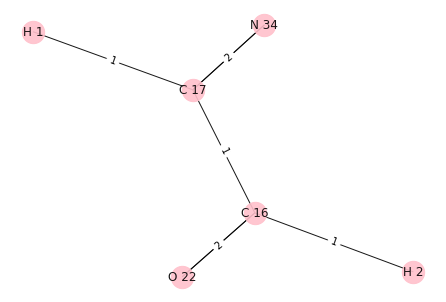

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


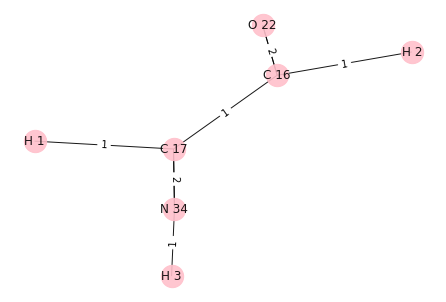

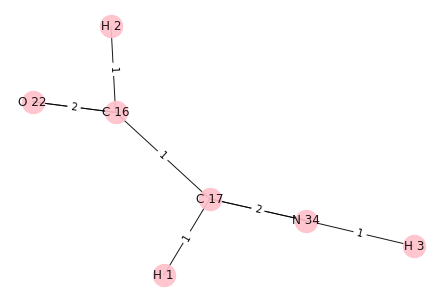

Enter G value of [O 22, H 1, N 34, C 16, H 3, H 2, C 17]: -7.380497132
i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


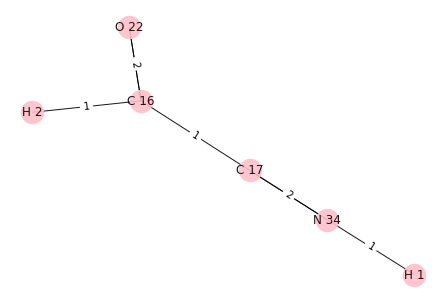

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


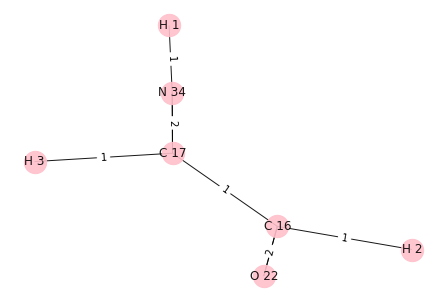

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


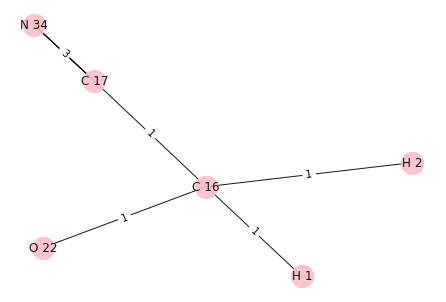

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


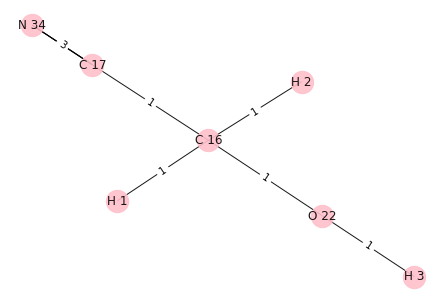

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


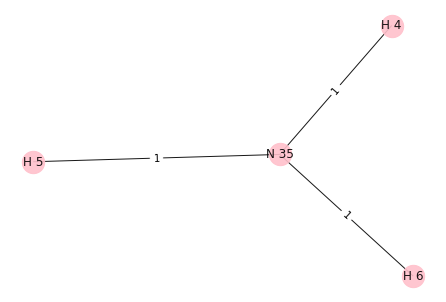

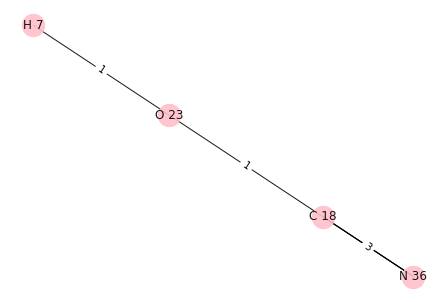

H 4
H 7
N 35 O 23


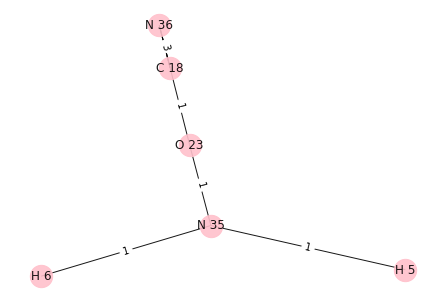

{N 36, O 23, C 18, H 5, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


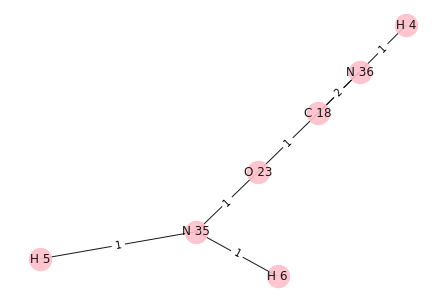

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


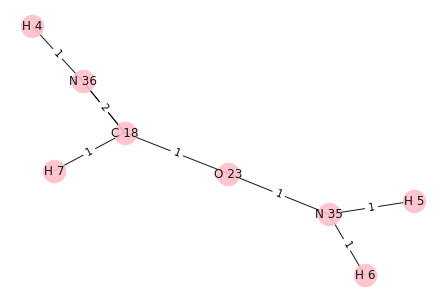

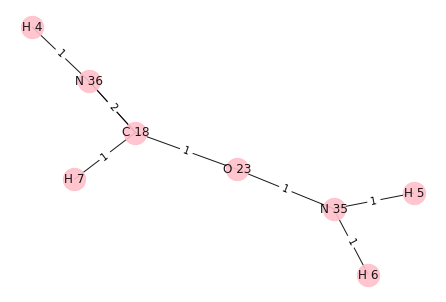

Enter G value of [N 36, H 4, O 23, C 18, H 5, H 6, N 35, H 7]: 100
i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


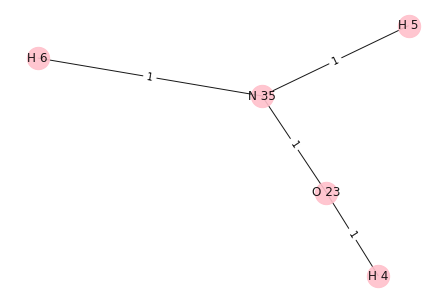

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


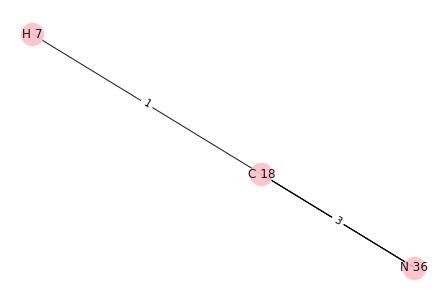

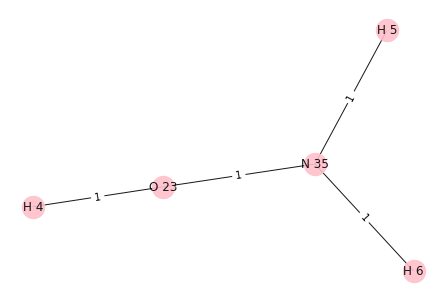

Enter G value of [H 4, O 23, H 5, H 6, N 35]: -215.860156
i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
H 4 0
H 5 0
N 35 0
H 6 0


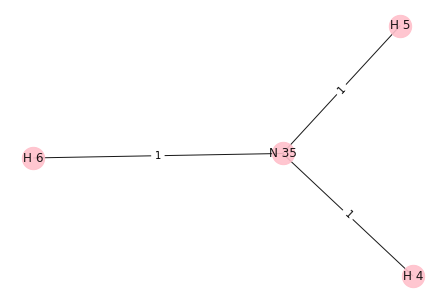

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


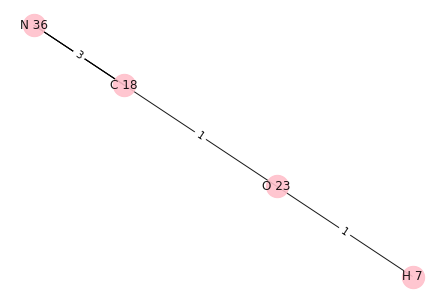

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 4
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


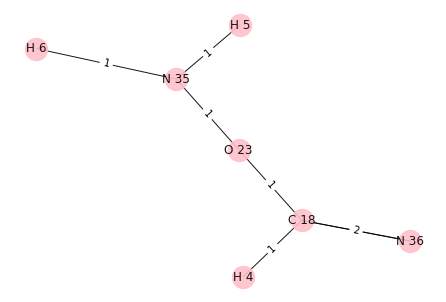

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


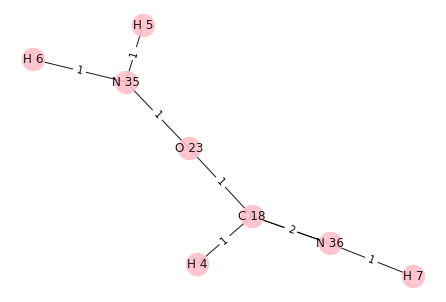

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


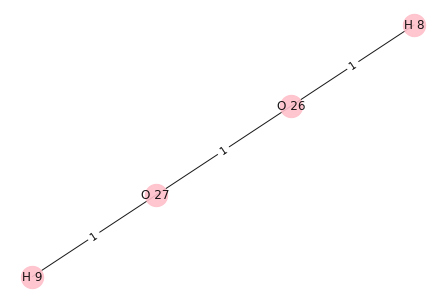

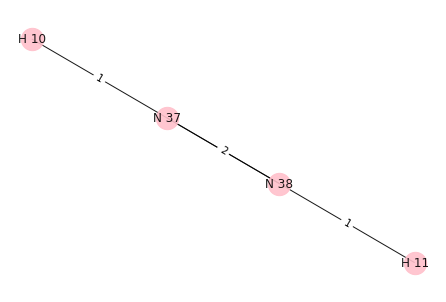

H 9
H 10
O 27 N 37


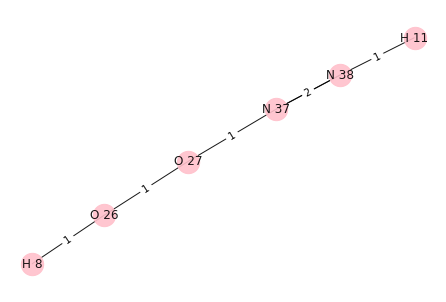

{O 26, O 27, H 11, N 38, N 37, H 8}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
O 26 0
H 8 0
H 9 0


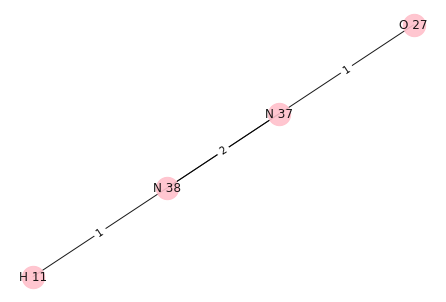

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


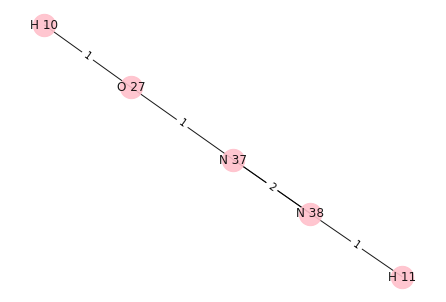

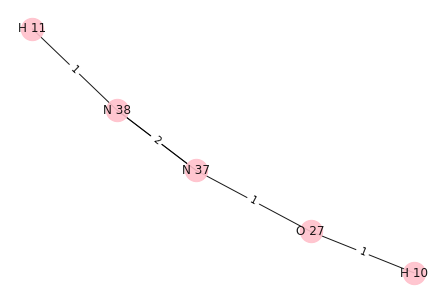

Enter G value of [O 27, H 11, N 38, N 37, H 10]: -107.61248
i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


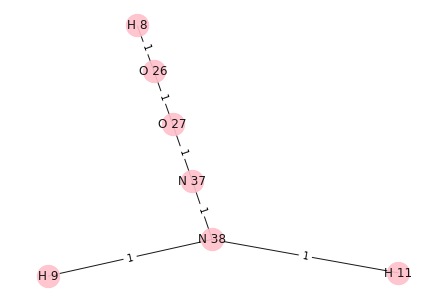

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


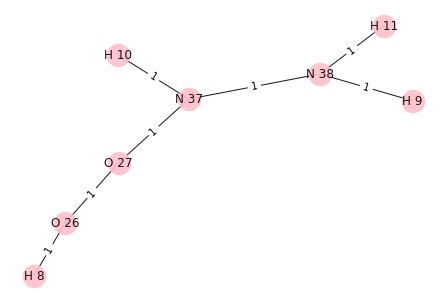

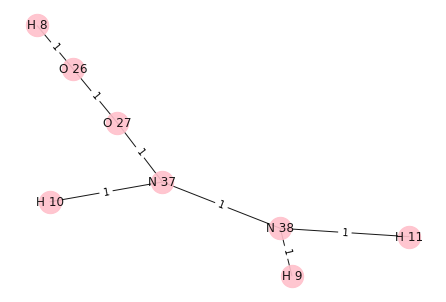

Enter G value of [O 26, H 9, O 27, H 11, N 38, N 37, H 10, H 8]: 100
i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
H 9 0
O 27 0
H 11 0
N 38 0
N 37 0


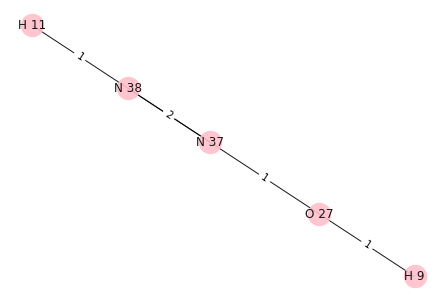

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


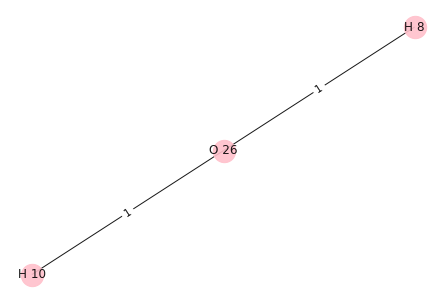

i: 3
Removing edge between: N 37 O 27
Adding edge between: N 37 H 9
H 11 0
H 9 0
N 38 0
N 37 0


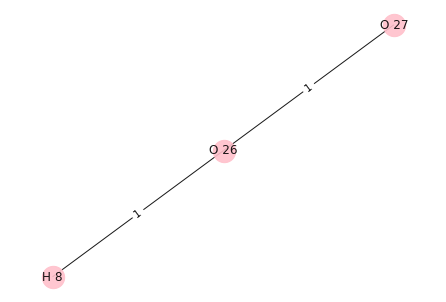

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


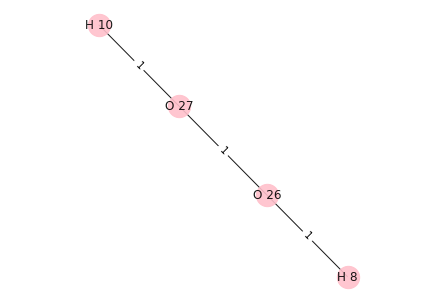

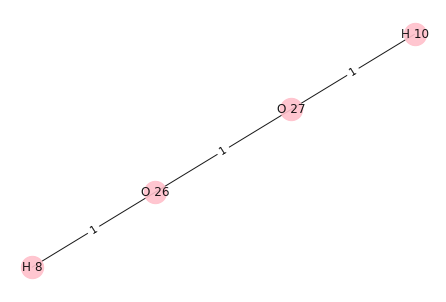

Enter G value of [O 26, H 8, H 10, O 27]: -309.1934413
[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


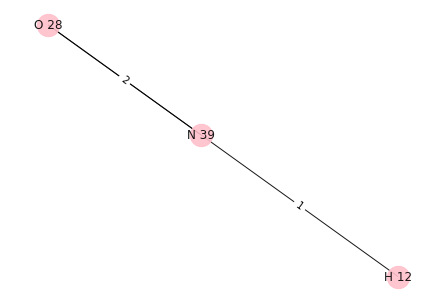

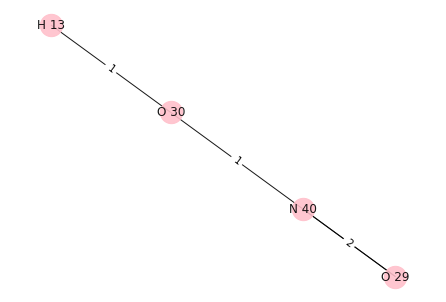

H 12
H 13
N 39 O 30


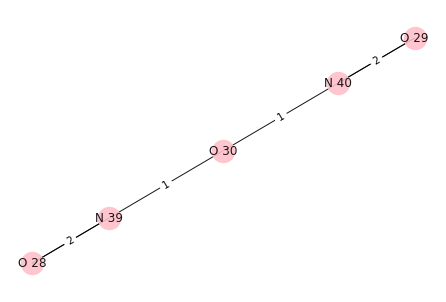

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


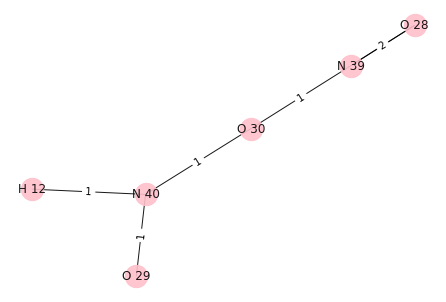

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


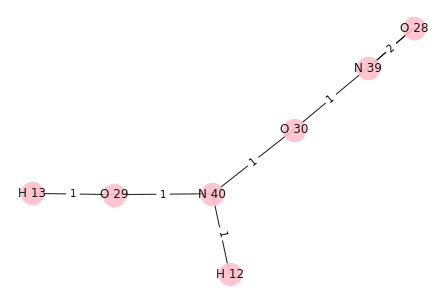

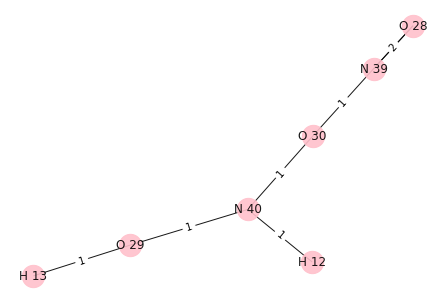

Enter G value of [H 13, N 40, O 28, N 39, O 29, O 30, H 12]: 100
i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


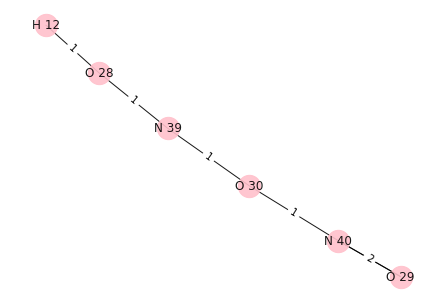

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


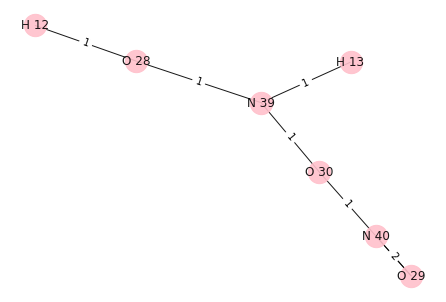

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


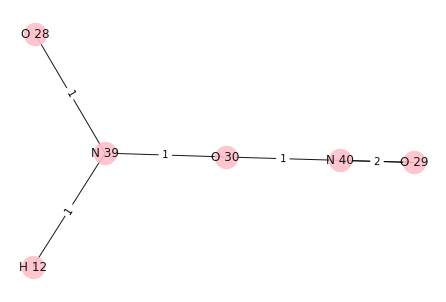

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


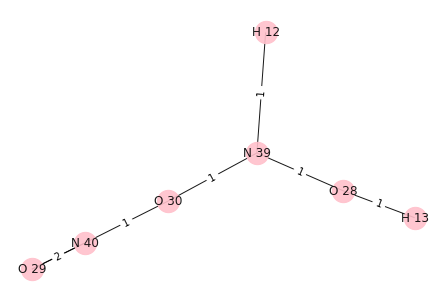

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


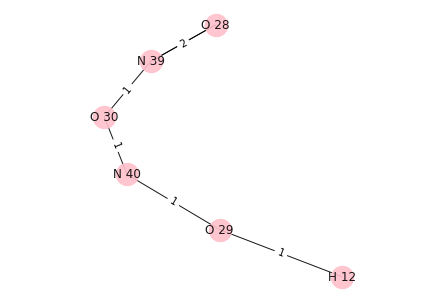

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


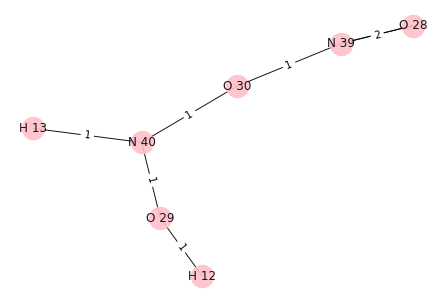

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


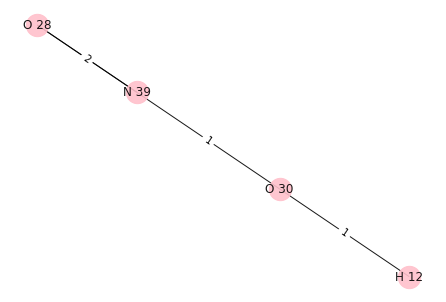

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


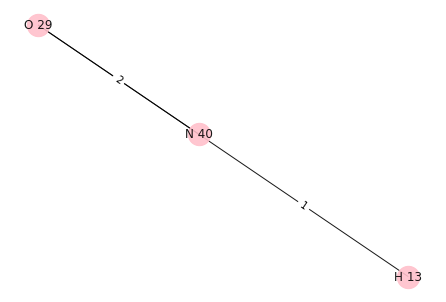

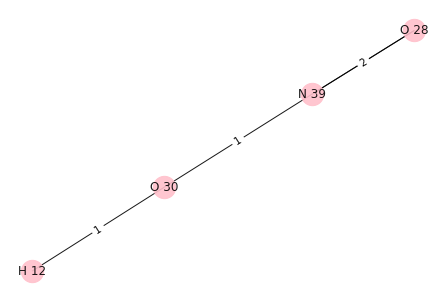

Enter G value of [N 39, O 28, O 30, H 12]: -266.6638947
[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


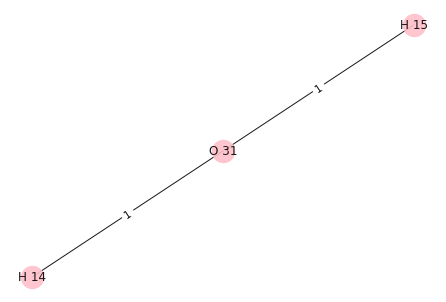

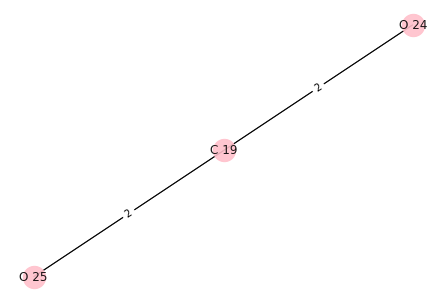

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


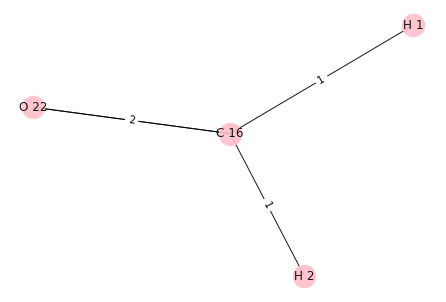

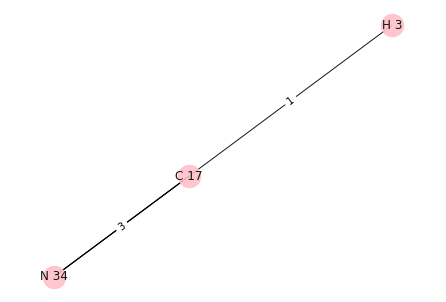

H 2
H 3
C 16 C 17


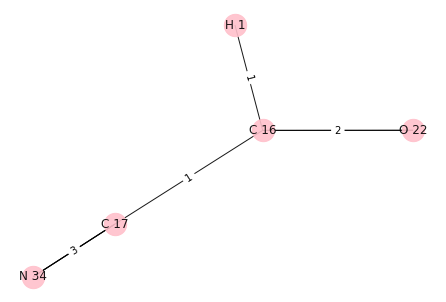

{O 22, H 1, N 34, C 16, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


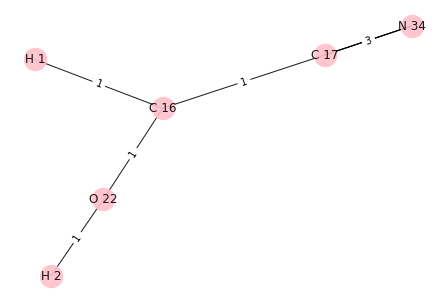

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


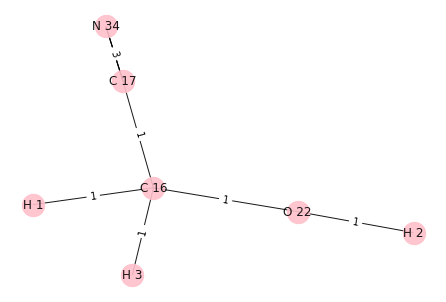

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


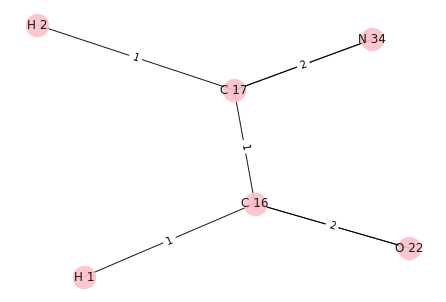

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


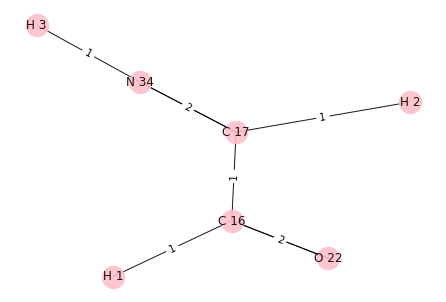

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


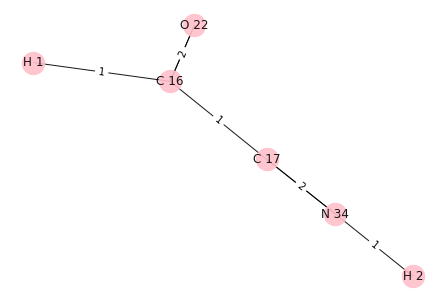

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


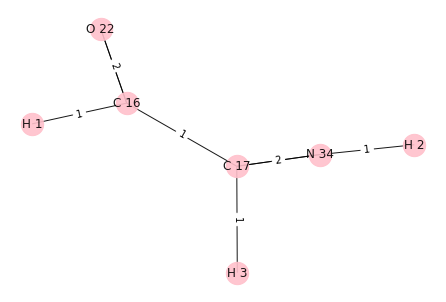

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


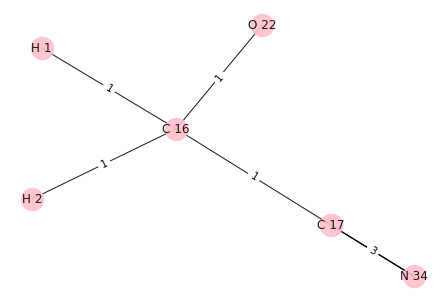

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


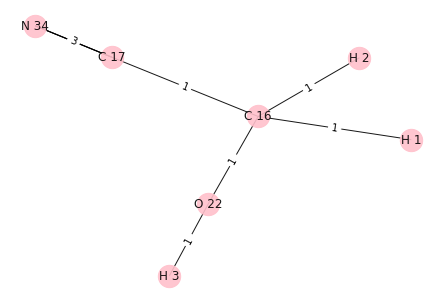

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


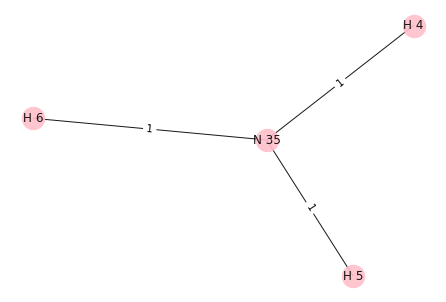

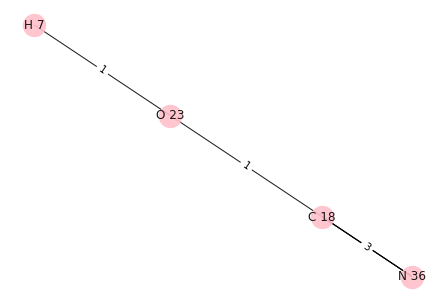

H 6
H 7
N 35 O 23


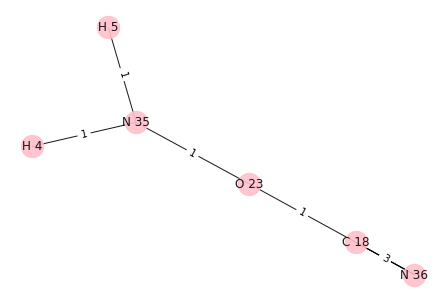

{N 36, H 4, O 23, C 18, H 5, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 6
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


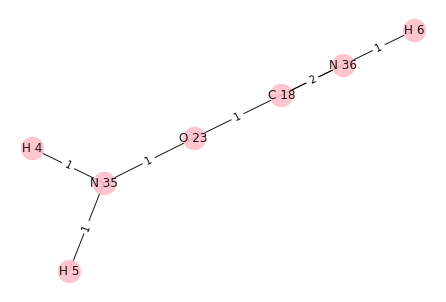

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


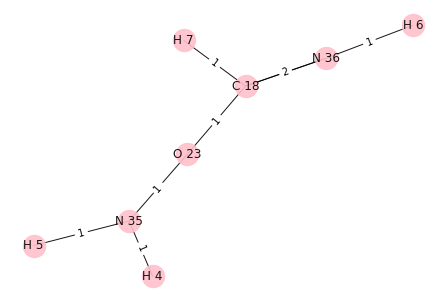

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 6
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


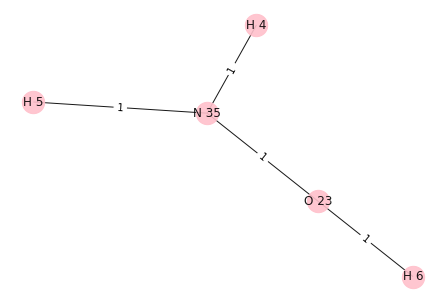

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


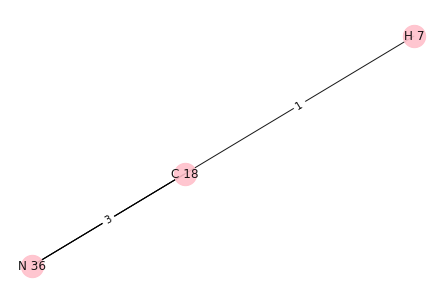

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 6
H 4 0
H 5 0
N 35 0
H 6 0


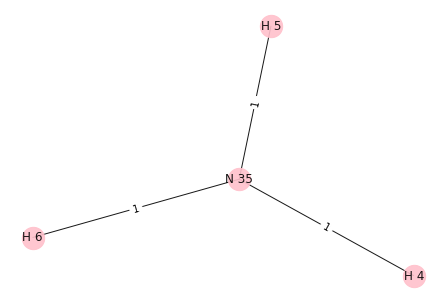

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


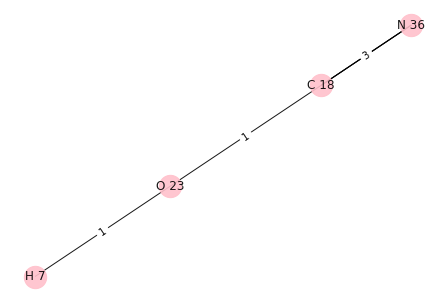

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 6
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


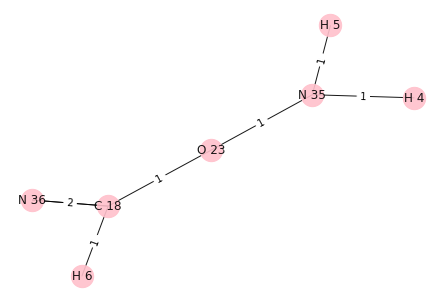

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


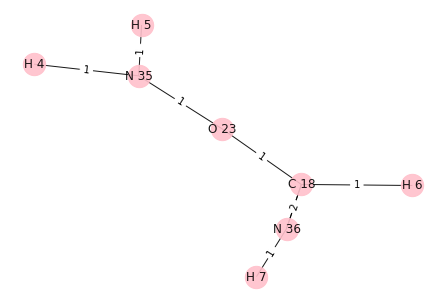

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


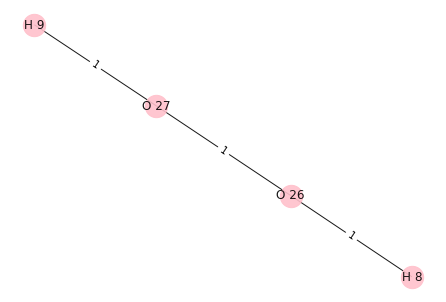

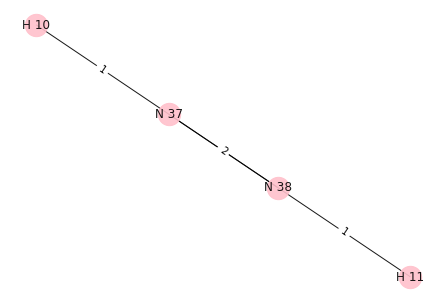

H 9
H 10
O 27 N 37


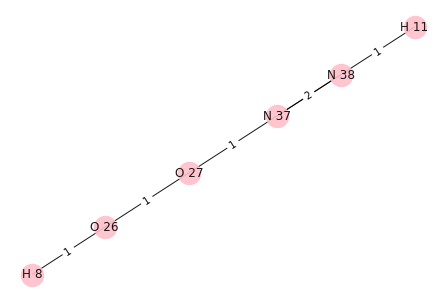

{O 26, O 27, H 11, N 38, N 37, H 8}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
O 26 0
H 8 0
H 9 0


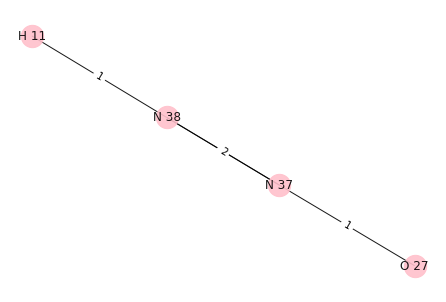

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


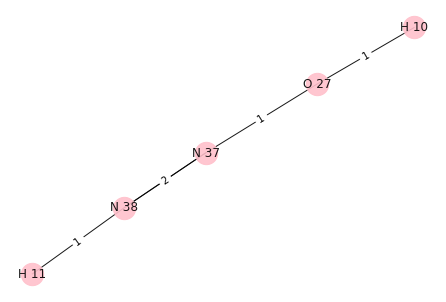

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


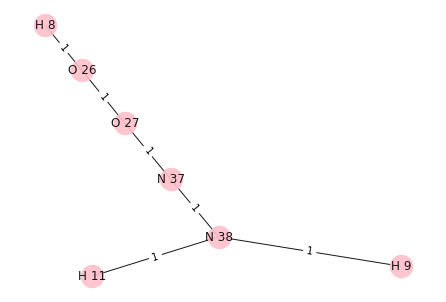

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


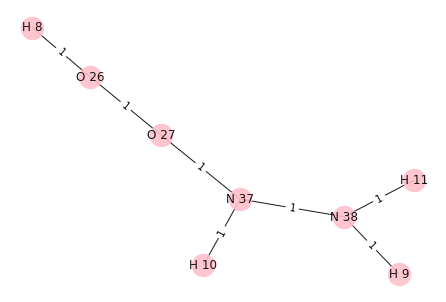

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
H 9 0
O 27 0
H 11 0
N 38 0
N 37 0


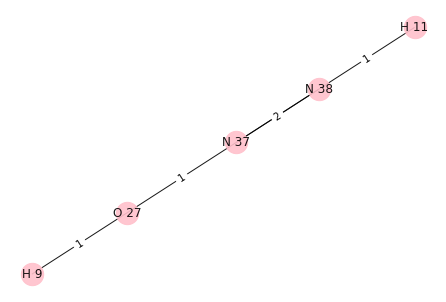

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


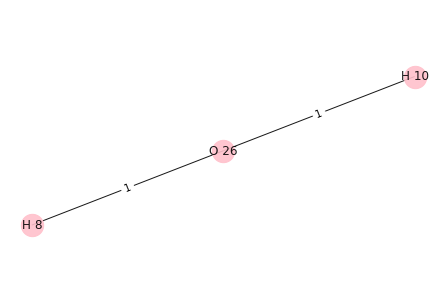

i: 3
Removing edge between: N 37 O 27
Adding edge between: N 37 H 9
H 11 0
H 9 0
N 38 0
N 37 0


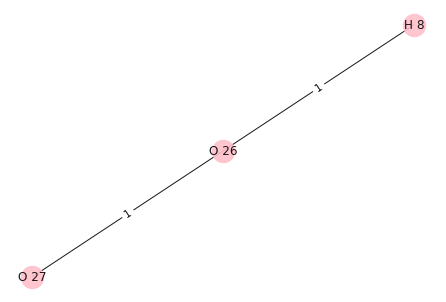

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


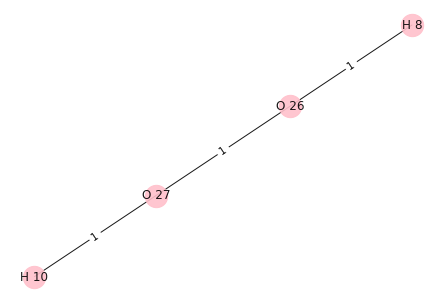

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


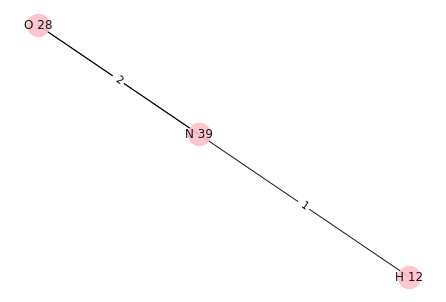

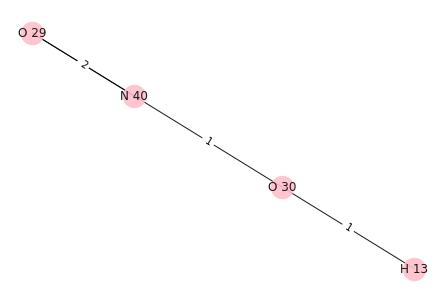

H 12
H 13
N 39 O 30


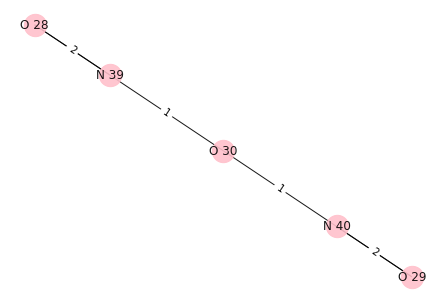

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


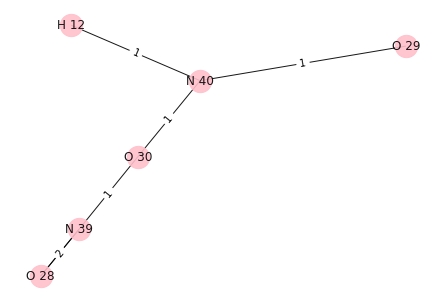

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


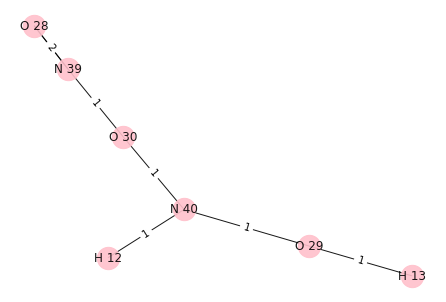

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


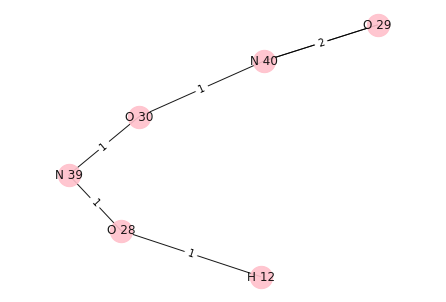

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


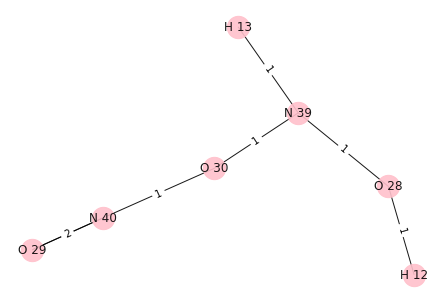

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


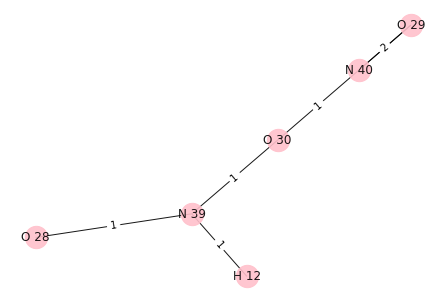

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


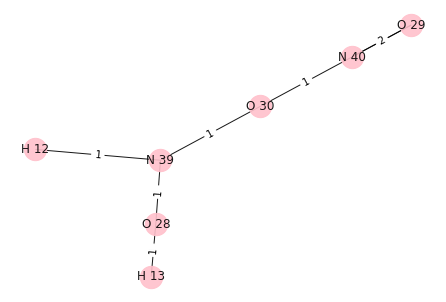

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


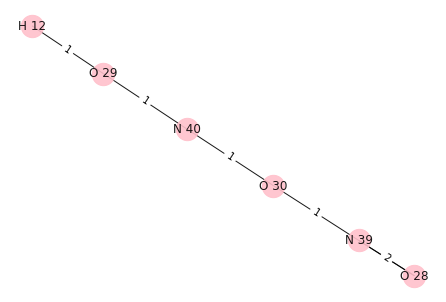

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


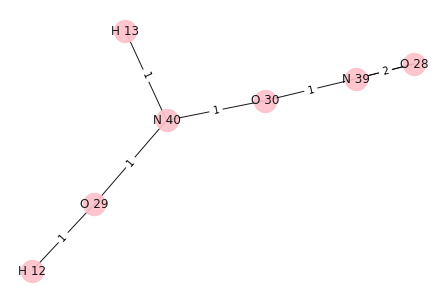

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


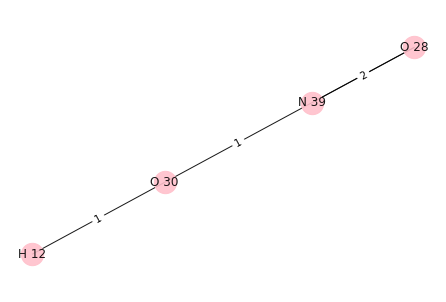

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


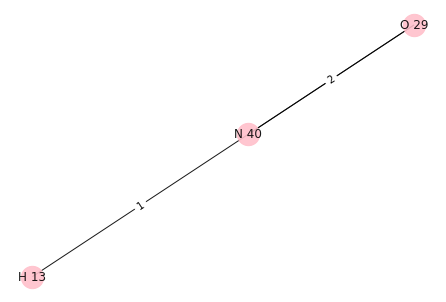

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


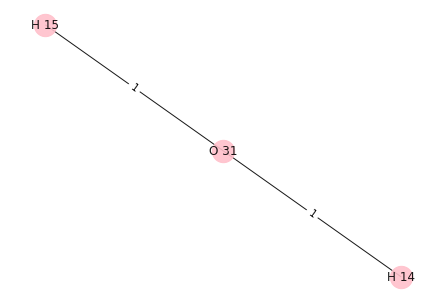

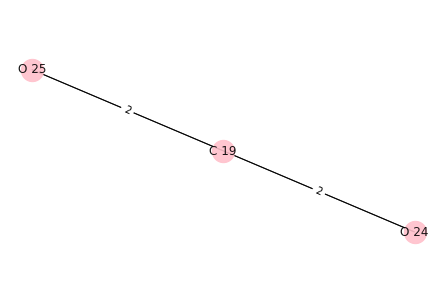

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


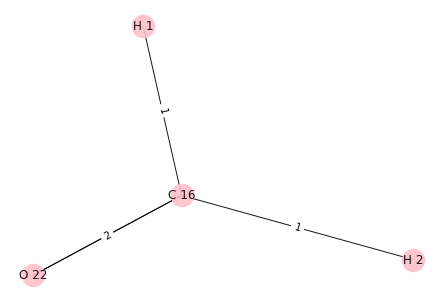

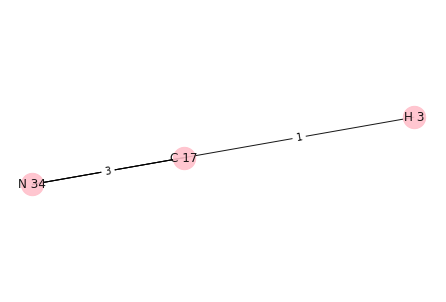

H 2
H 3
C 16 C 17


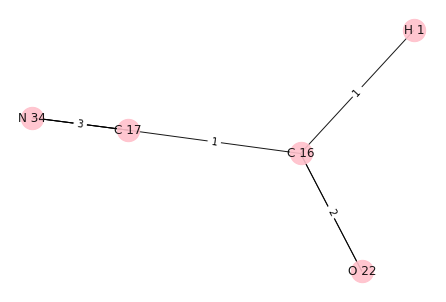

{O 22, H 1, N 34, C 16, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


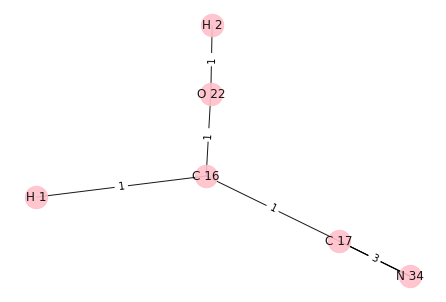

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


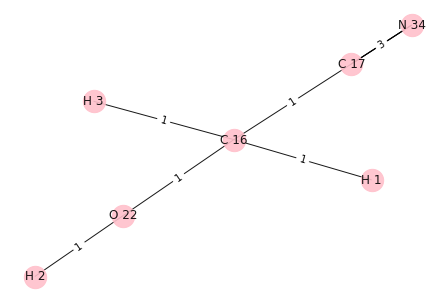

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


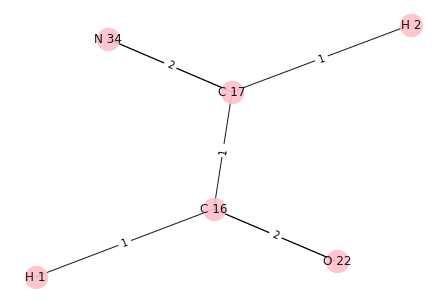

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


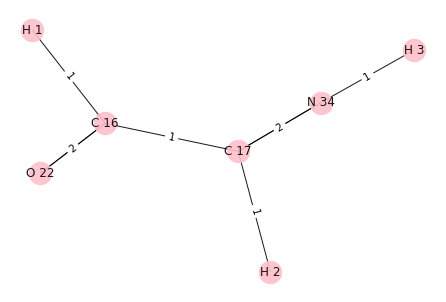

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


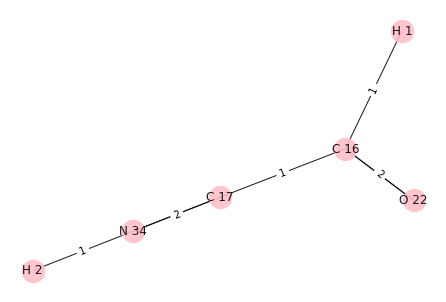

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


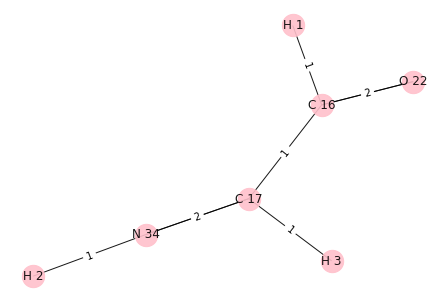

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


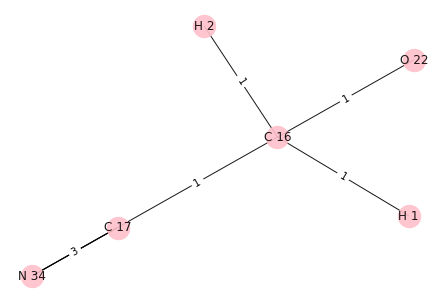

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


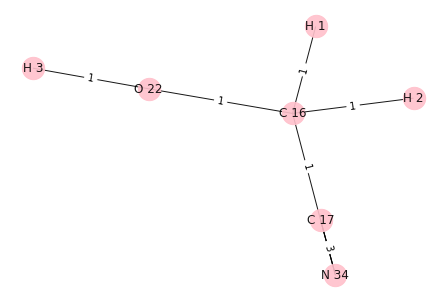

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


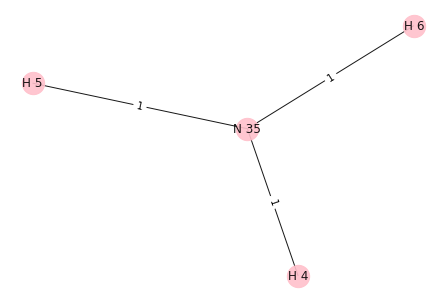

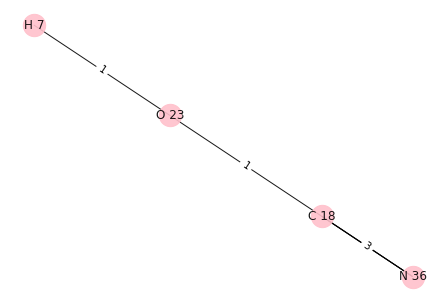

H 5
H 7
N 35 O 23


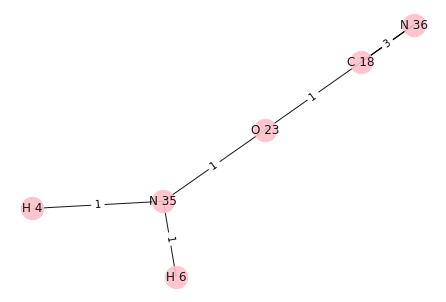

{N 36, H 4, O 23, C 18, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 5
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


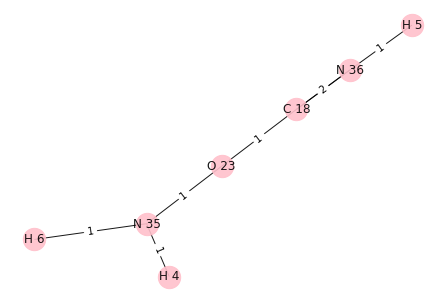

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


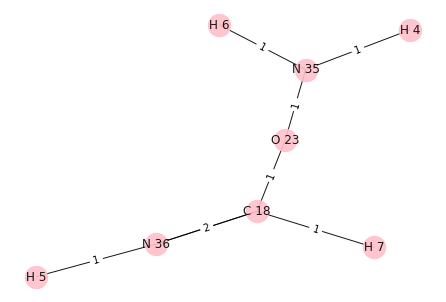

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 5
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


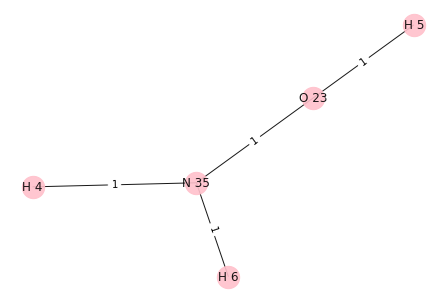

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


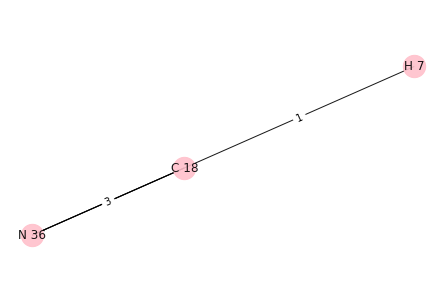

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 5
H 4 0
H 5 0
N 35 0
H 6 0


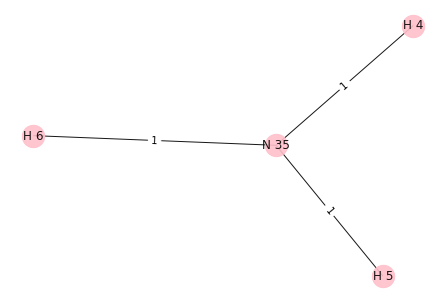

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


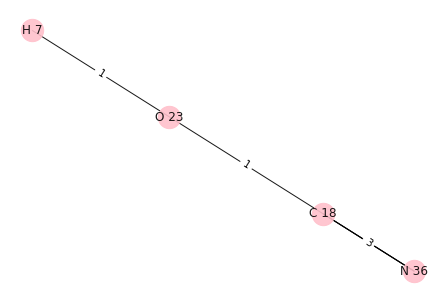

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 5
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


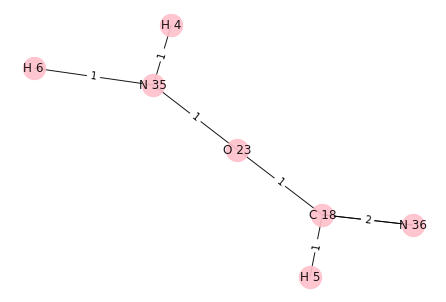

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


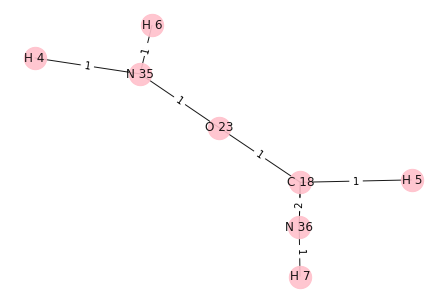

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


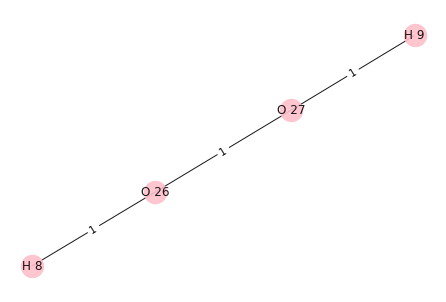

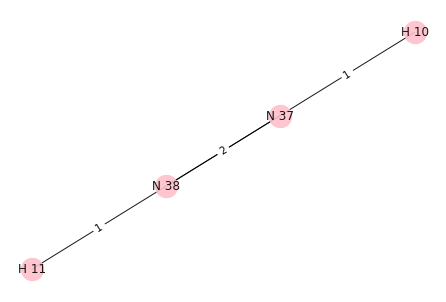

H 8
H 10
O 26 N 37


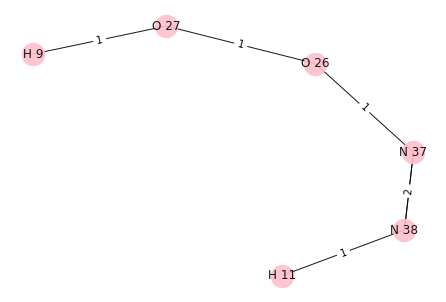

{O 26, H 9, O 27, H 11, N 38, N 37}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
H 11 0
N 38 0
N 37 0
H 8 0


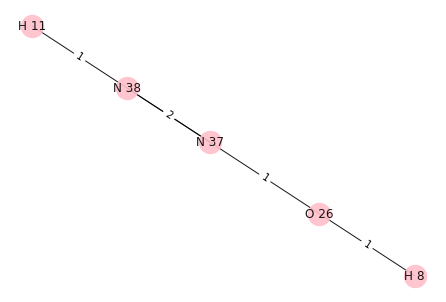

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


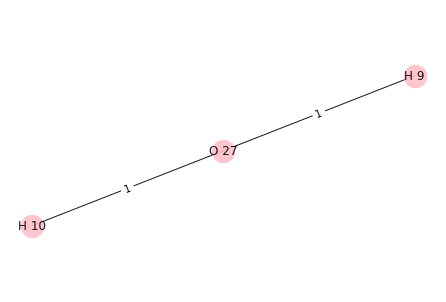

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 8
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


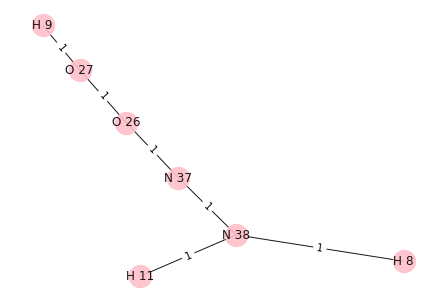

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


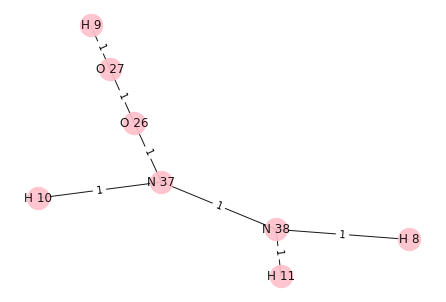

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 9 0
H 8 0
O 27 0


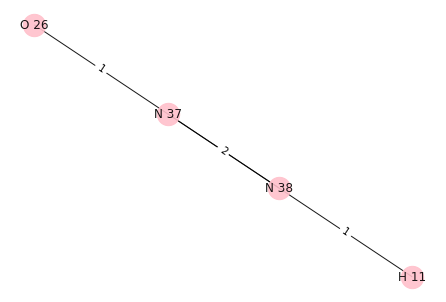

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


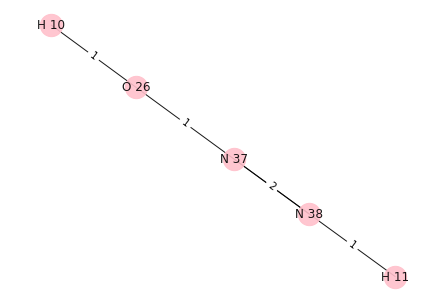

i: 3
Removing edge between: N 37 O 26
Adding edge between: N 37 H 8
H 11 0
H 8 0
N 38 0
N 37 0


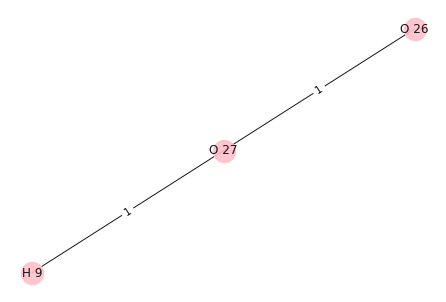

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


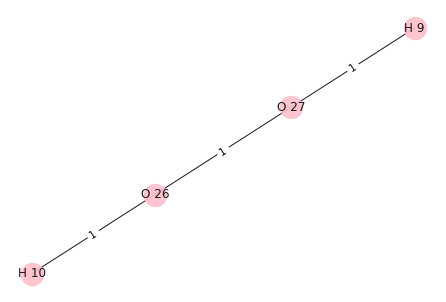

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


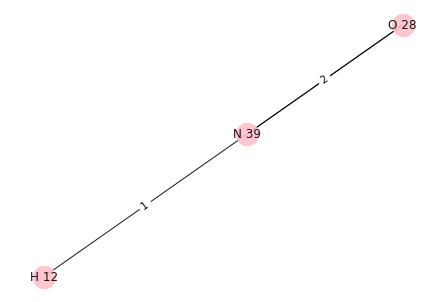

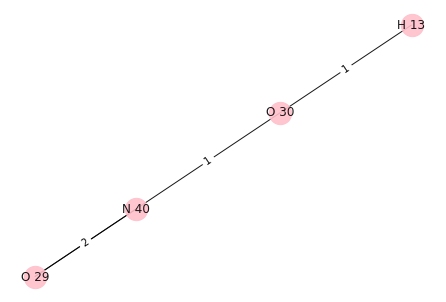

H 12
H 13
N 39 O 30


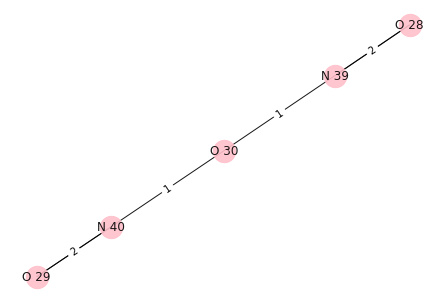

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


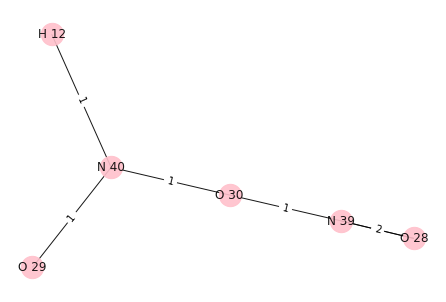

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


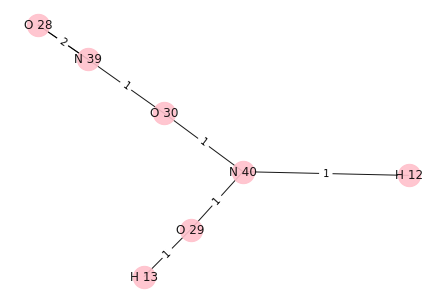

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


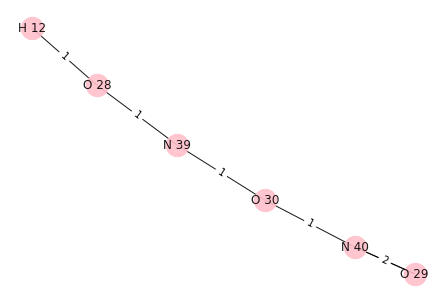

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


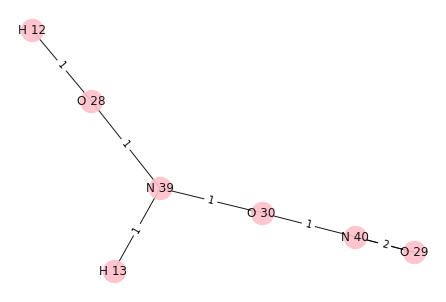

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


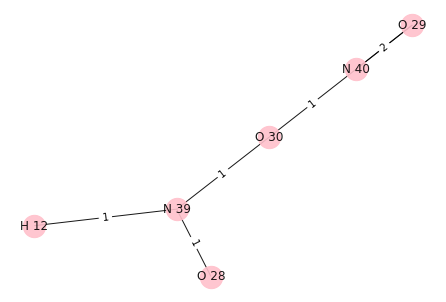

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


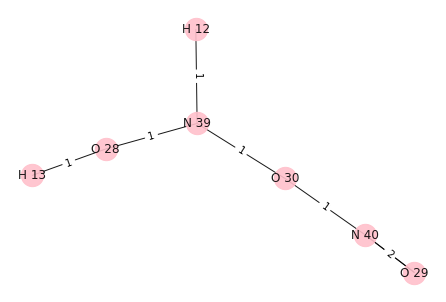

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


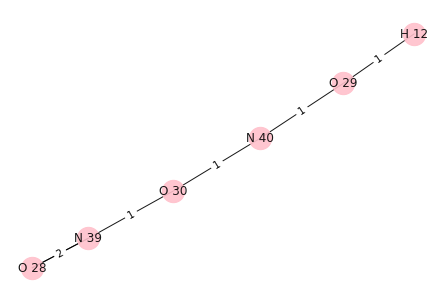

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


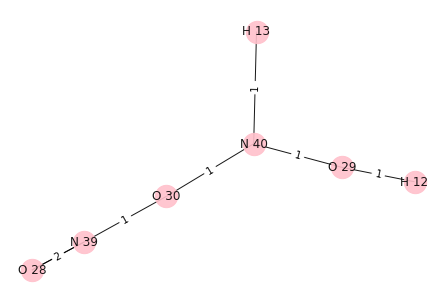

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


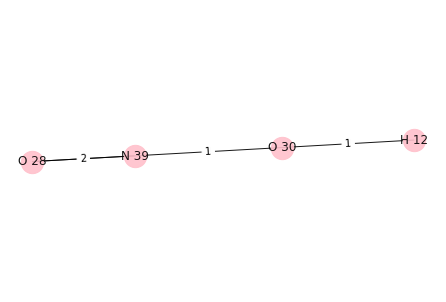

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


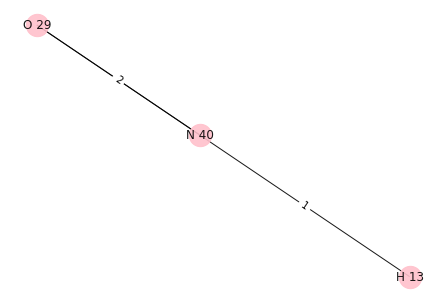

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


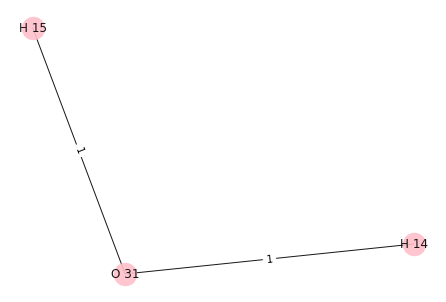

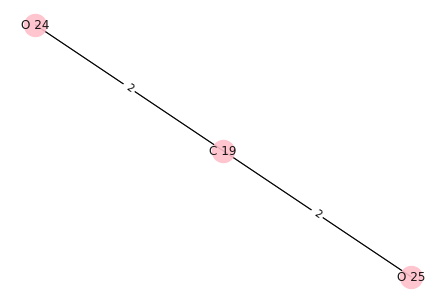

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


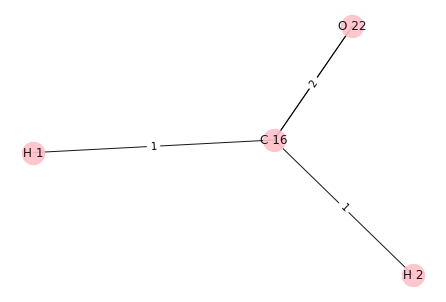

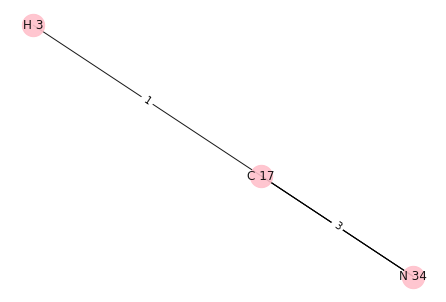

H 1
H 3
C 16 C 17


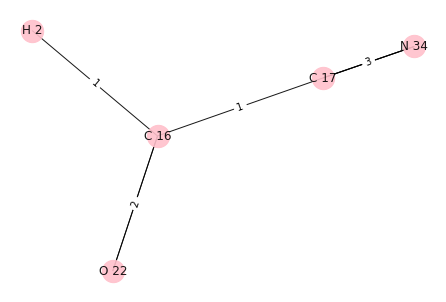

{O 22, N 34, C 16, H 2, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


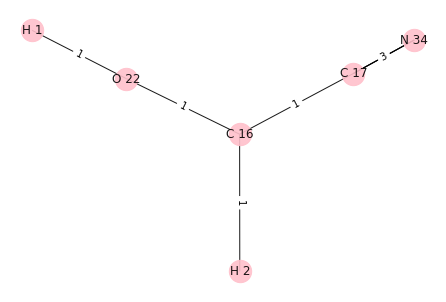

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


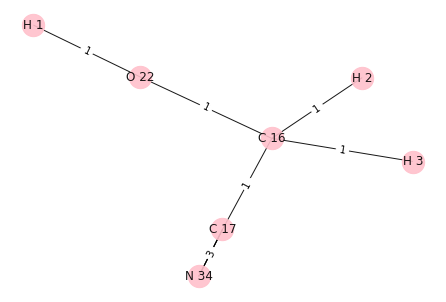

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


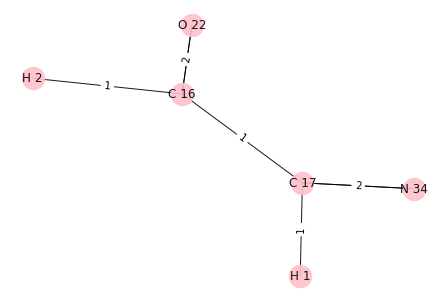

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


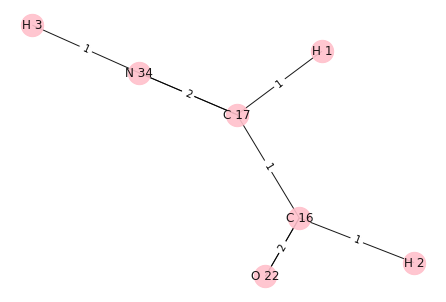

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


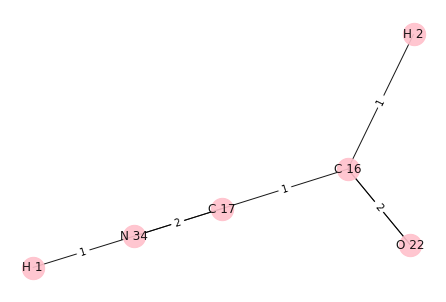

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


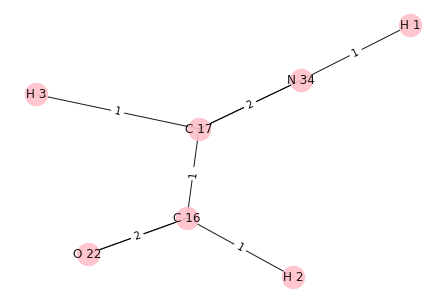

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


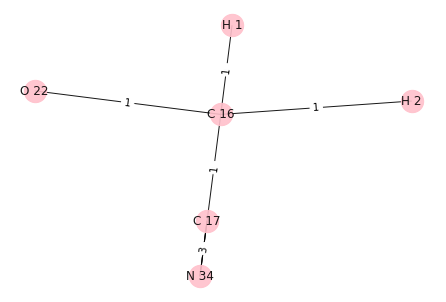

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


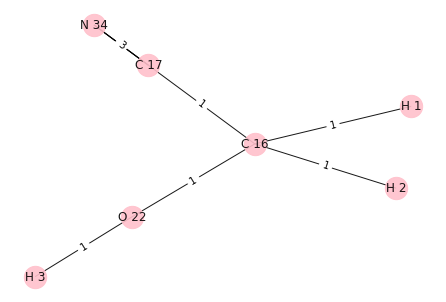

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


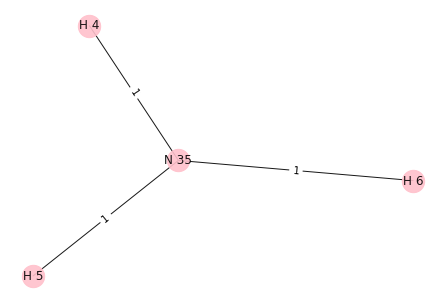

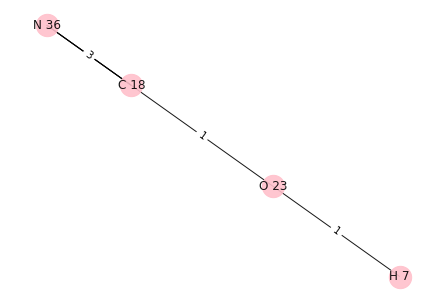

H 6
H 7
N 35 O 23


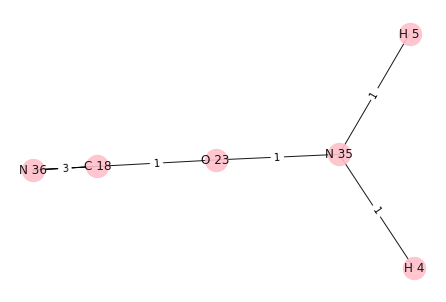

{N 36, H 4, O 23, C 18, H 5, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 6
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


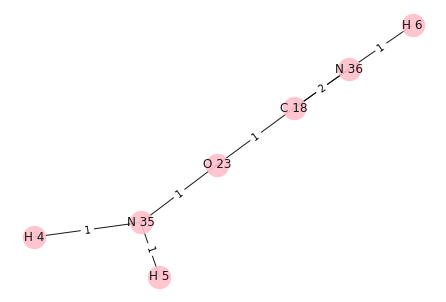

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


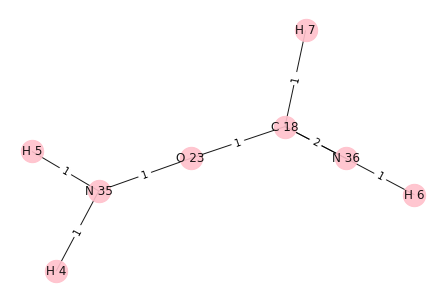

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 6
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


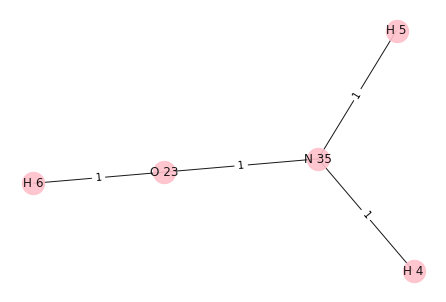

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


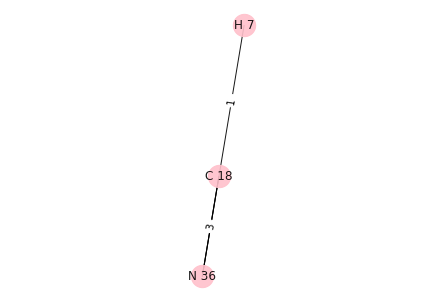

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 6
H 4 0
H 5 0
N 35 0
H 6 0


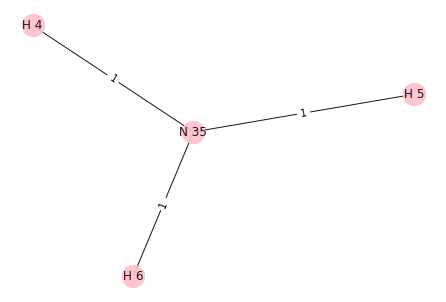

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


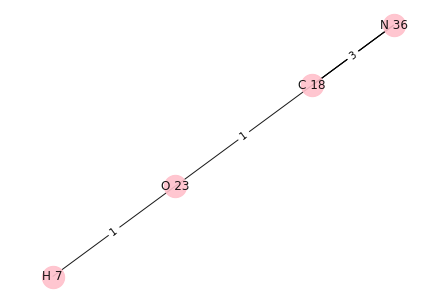

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 6
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


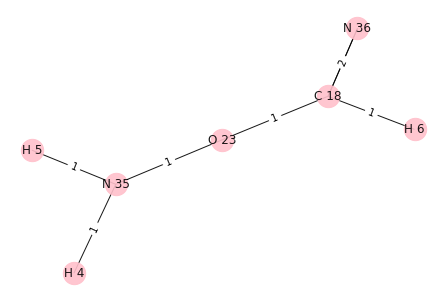

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


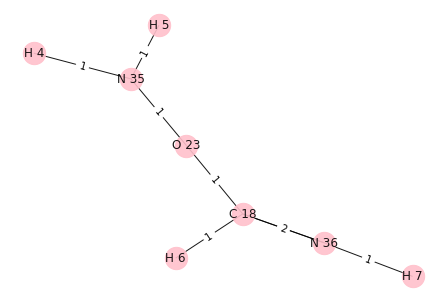

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


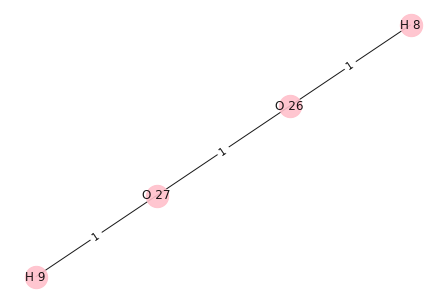

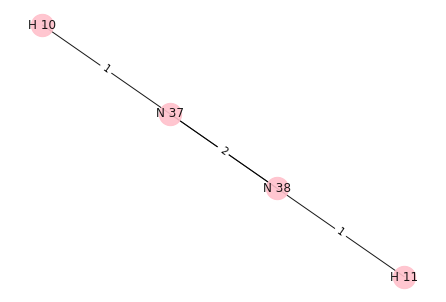

H 9
H 10
O 27 N 37


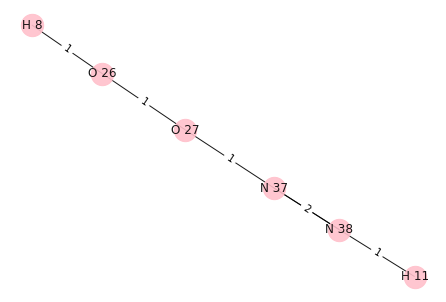

{O 26, O 27, H 11, N 38, N 37, H 8}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
O 26 0
H 8 0
H 9 0


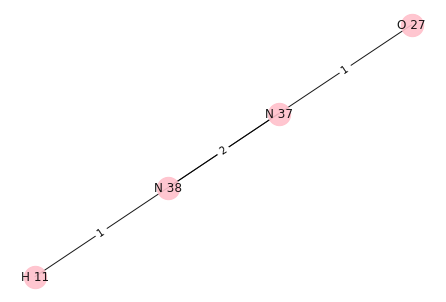

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


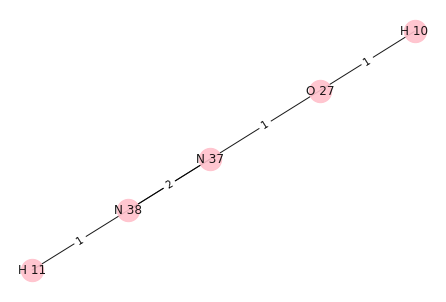

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


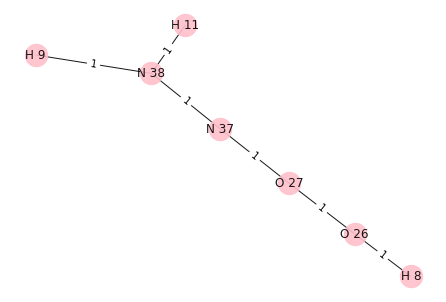

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


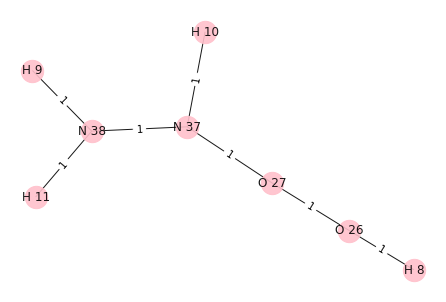

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
H 9 0
O 27 0
H 11 0
N 38 0
N 37 0


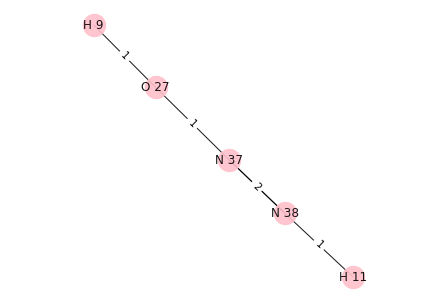

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


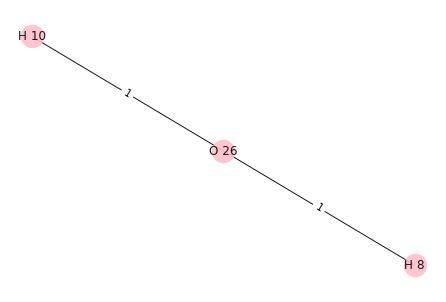

i: 3
Removing edge between: N 37 O 27
Adding edge between: N 37 H 9
H 11 0
H 9 0
N 38 0
N 37 0


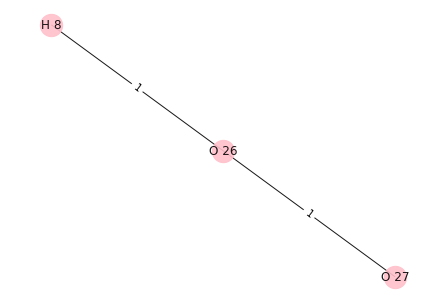

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


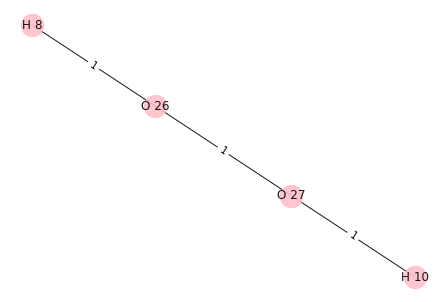

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


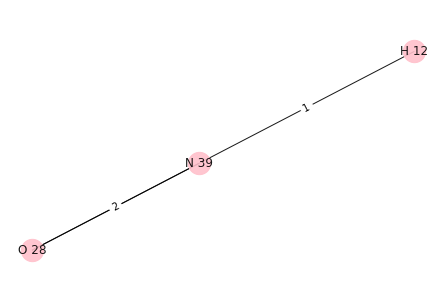

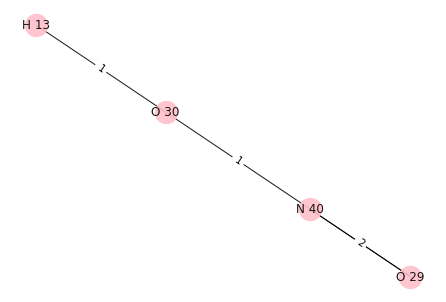

H 12
H 13
N 39 O 30


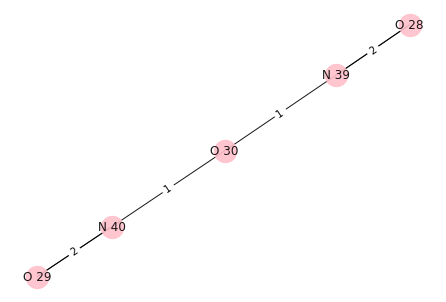

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


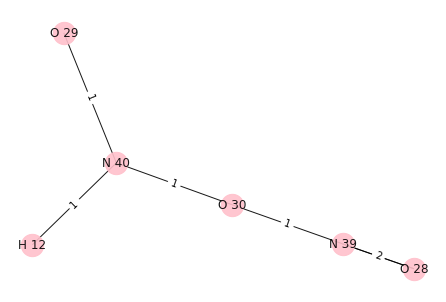

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


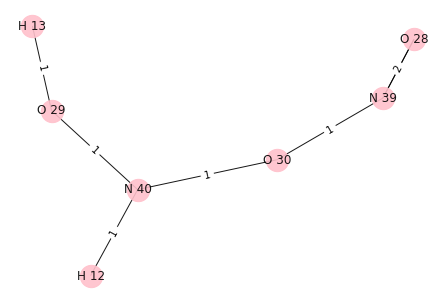

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


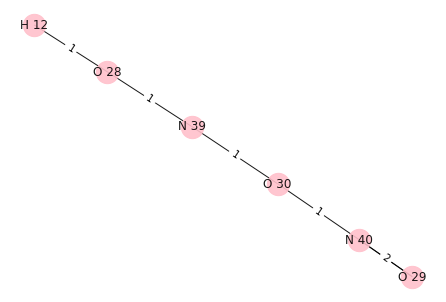

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


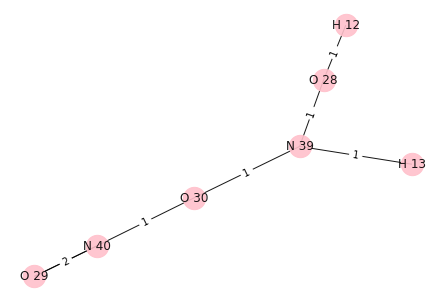

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


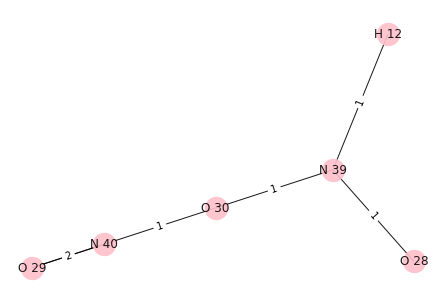

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


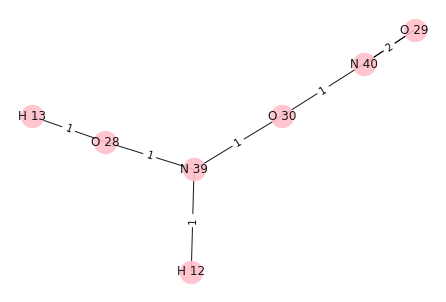

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


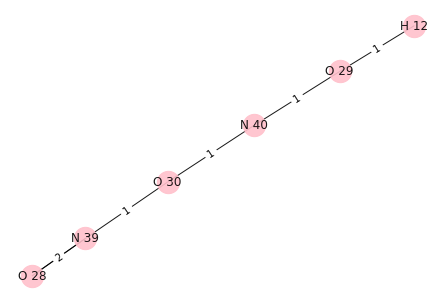

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


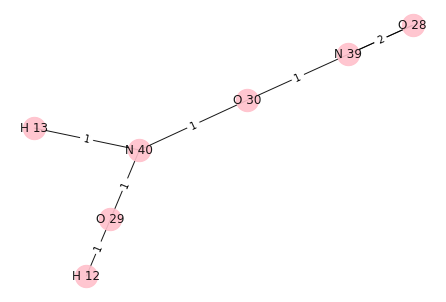

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


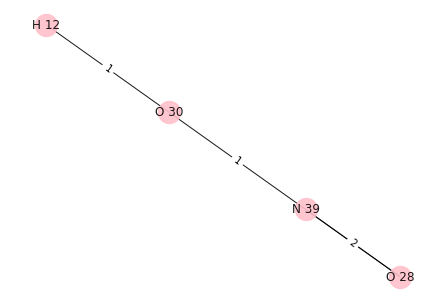

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


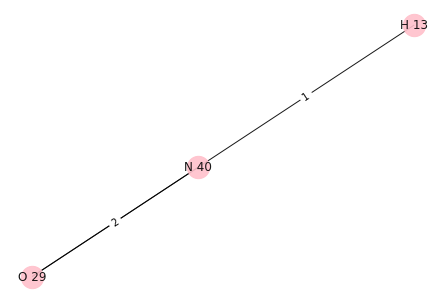

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


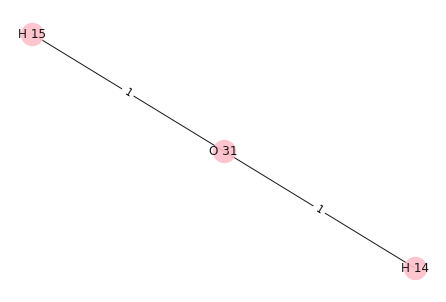

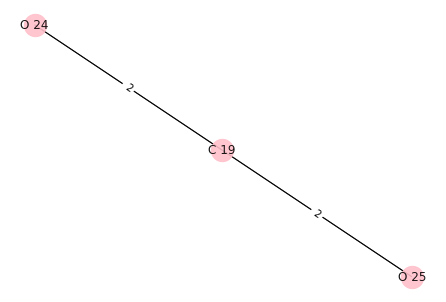

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


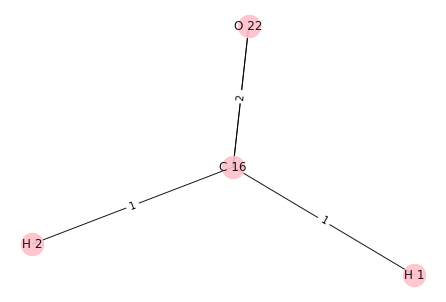

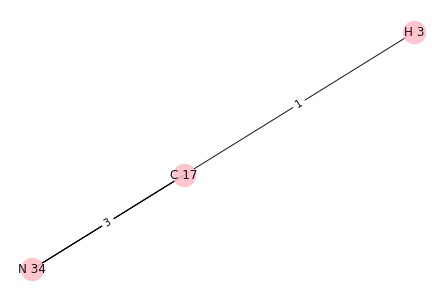

H 1
H 3
C 16 C 17


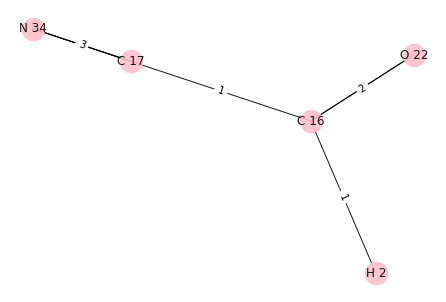

{O 22, N 34, C 16, H 2, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


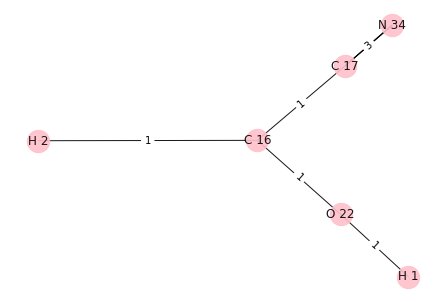

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


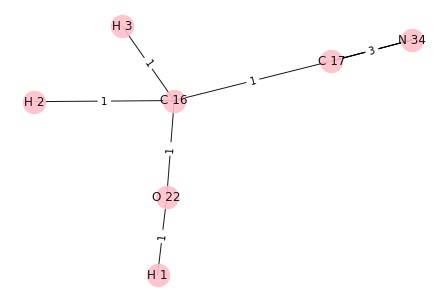

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


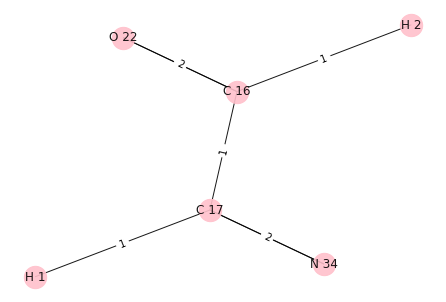

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


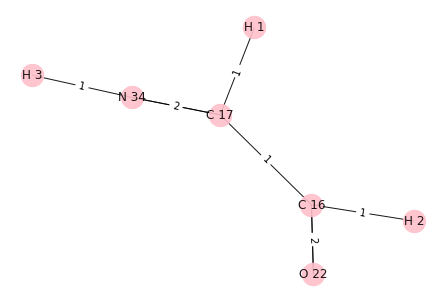

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


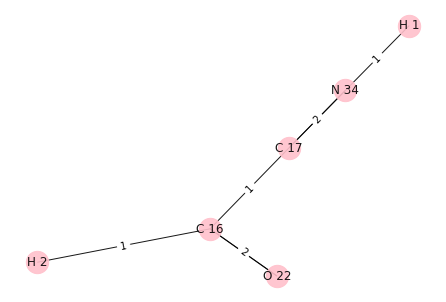

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


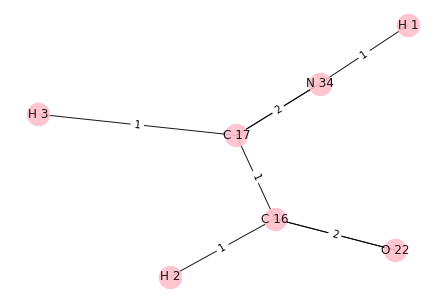

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


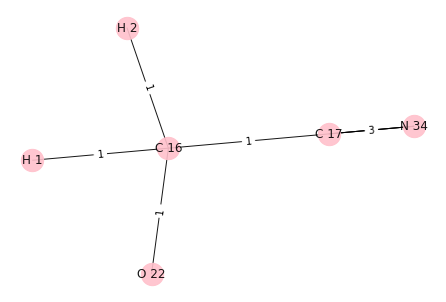

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


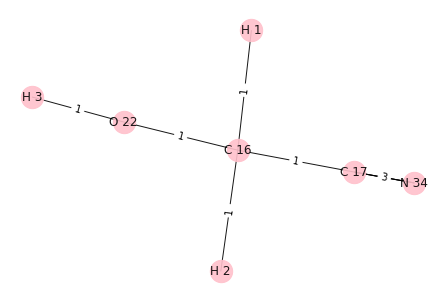

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


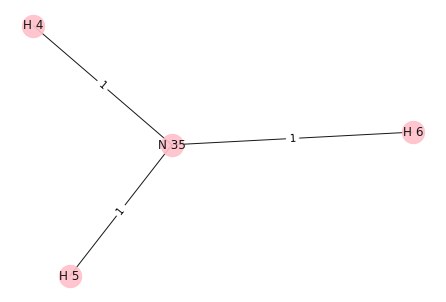

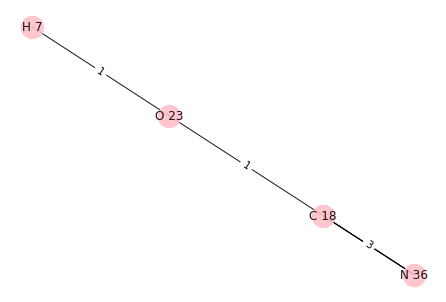

H 4
H 7
N 35 O 23


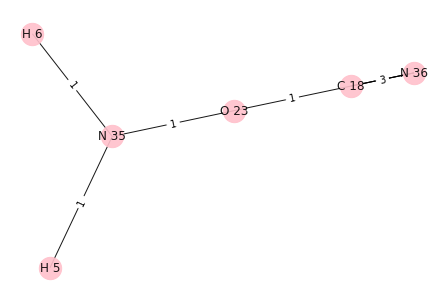

{N 36, O 23, C 18, H 5, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


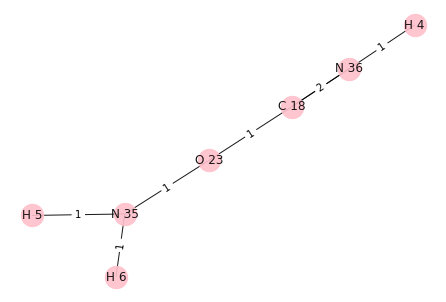

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


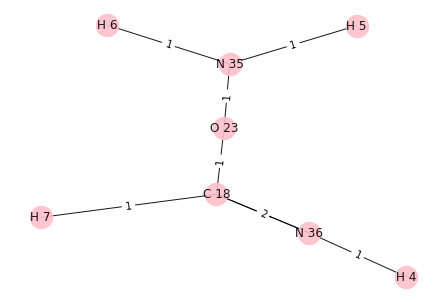

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


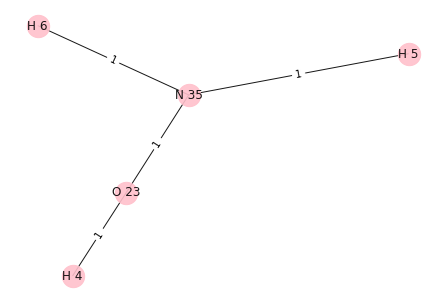

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


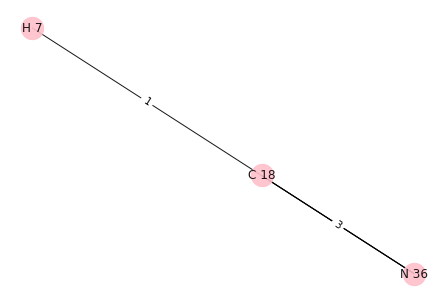

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
H 4 0
H 5 0
N 35 0
H 6 0


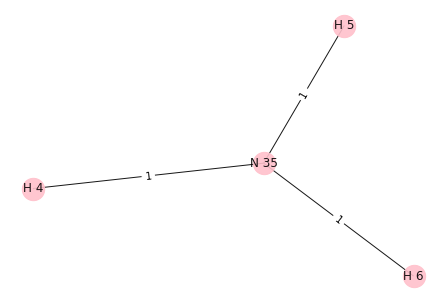

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


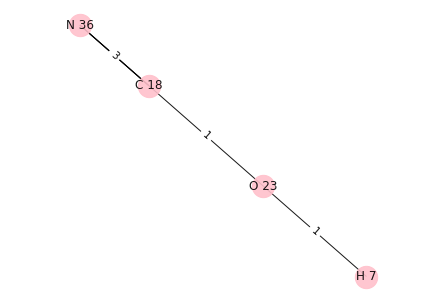

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 4
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


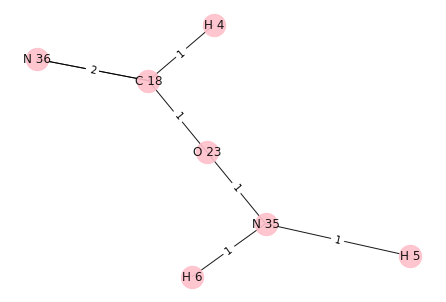

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


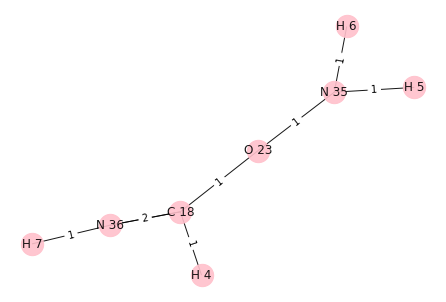

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


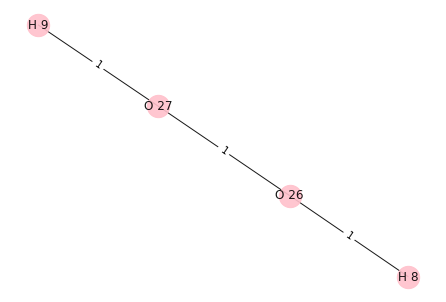

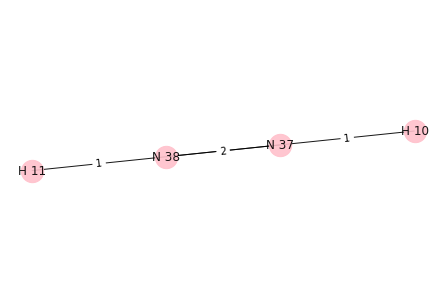

H 9
H 11
O 27 N 38


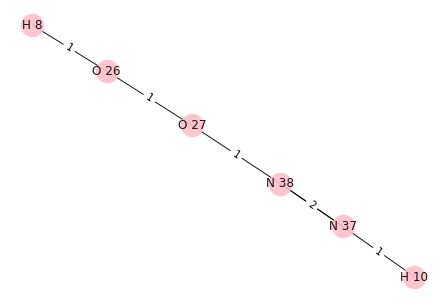

{O 26, O 27, N 38, N 37, H 10, H 8}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
O 26 0
H 8 0
H 9 0


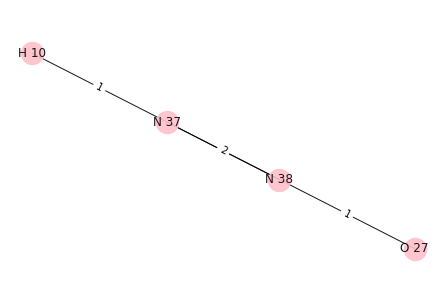

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 11


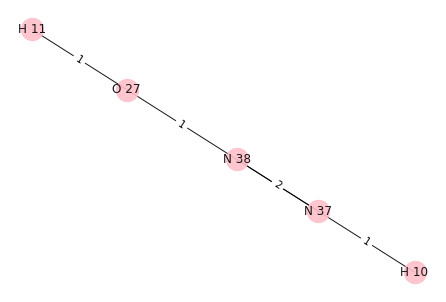

i: 1
Removing edge between: N 38 O 27
Adding edge between: N 38 H 9
H 10 0
H 9 0
N 38 0
N 37 0


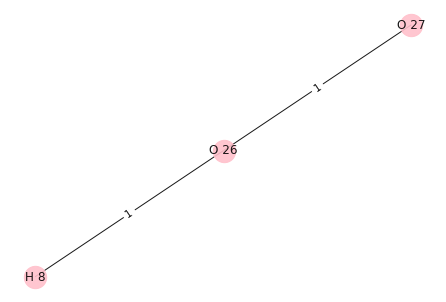

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 11


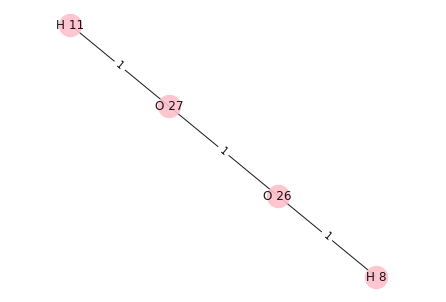

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
H 9 0
O 27 0
N 38 0
N 37 0
H 10 0


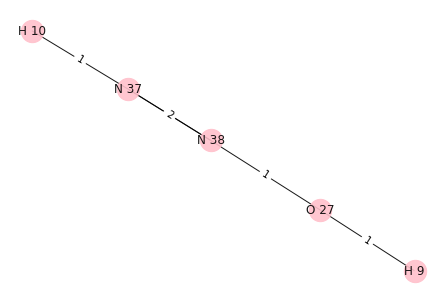

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


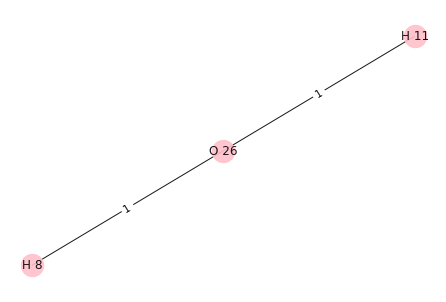

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 9
O 26 0
H 9 0
O 27 0
N 38 1
N 37 0
H 10 0
H 8 0


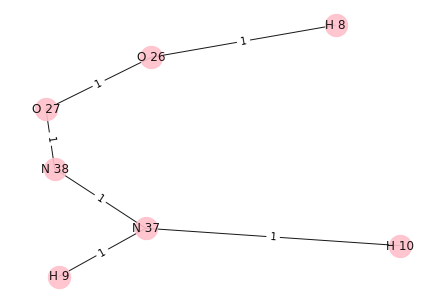

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 11


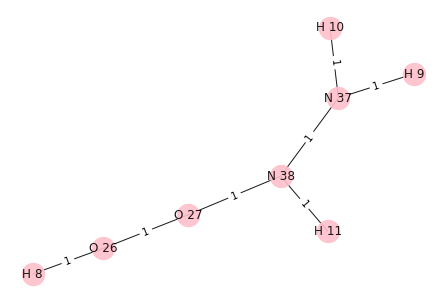

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


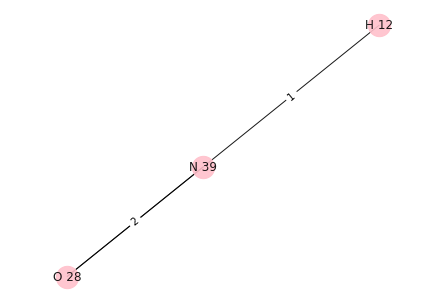

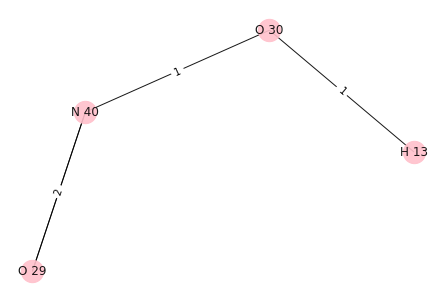

H 12
H 13
N 39 O 30


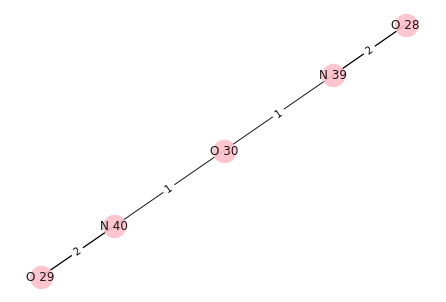

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


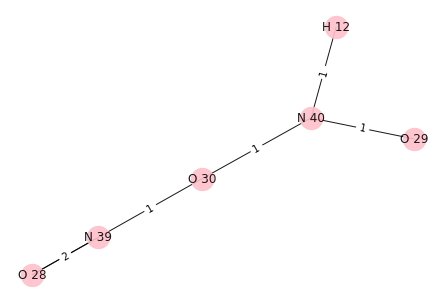

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


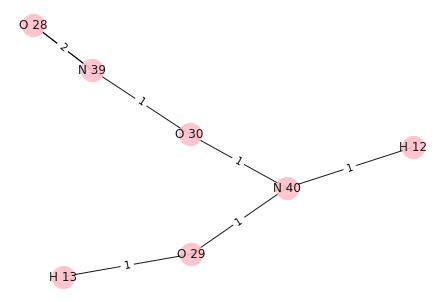

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


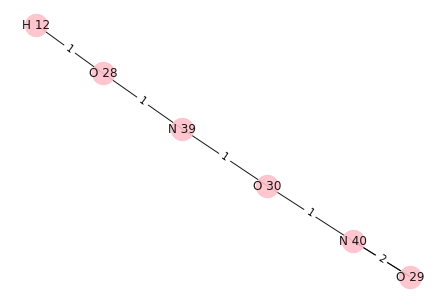

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


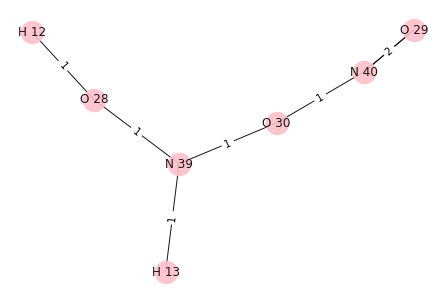

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


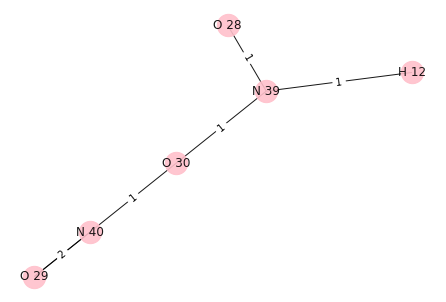

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


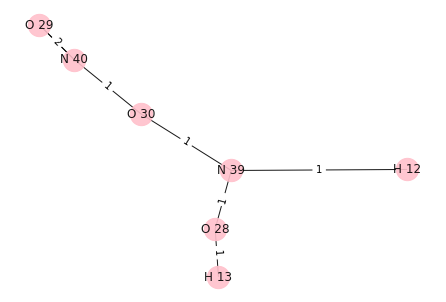

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


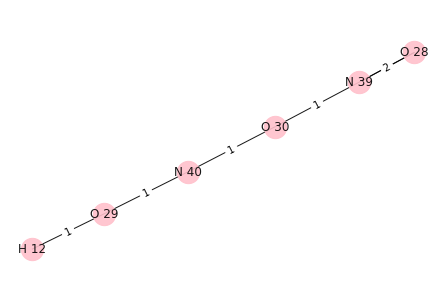

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


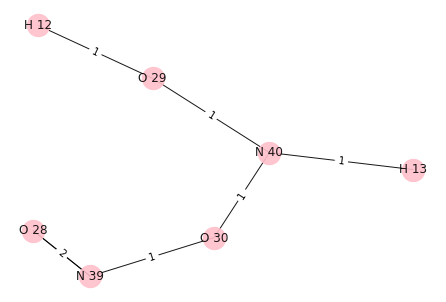

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


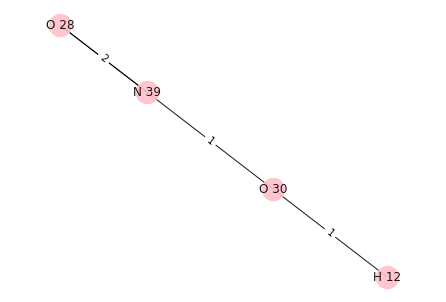

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


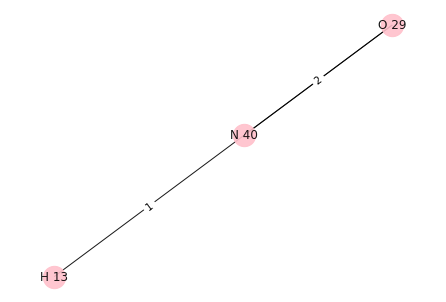

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


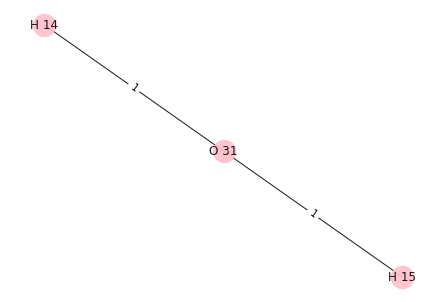

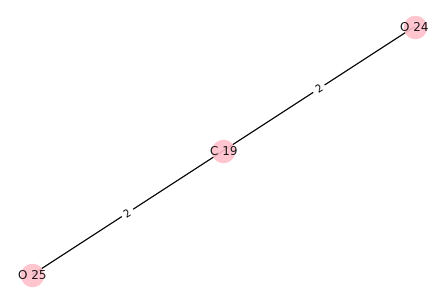

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


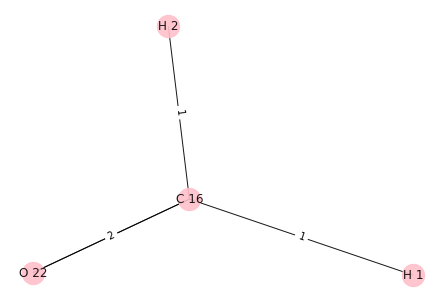

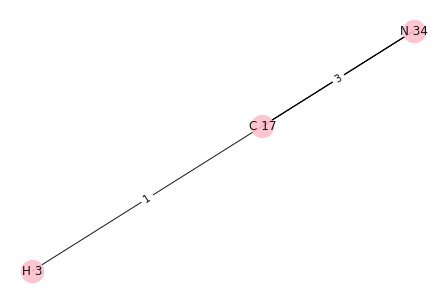

H 2
H 3
C 16 C 17


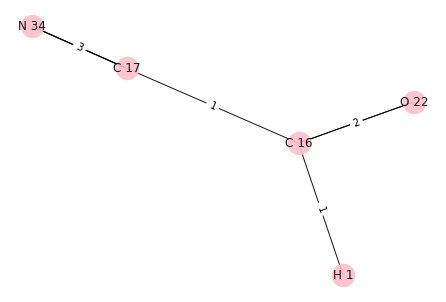

{O 22, H 1, N 34, C 16, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


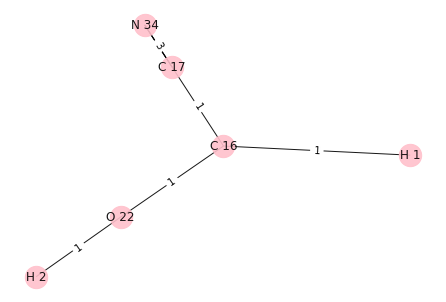

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


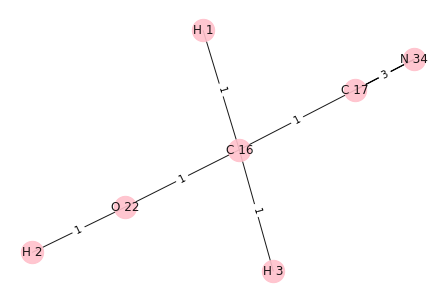

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


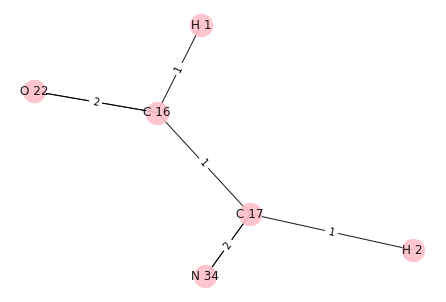

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


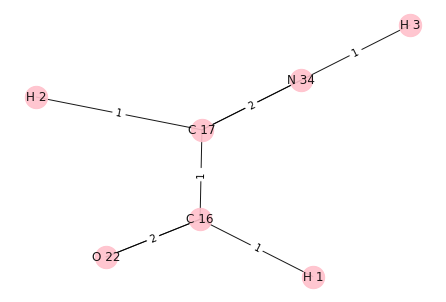

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


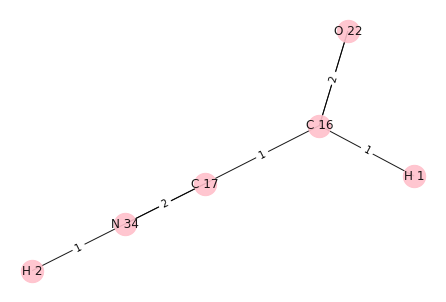

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


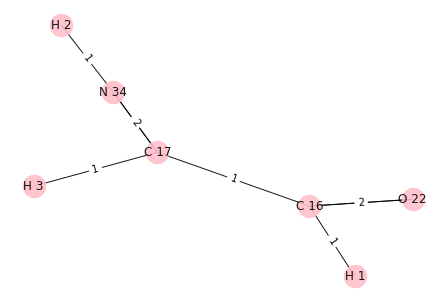

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


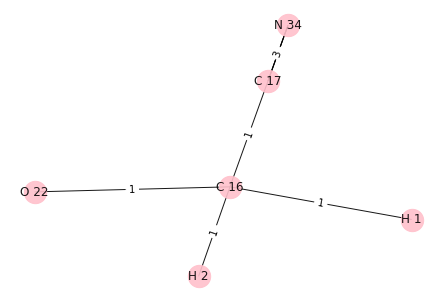

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


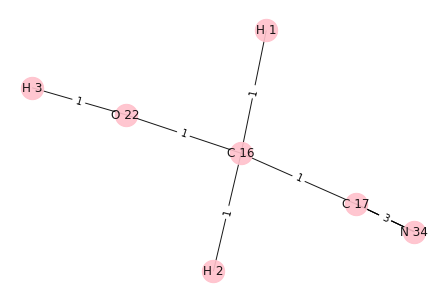

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


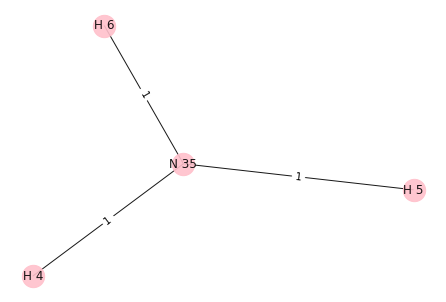

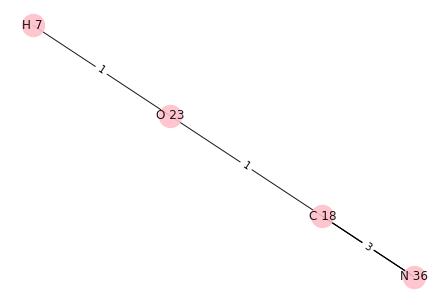

H 5
H 7
N 35 O 23


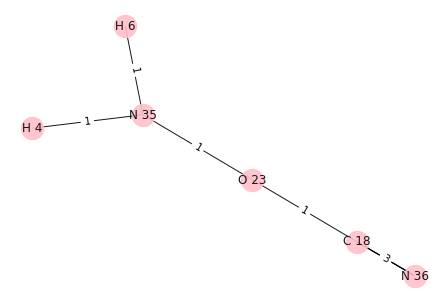

{N 36, H 4, O 23, C 18, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 5
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


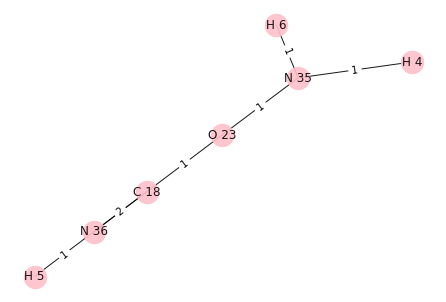

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


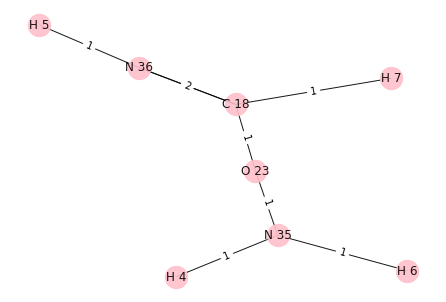

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 5
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


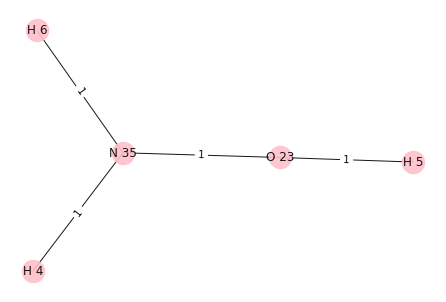

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


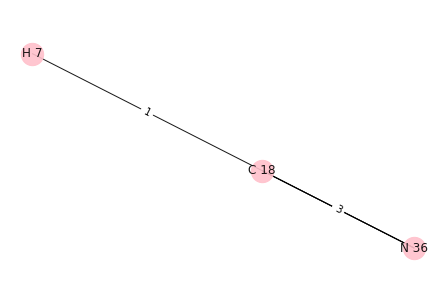

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 5
H 4 0
H 5 0
N 35 0
H 6 0


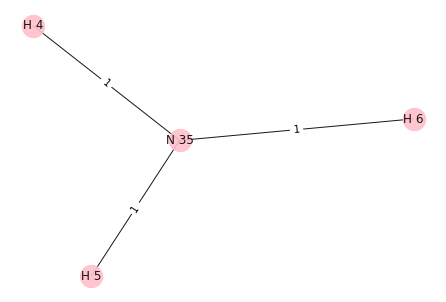

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


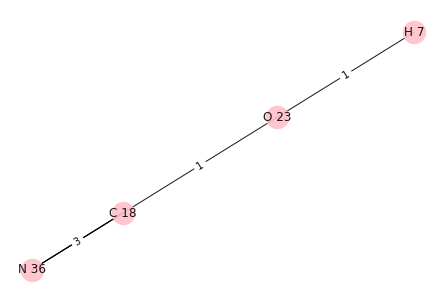

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 5
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


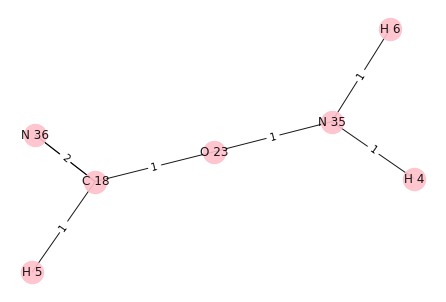

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


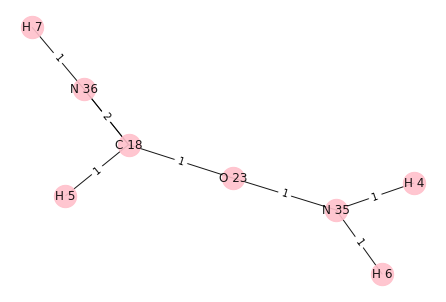

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


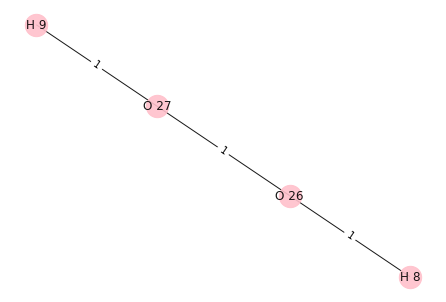

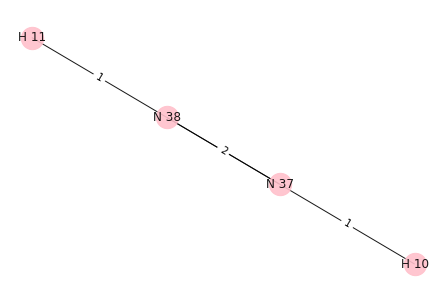

H 8
H 11
O 26 N 38


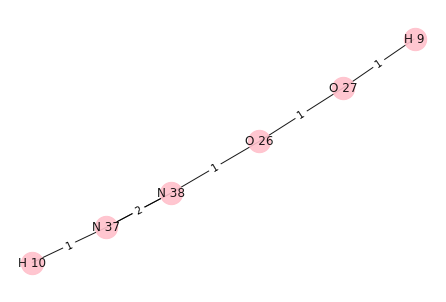

{O 26, H 9, O 27, N 38, N 37, H 10}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
N 38 0
N 37 0
H 10 0
H 8 0


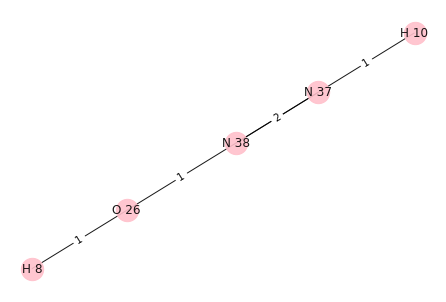

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 11


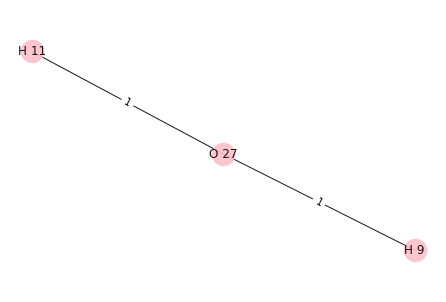

i: 1
Removing edge between: N 38 O 26
Adding edge between: N 38 H 8
H 10 0
H 8 0
N 38 0
N 37 0


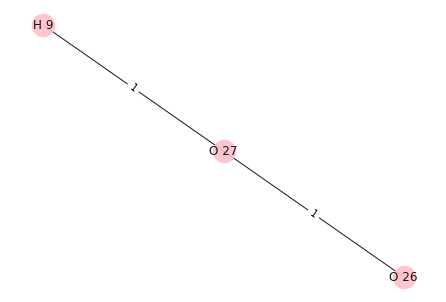

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


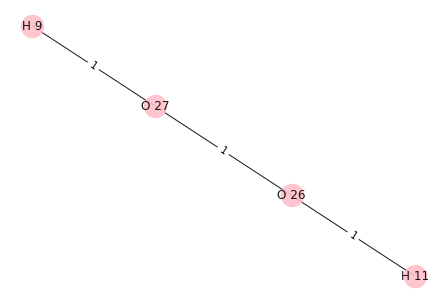

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 9 0
H 8 0
O 27 0


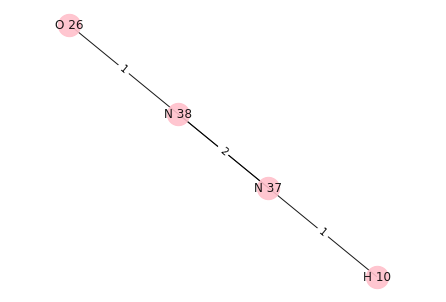

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


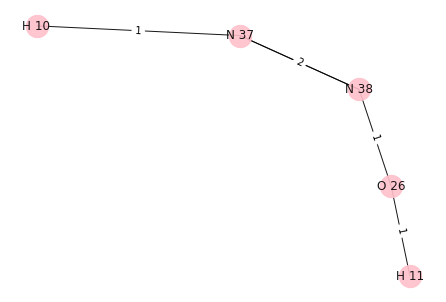

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 8
O 26 0
H 9 0
O 27 0
N 38 1
N 37 0
H 10 0
H 8 0


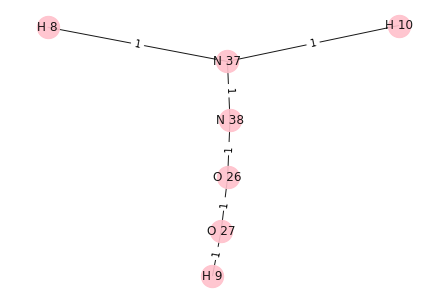

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 11


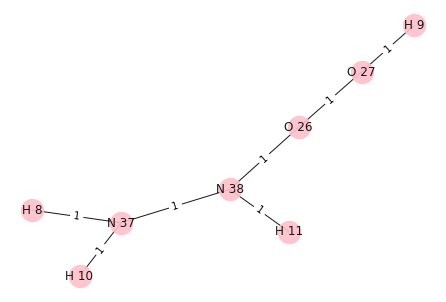

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


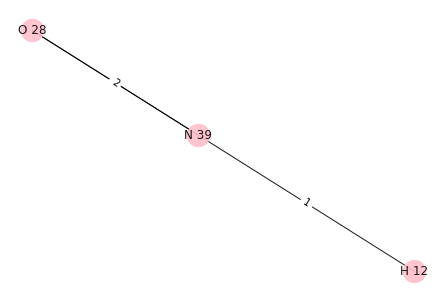

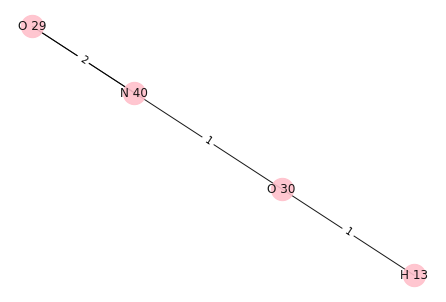

H 12
H 13
N 39 O 30


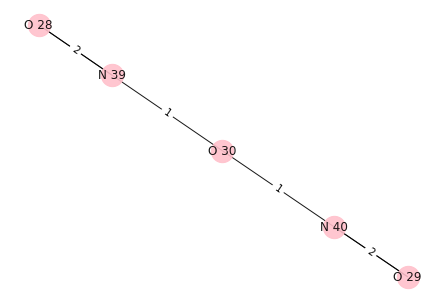

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


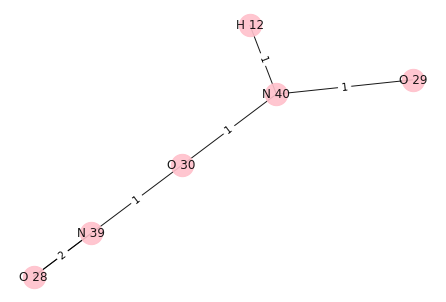

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


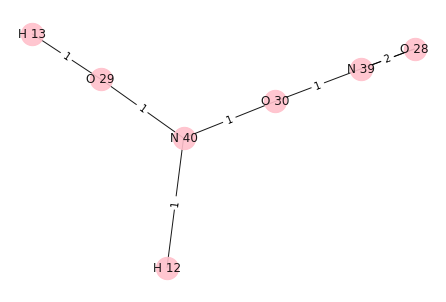

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


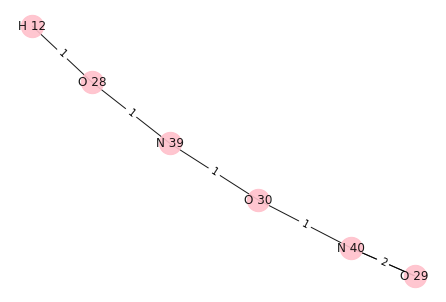

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


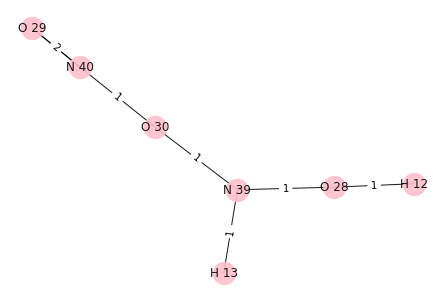

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


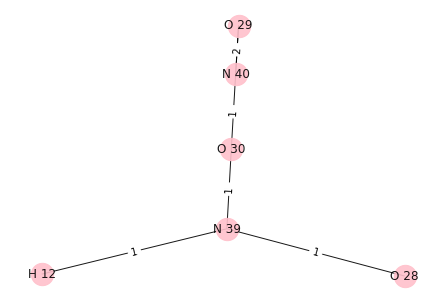

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


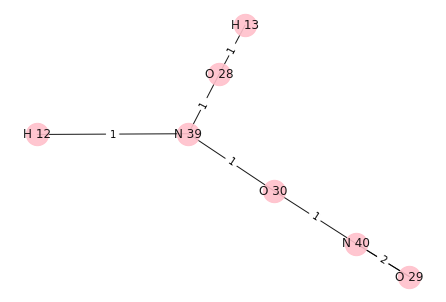

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


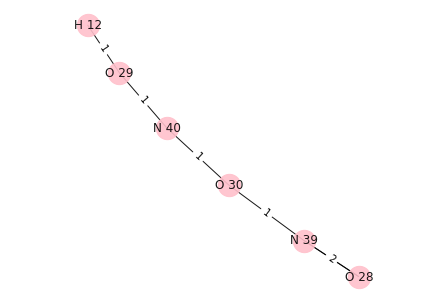

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


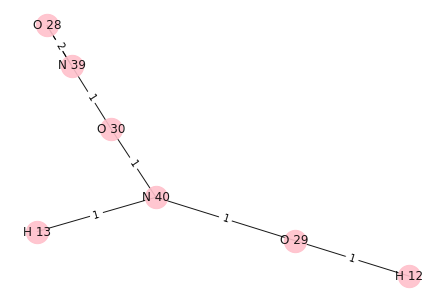

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


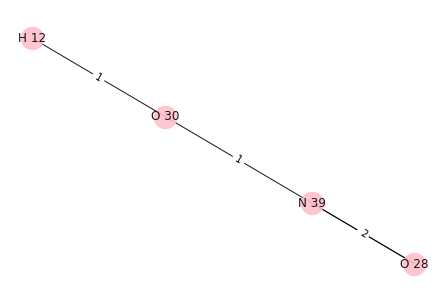

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


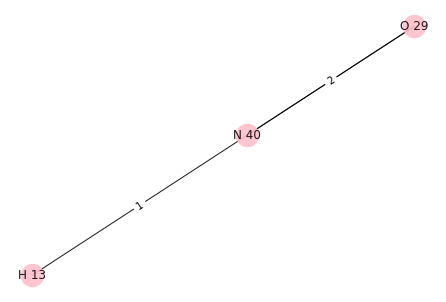

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


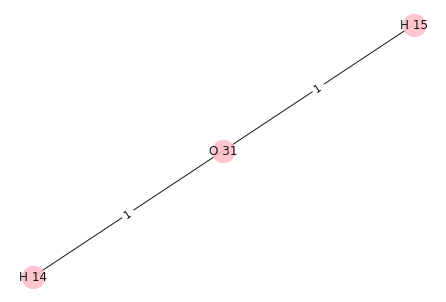

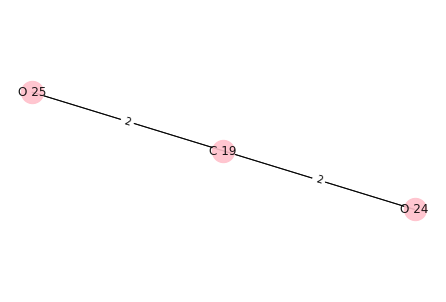

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


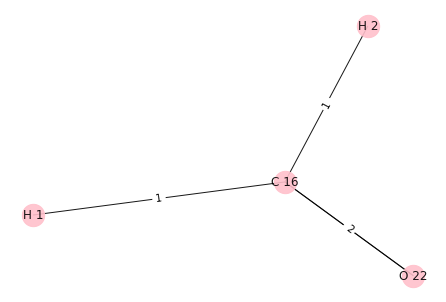

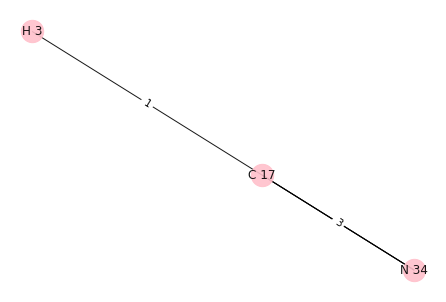

H 1
H 3
C 16 C 17


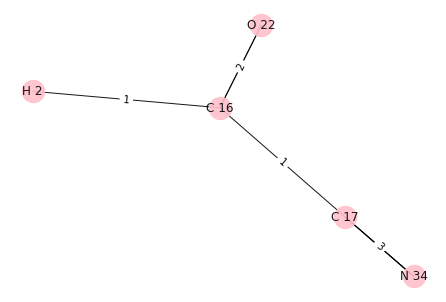

{O 22, N 34, C 16, H 2, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


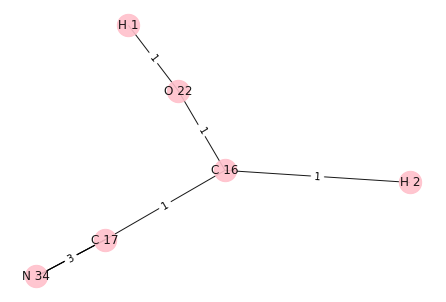

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


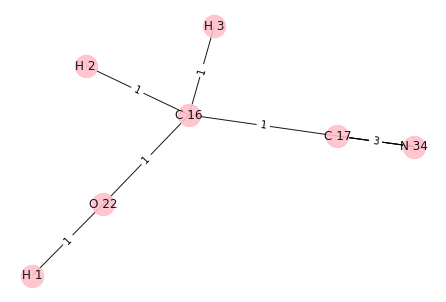

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


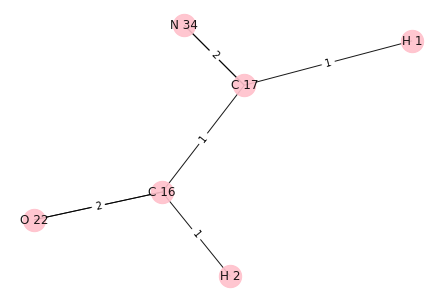

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


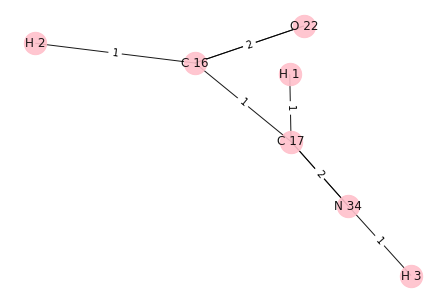

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


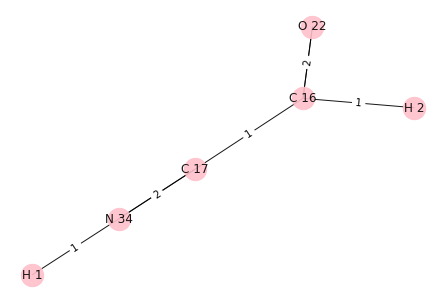

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


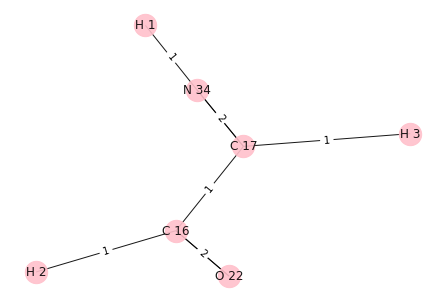

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


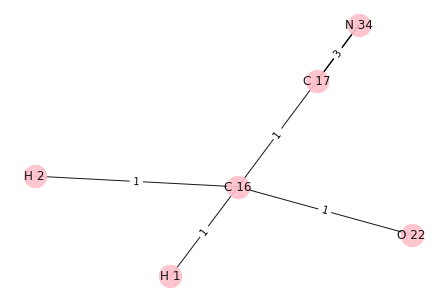

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


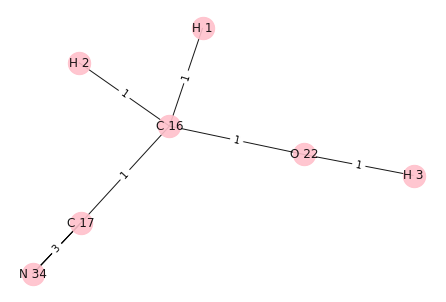

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


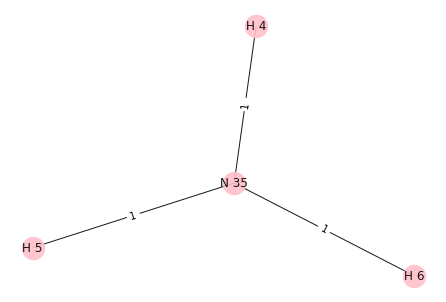

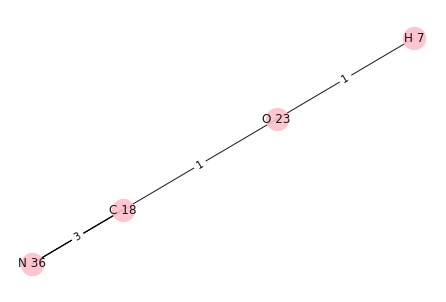

H 5
H 7
N 35 O 23


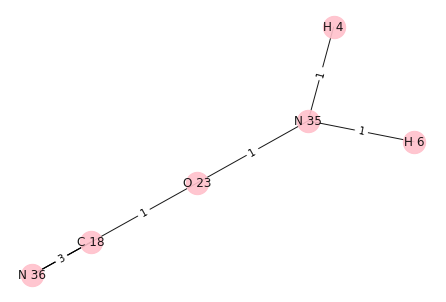

{N 36, H 4, O 23, C 18, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 5
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


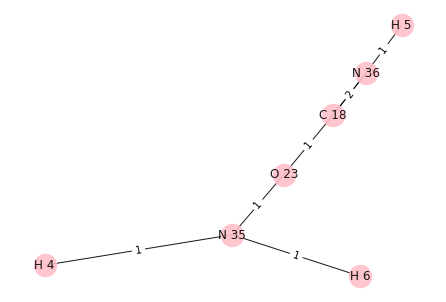

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


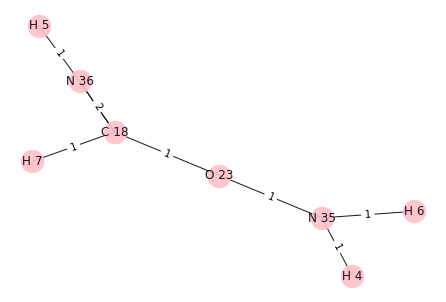

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 5
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


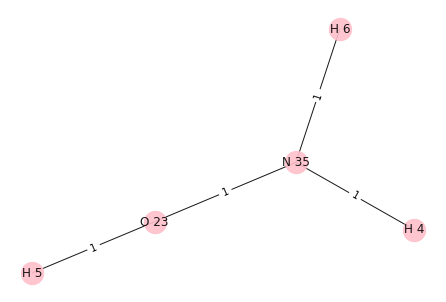

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


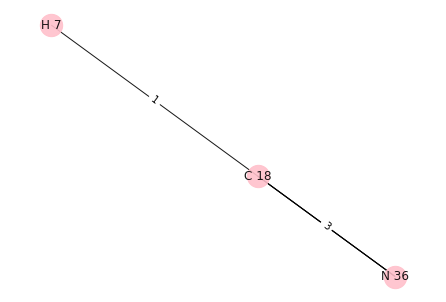

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 5
H 4 0
H 5 0
N 35 0
H 6 0


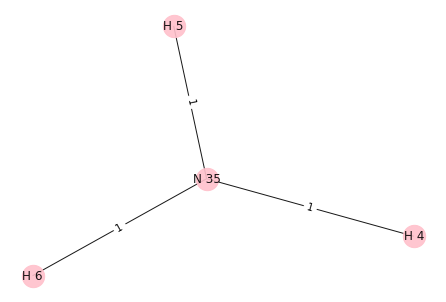

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


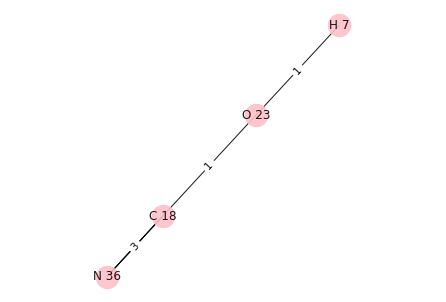

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 5
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


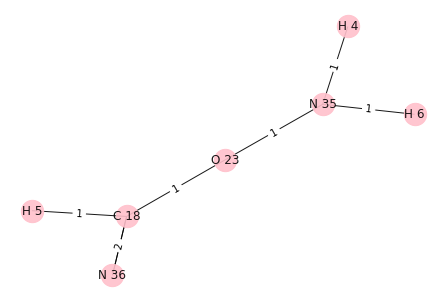

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


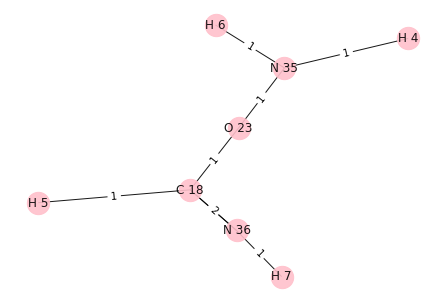

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


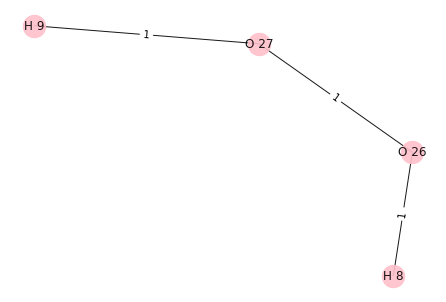

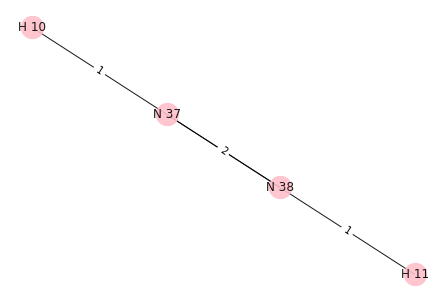

H 8
H 10
O 26 N 37


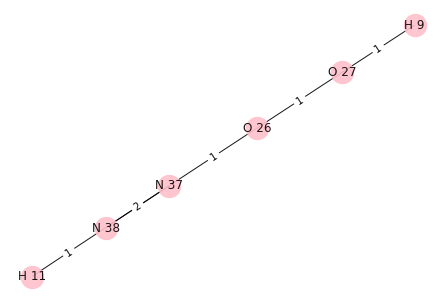

{O 26, H 9, O 27, H 11, N 38, N 37}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
H 11 0
N 38 0
N 37 0
H 8 0


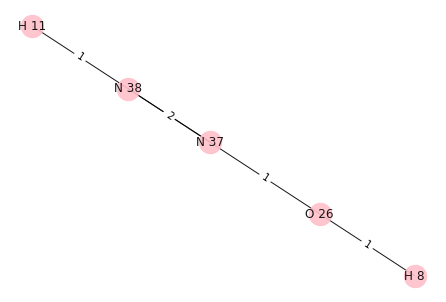

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


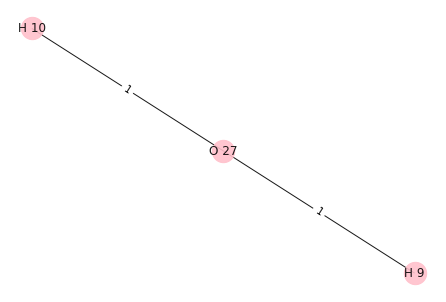

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 8
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


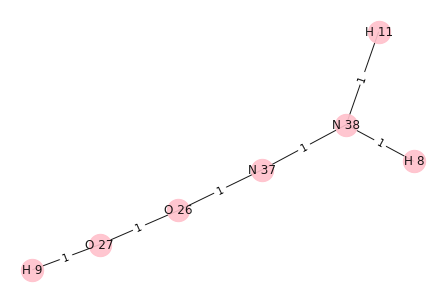

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


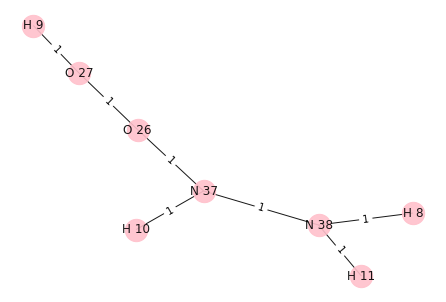

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 9 0
H 8 0
O 27 0


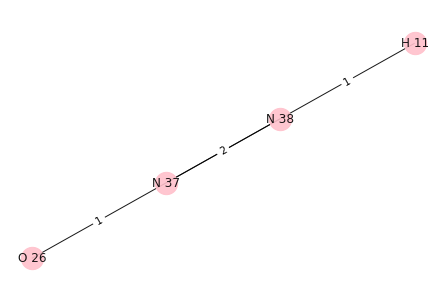

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


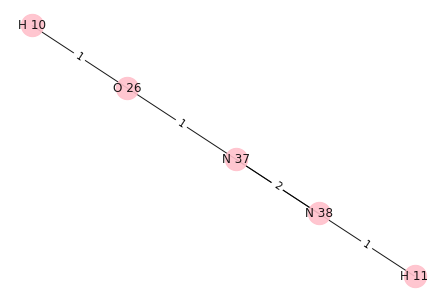

i: 3
Removing edge between: N 37 O 26
Adding edge between: N 37 H 8
H 11 0
H 8 0
N 38 0
N 37 0


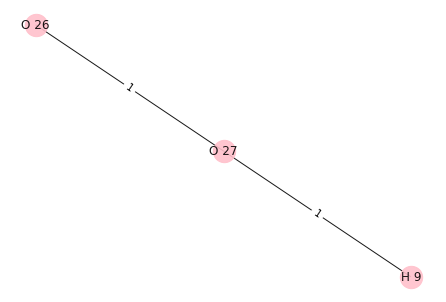

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


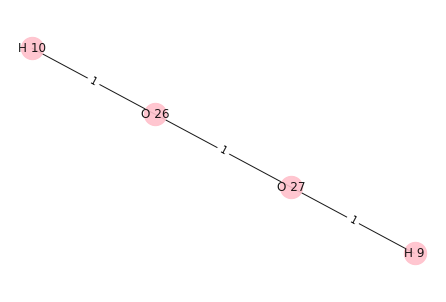

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


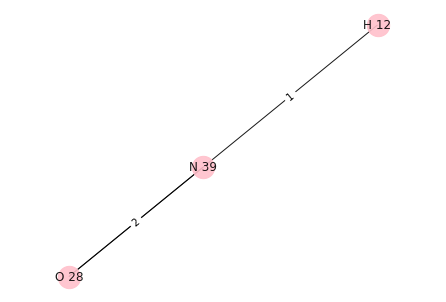

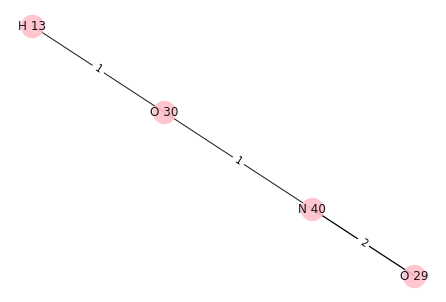

H 12
H 13
N 39 O 30


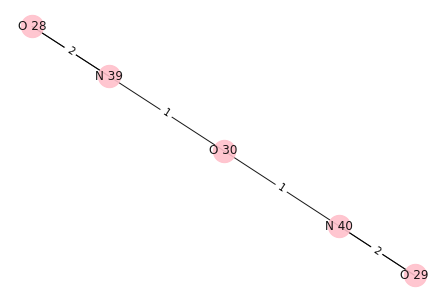

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


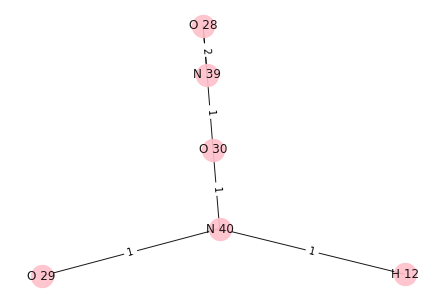

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


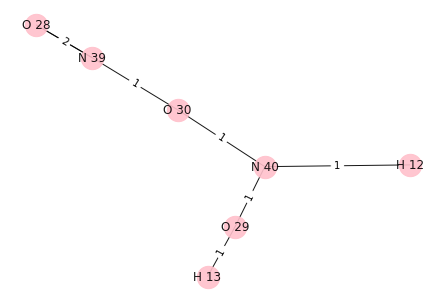

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


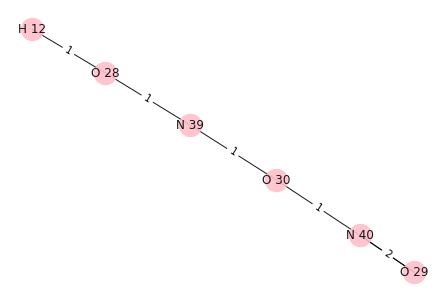

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


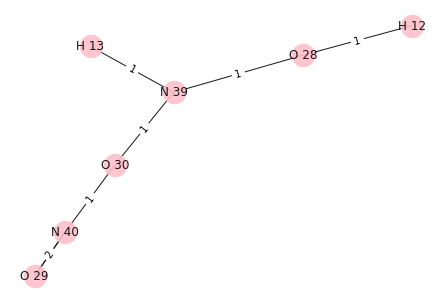

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


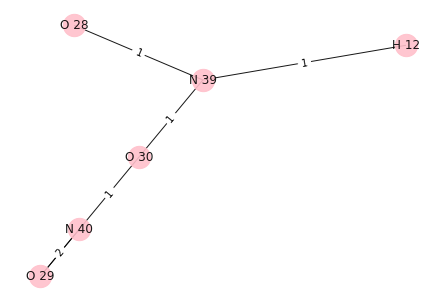

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


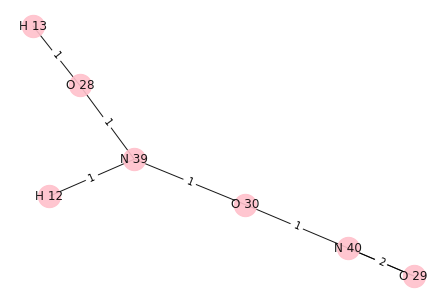

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


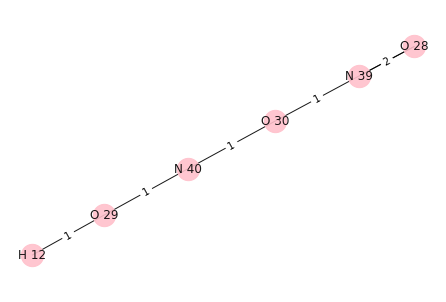

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


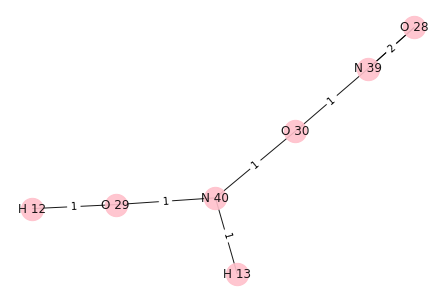

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


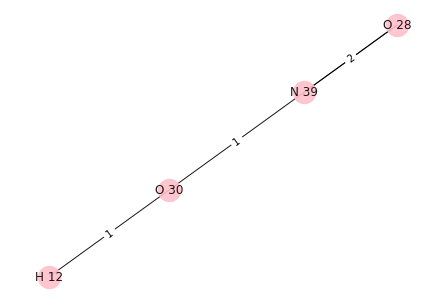

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


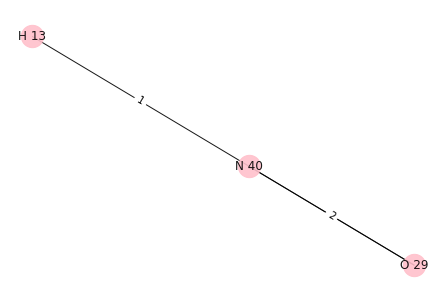

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


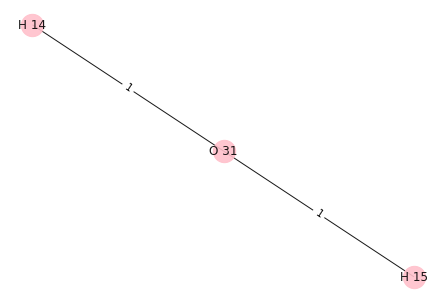

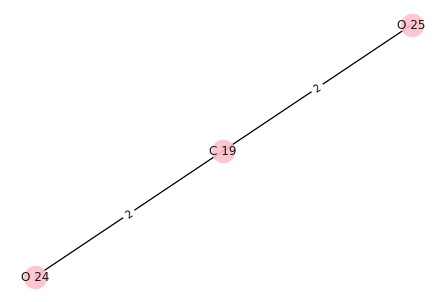

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


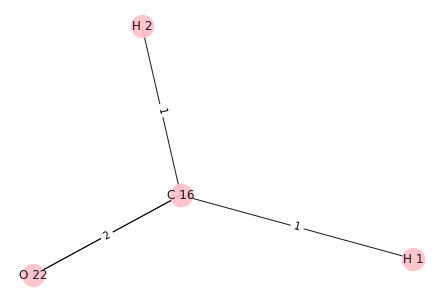

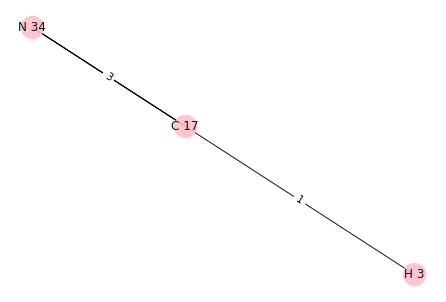

H 2
H 3
C 16 C 17


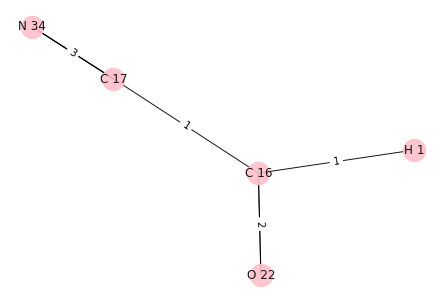

{O 22, H 1, N 34, C 16, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


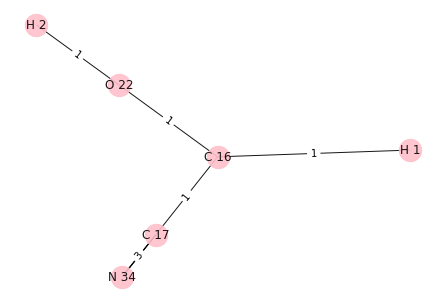

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


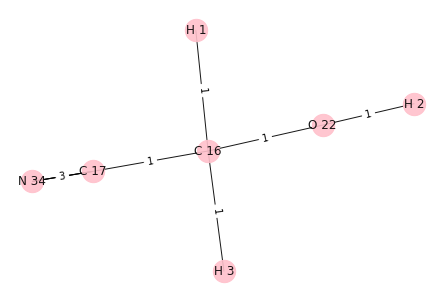

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


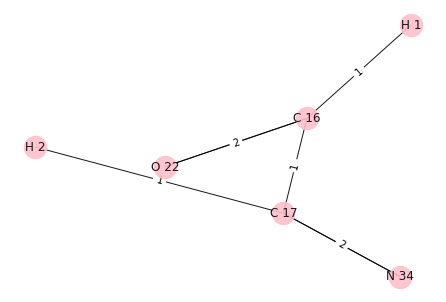

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


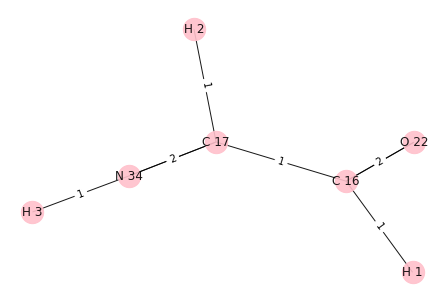

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


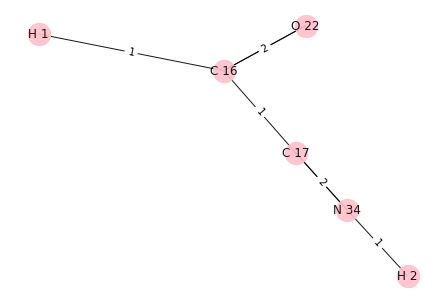

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


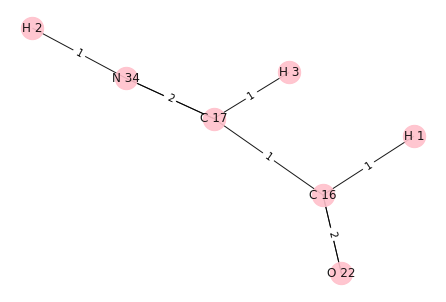

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


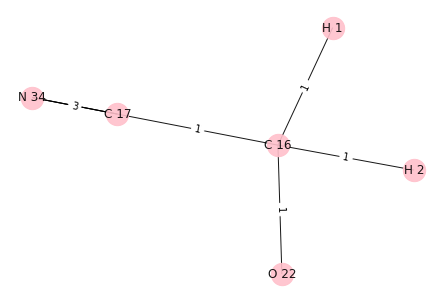

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


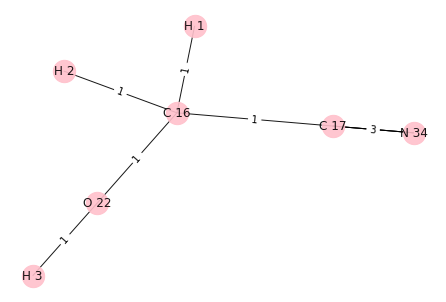

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


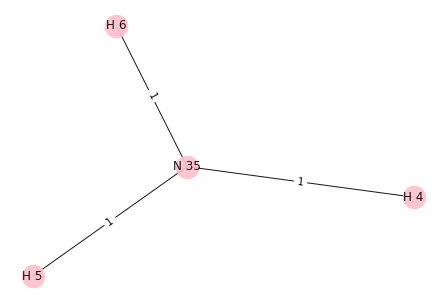

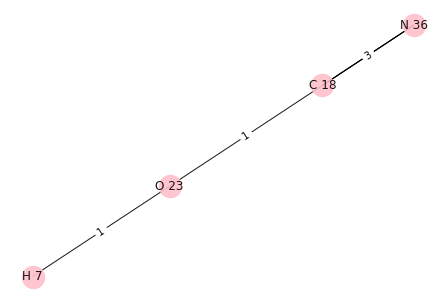

H 4
H 7
N 35 O 23


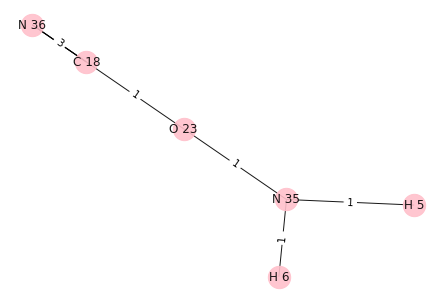

{N 36, O 23, C 18, H 5, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


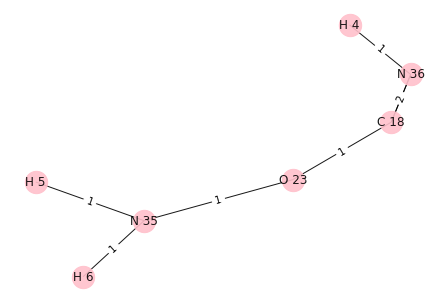

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


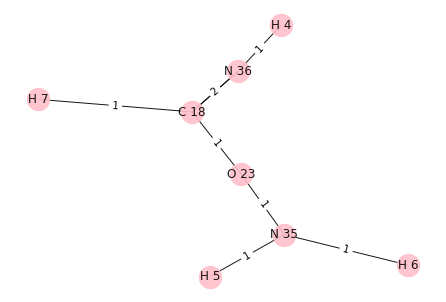

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


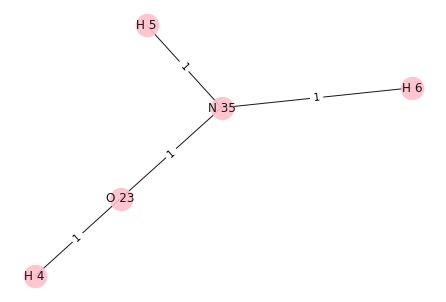

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


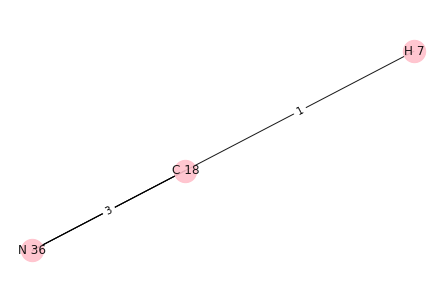

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
H 4 0
H 5 0
N 35 0
H 6 0


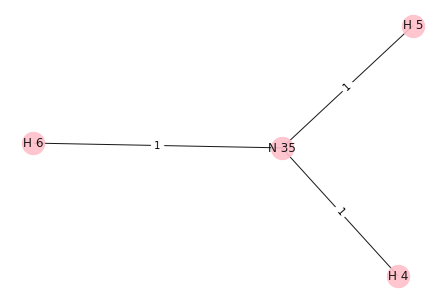

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


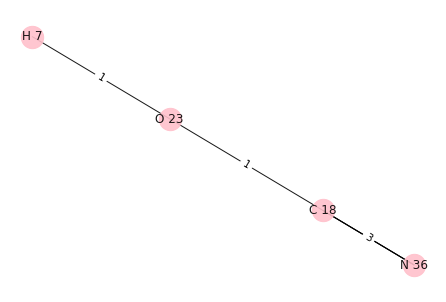

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 4
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


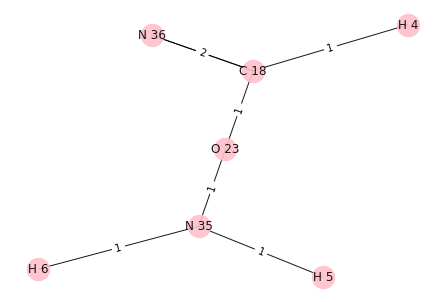

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


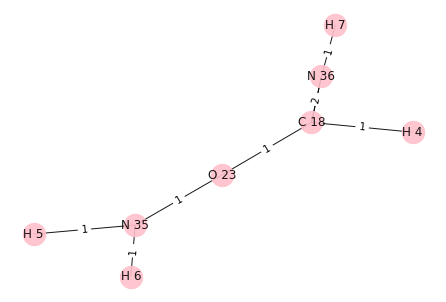

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


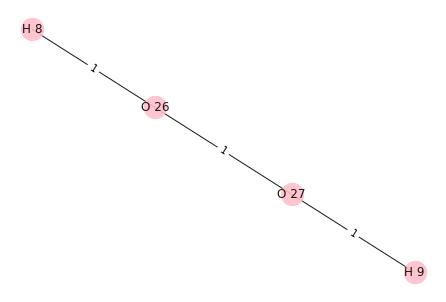

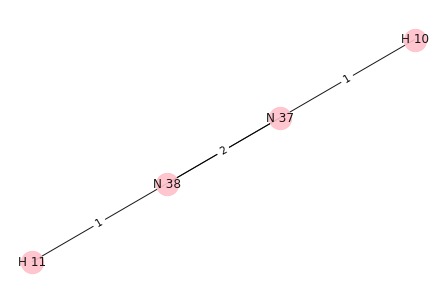

H 9
H 10
O 27 N 37


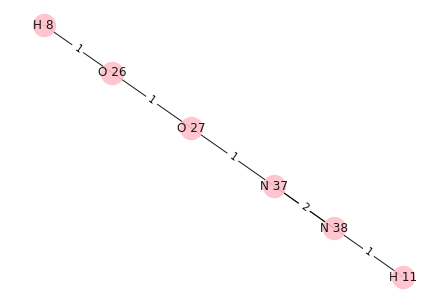

{O 26, O 27, H 11, N 38, N 37, H 8}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
O 26 0
H 8 0
H 9 0


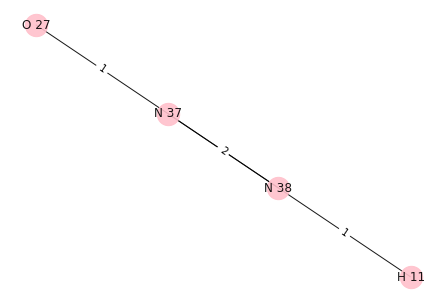

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


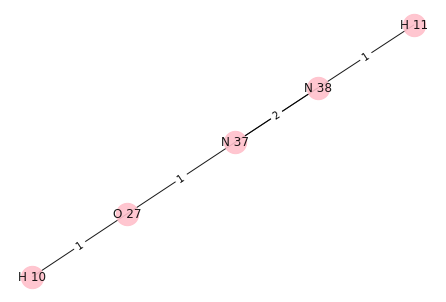

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


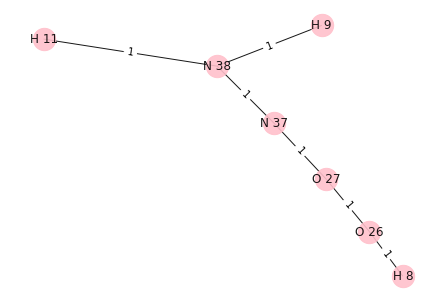

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


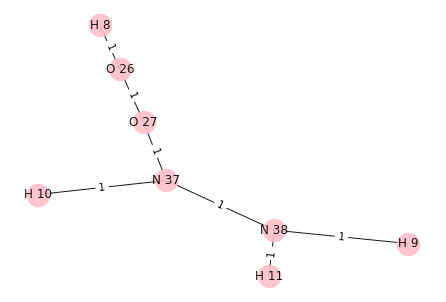

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
H 9 0
O 27 0
H 11 0
N 38 0
N 37 0


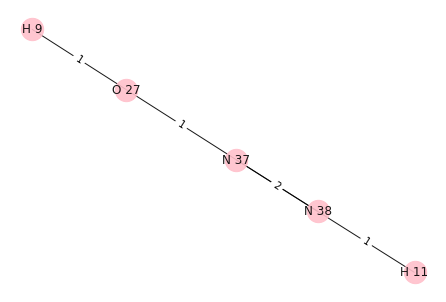

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


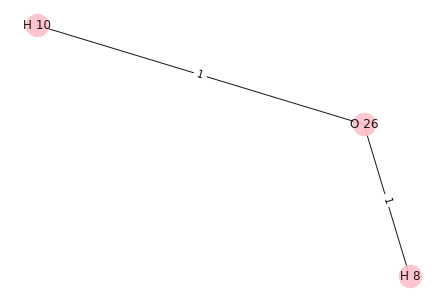

i: 3
Removing edge between: N 37 O 27
Adding edge between: N 37 H 9
H 11 0
H 9 0
N 38 0
N 37 0


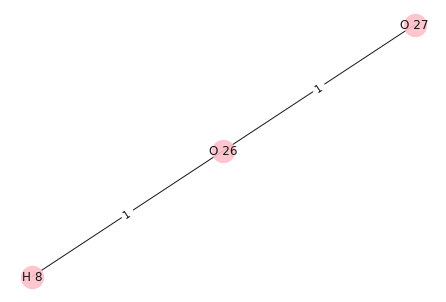

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


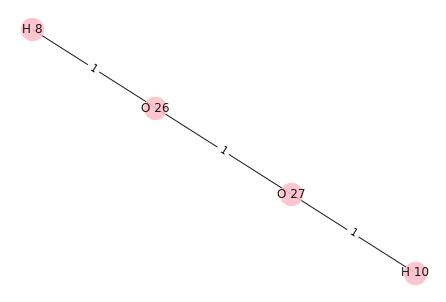

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


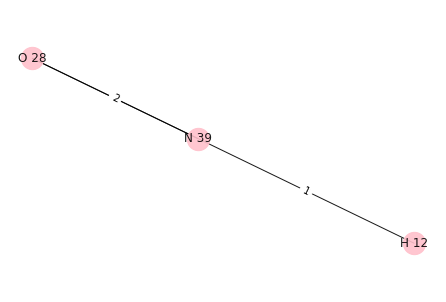

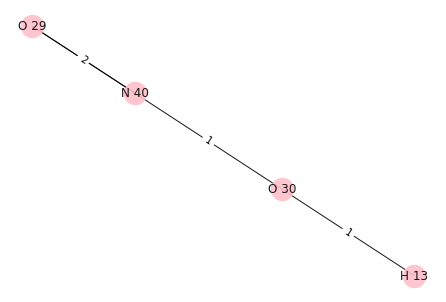

H 12
H 13
N 39 O 30


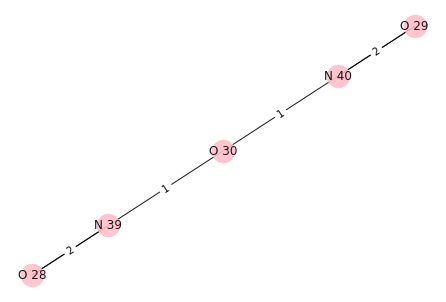

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


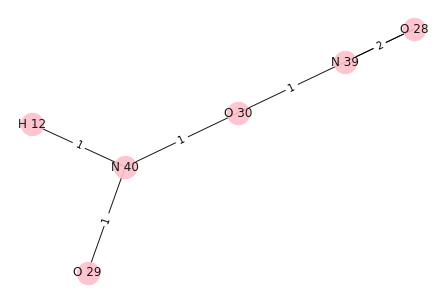

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


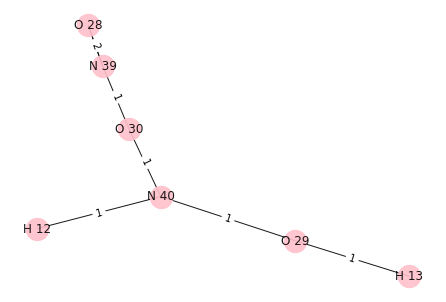

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


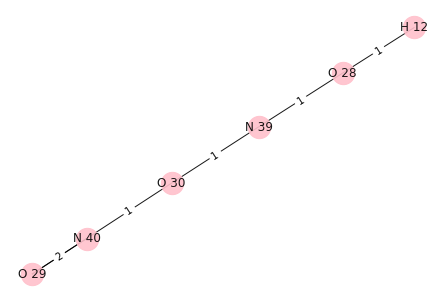

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


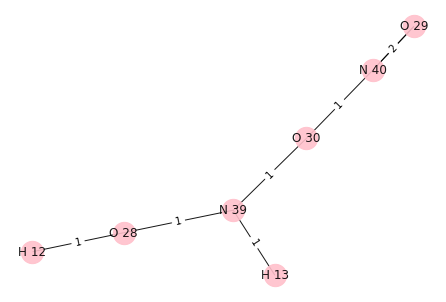

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


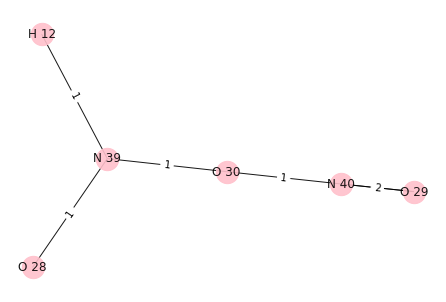

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


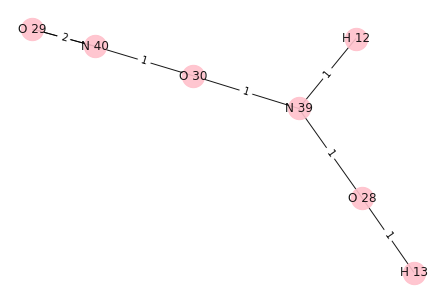

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


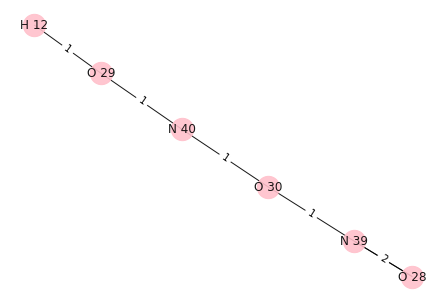

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


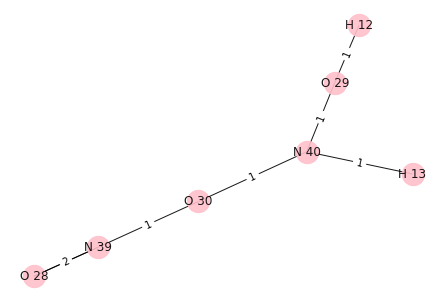

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


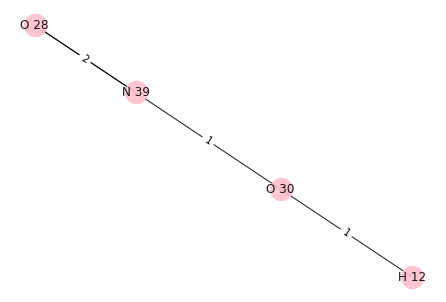

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


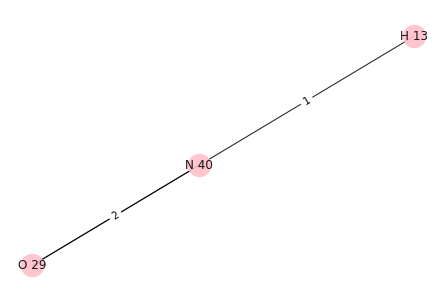

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


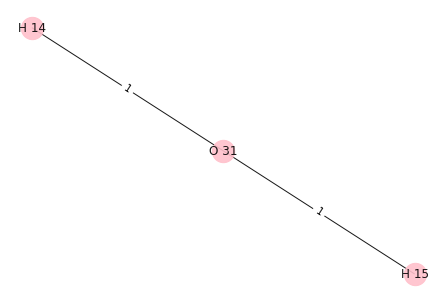

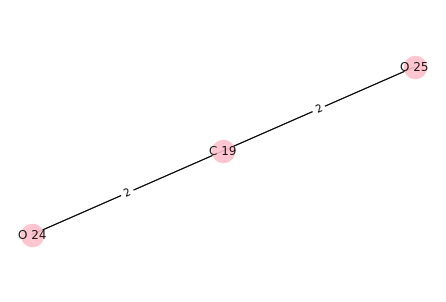

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


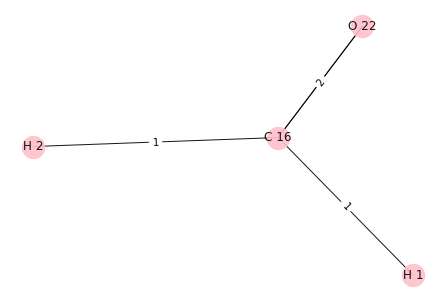

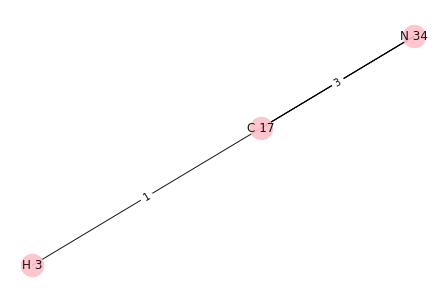

H 1
H 3
C 16 C 17


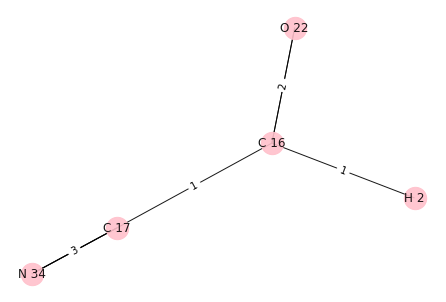

{O 22, N 34, C 16, H 2, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


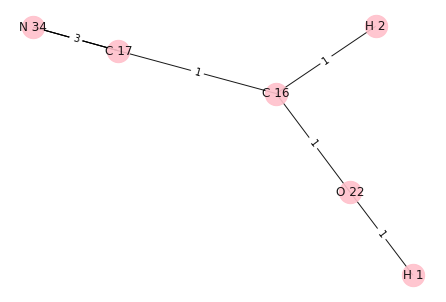

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


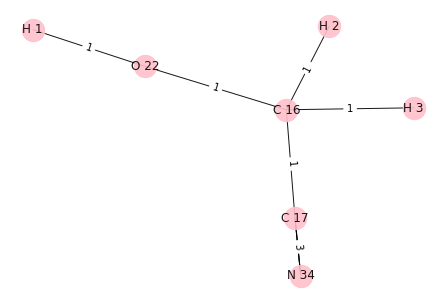

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


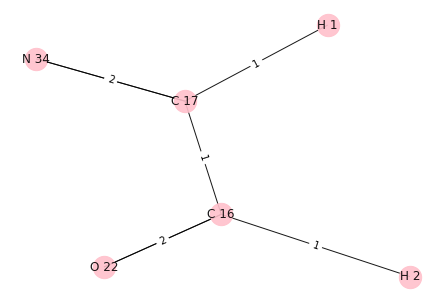

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


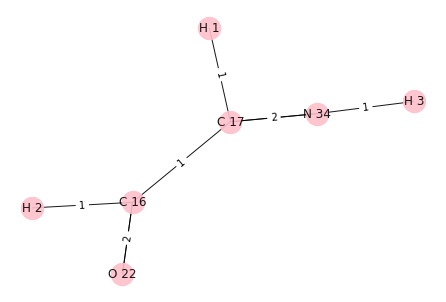

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


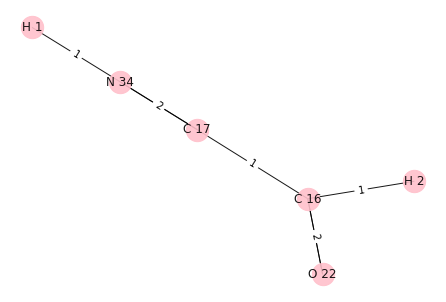

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


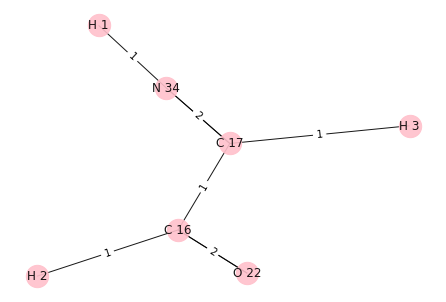

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


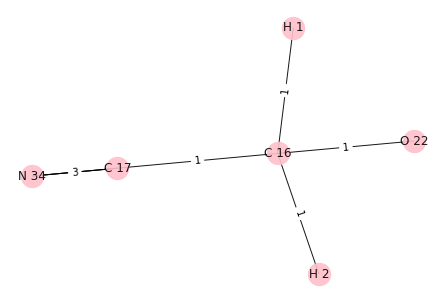

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


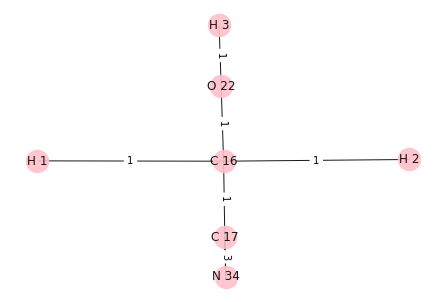

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


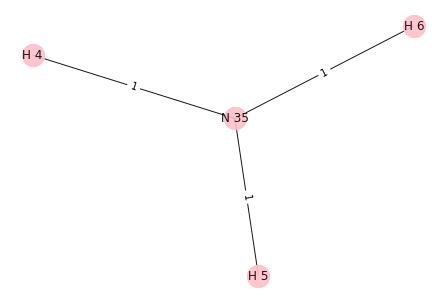

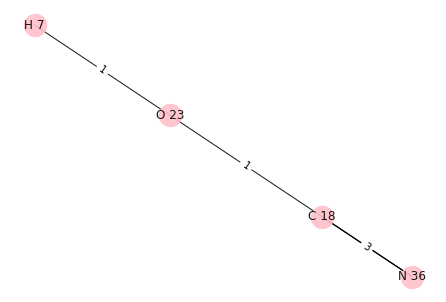

H 4
H 7
N 35 O 23


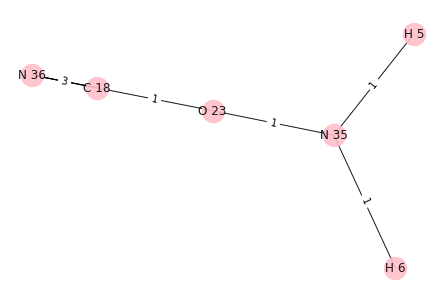

{N 36, O 23, C 18, H 5, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


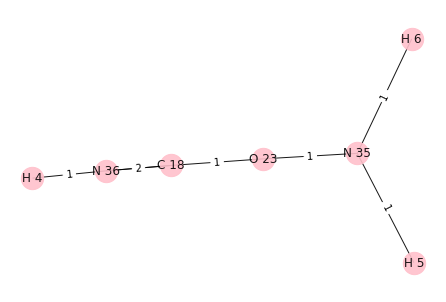

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


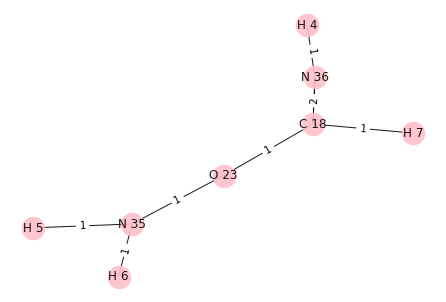

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


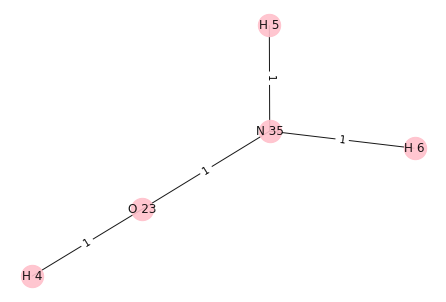

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


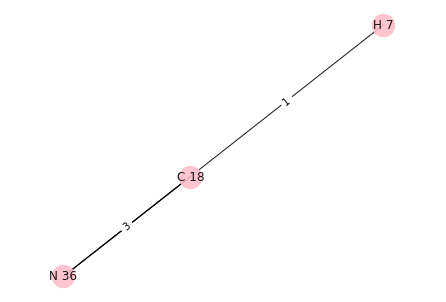

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
H 4 0
H 5 0
N 35 0
H 6 0


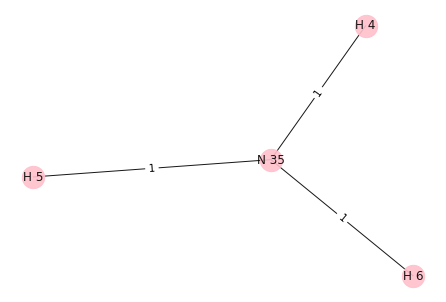

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


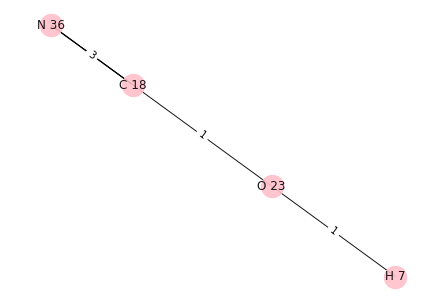

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 4
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


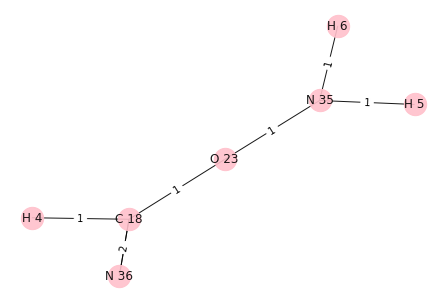

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


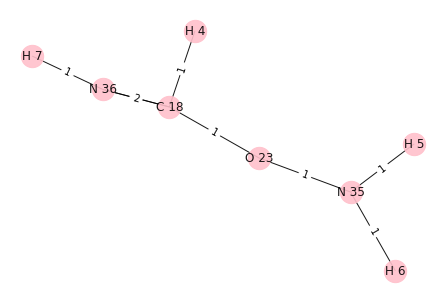

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


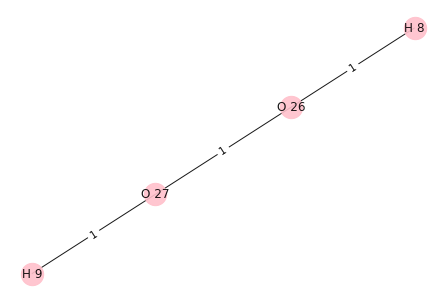

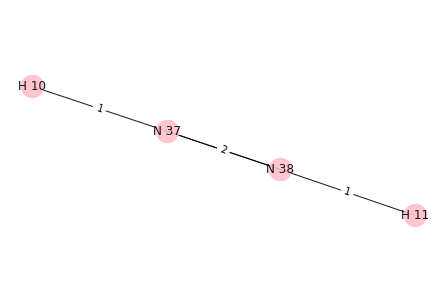

H 9
H 10
O 27 N 37


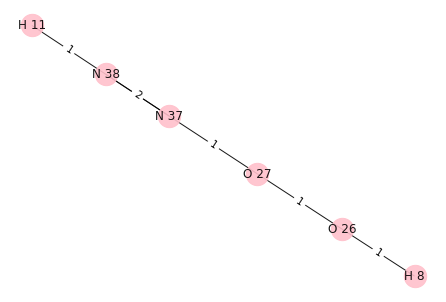

{O 26, O 27, H 11, N 38, N 37, H 8}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
O 26 0
H 8 0
H 9 0


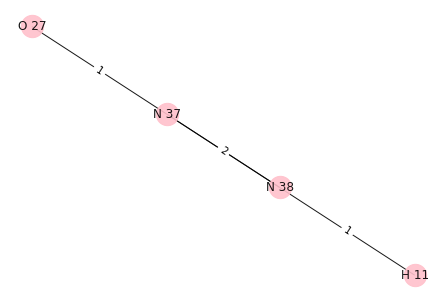

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


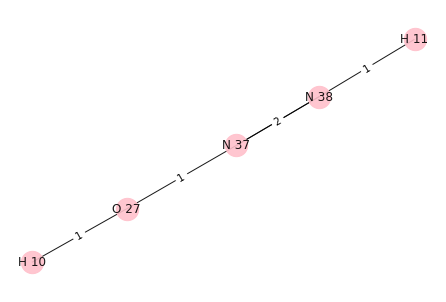

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


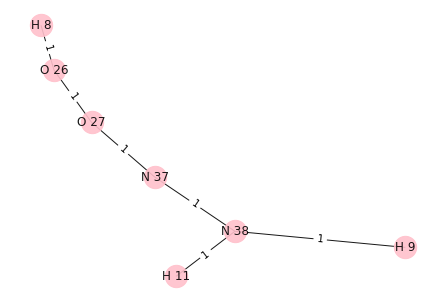

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


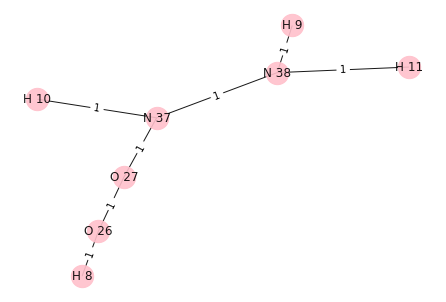

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
H 9 0
O 27 0
H 11 0
N 38 0
N 37 0


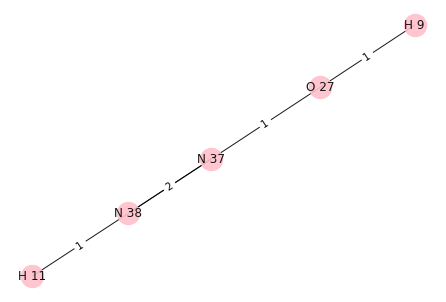

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


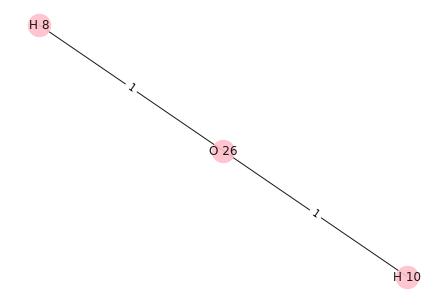

i: 3
Removing edge between: N 37 O 27
Adding edge between: N 37 H 9
H 11 0
H 9 0
N 38 0
N 37 0


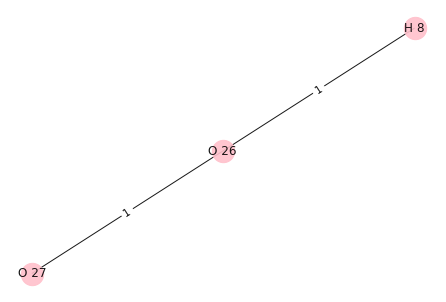

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


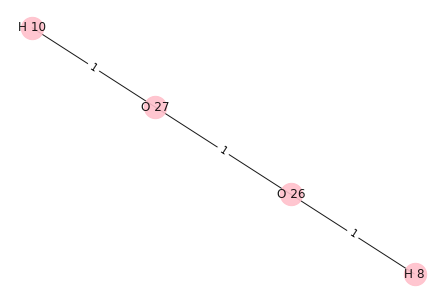

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


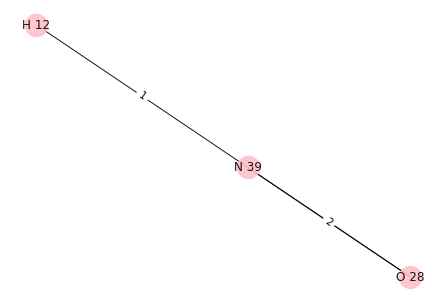

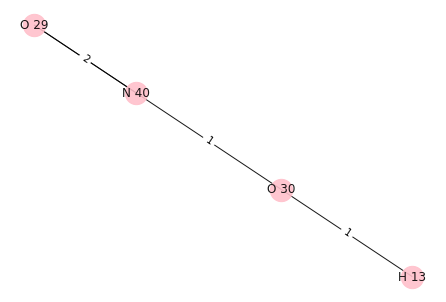

H 12
H 13
N 39 O 30


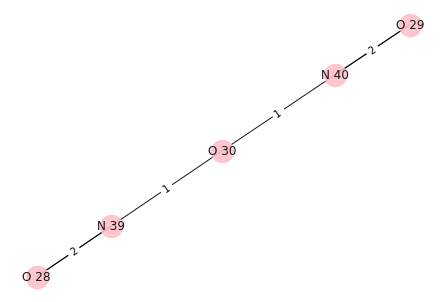

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


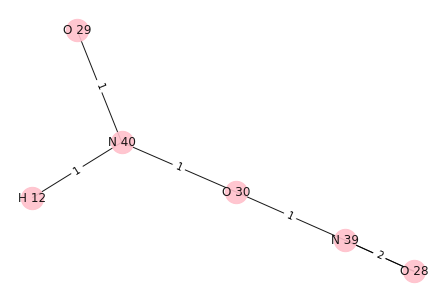

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


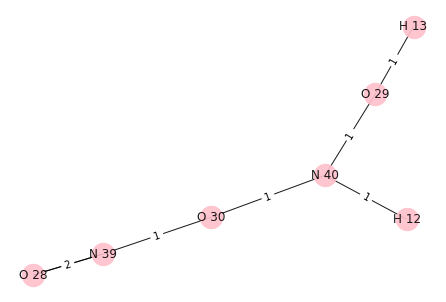

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


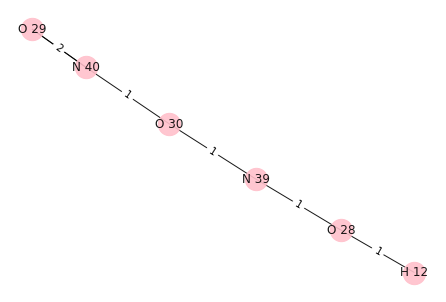

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


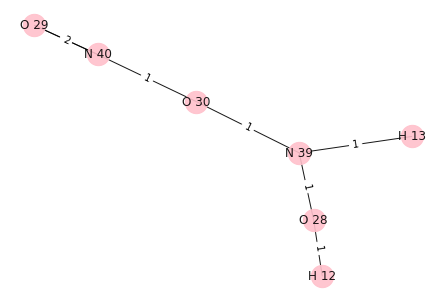

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


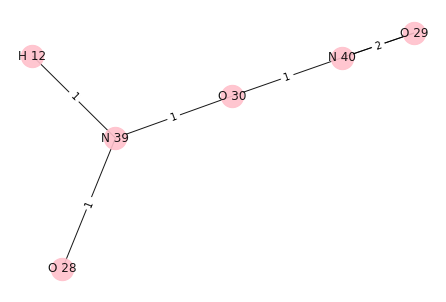

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


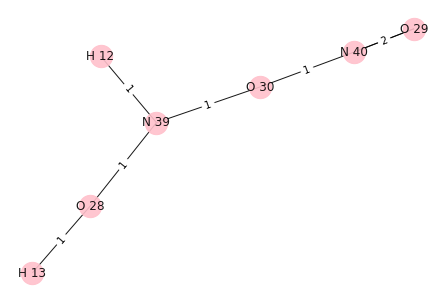

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


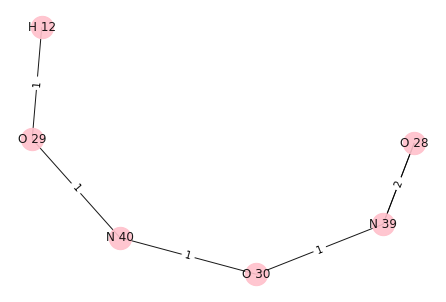

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


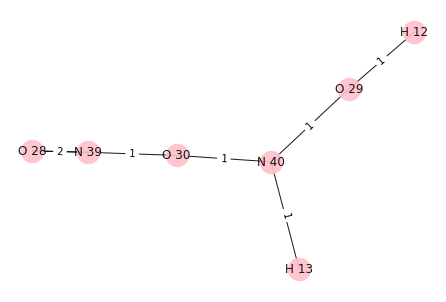

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


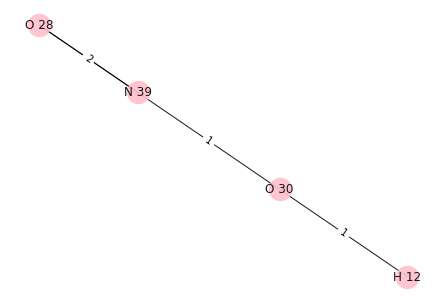

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


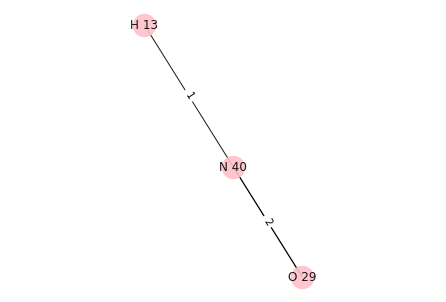

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


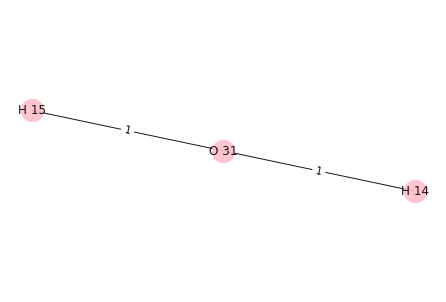

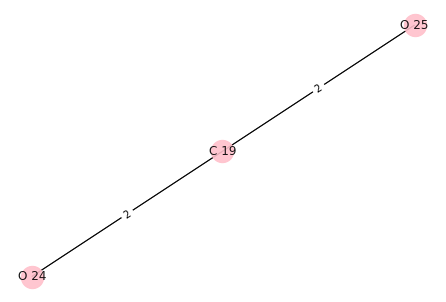

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


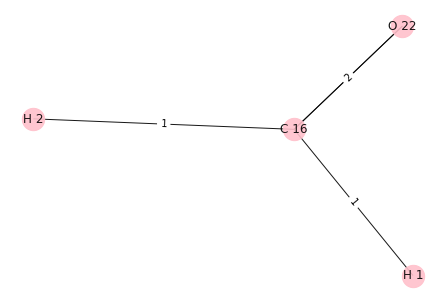

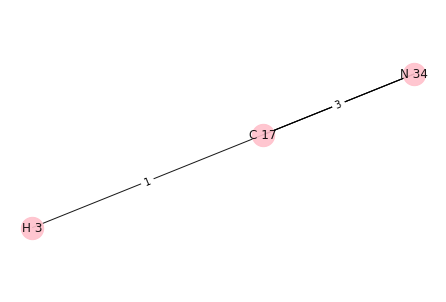

H 1
H 3
C 16 C 17


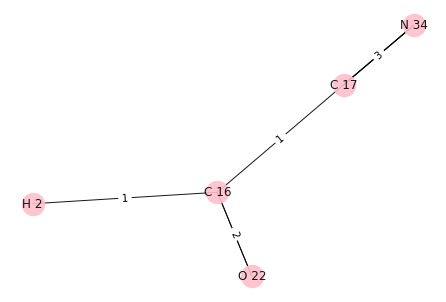

{O 22, N 34, C 16, H 2, C 17}
[O 22, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
O 22 0
H 1 0
N 34 0
C 16 1
H 2 0
C 17 0


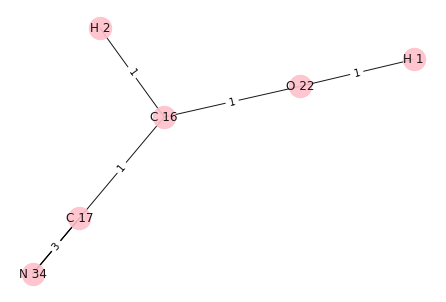

O 22 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


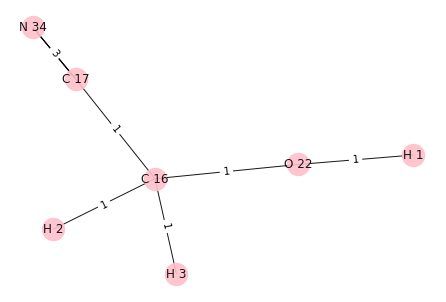

i: 1
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
C 17 0


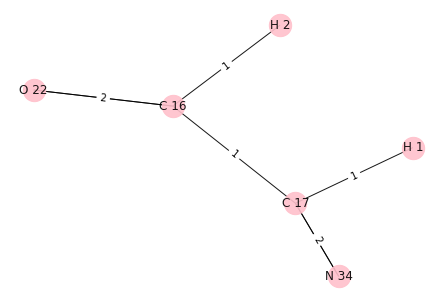

O 22 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


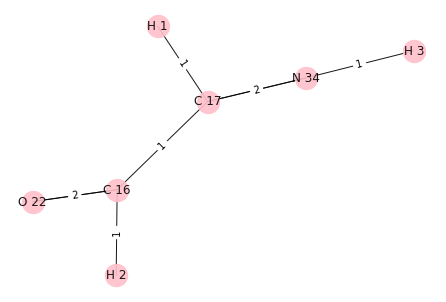

i: 2
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 1


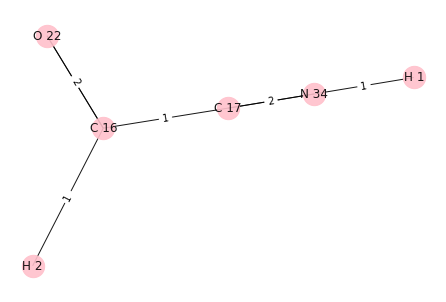

O 22 0
C 17 1
N 34 0
C 16 0
[C 17] H 3


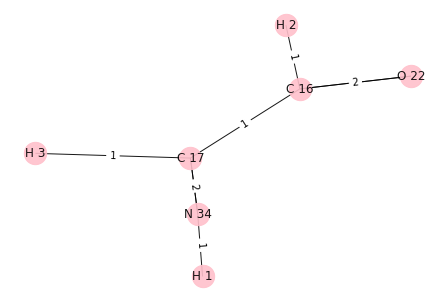

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
O 22 1
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


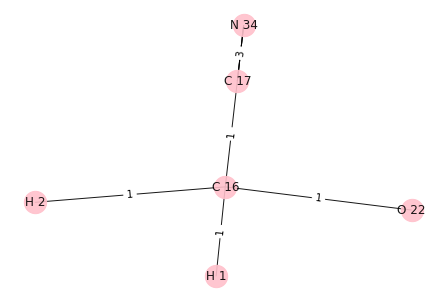

O 22 1
C 17 0
N 34 0
C 16 0
[O 22] H 3


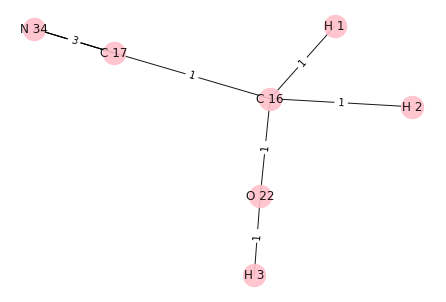

[{H 4, H 5, N 35, H 6}, {N 36, O 23, C 18, H 7}, {O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


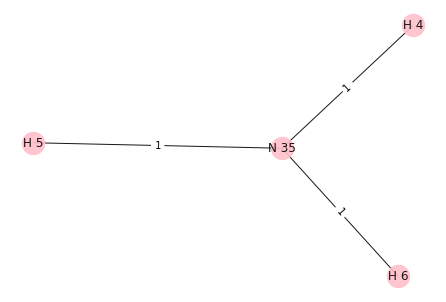

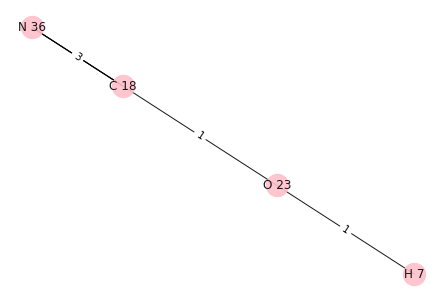

H 4
H 7
N 35 O 23


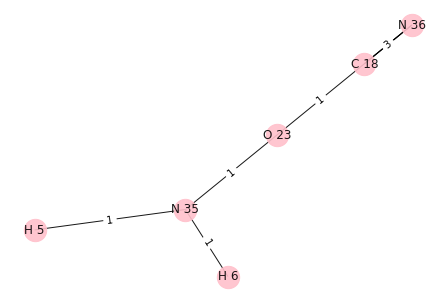

{N 36, O 23, C 18, H 5, H 6, N 35}
[N 36, O 23, N 35, C 18]
i: 0
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
N 36 0
H 4 0
O 23 0
C 18 1
H 5 0
H 6 0
N 35 0


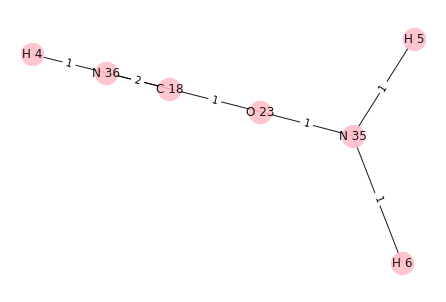

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


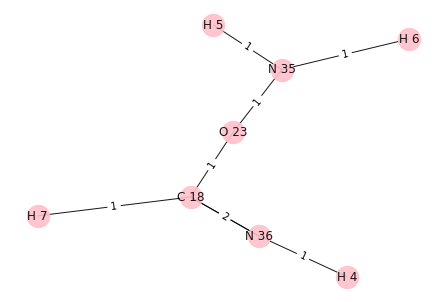

i: 1
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
H 4 0
O 23 0
H 5 0
H 6 0
N 35 0


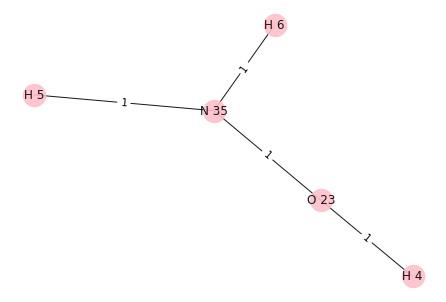

N 36 0
O 23 0
N 35 0
C 18 1
[C 18] H 7


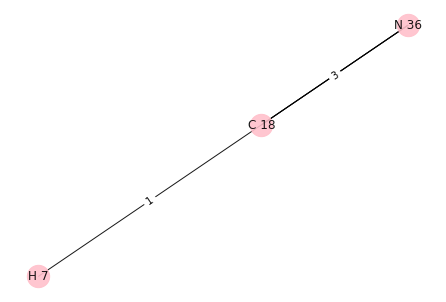

i: 2
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
H 4 0
H 5 0
N 35 0
H 6 0


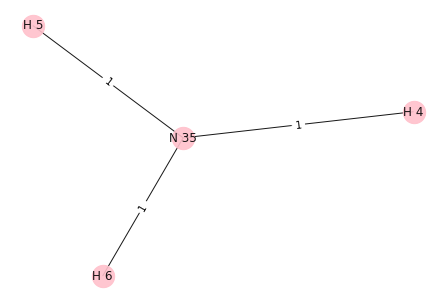

N 36 0
O 23 1
N 35 0
C 18 0
[O 23] H 7


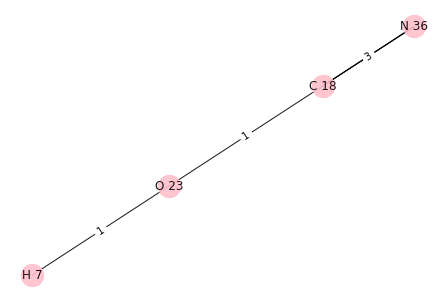

i: 3
Removing edge between: C 18 N 36
Adding edge between: C 18 H 4
N 36 1
H 4 0
O 23 0
C 18 0
H 5 0
H 6 0
N 35 0


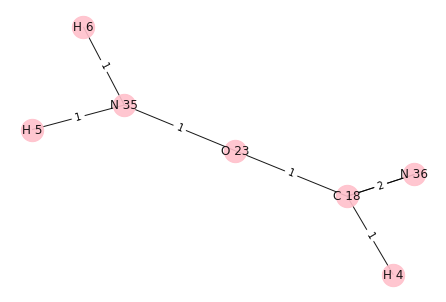

N 36 1
O 23 0
N 35 0
C 18 0
[N 36] H 7


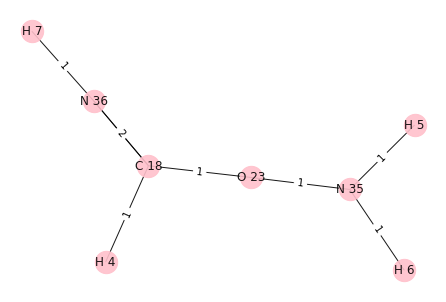

[{O 26, H 9, H 8, O 27}, {H 11, H 10, N 37, N 38}, {N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


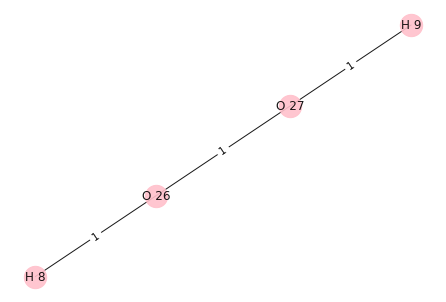

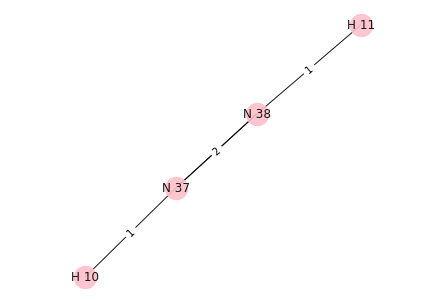

H 9
H 10
O 27 N 37


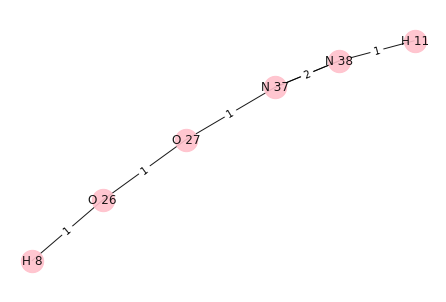

{O 26, O 27, H 11, N 38, N 37, H 8}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
O 26 0
H 8 0
H 9 0


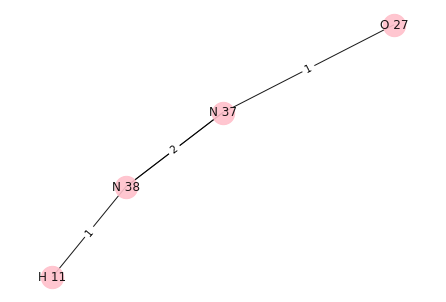

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


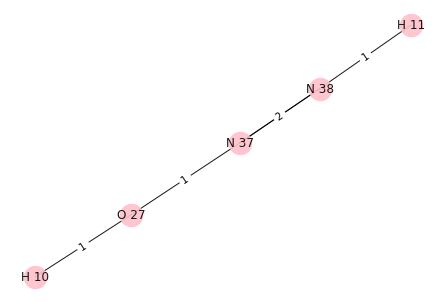

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
H 9 0
O 27 0
H 11 0
N 38 0
N 37 1
H 8 0


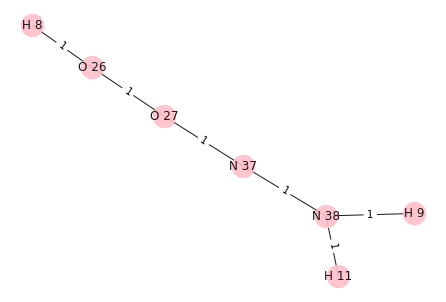

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


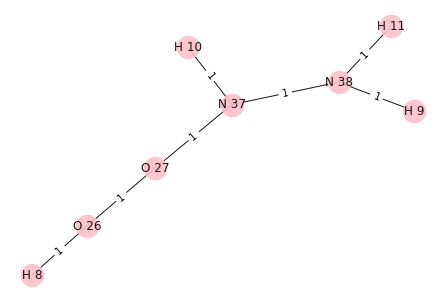

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
H 9 0
O 27 0
H 11 0
N 38 0
N 37 0


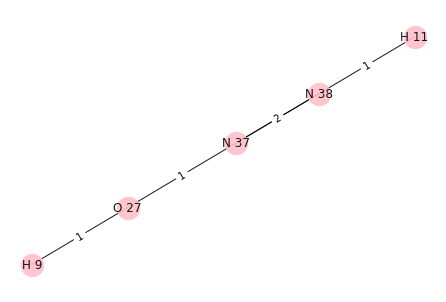

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


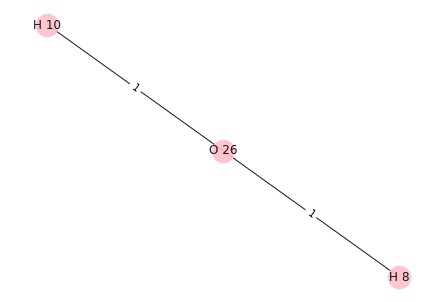

i: 3
Removing edge between: N 37 O 27
Adding edge between: N 37 H 9
H 11 0
H 9 0
N 38 0
N 37 0


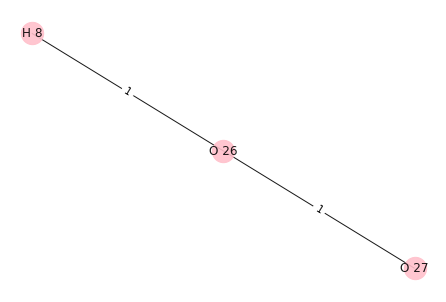

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


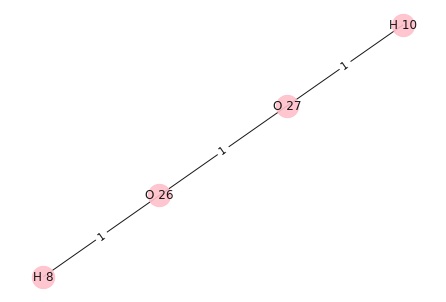

[{N 39, O 28, H 12}, {H 13, N 40, O 29, O 30}, {H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


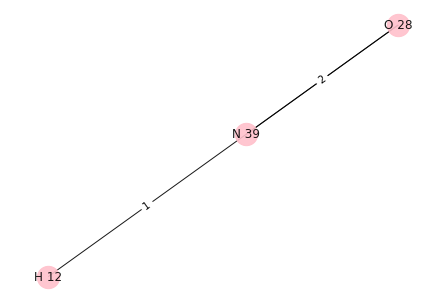

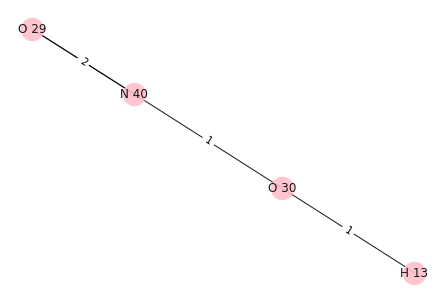

H 12
H 13
N 39 O 30


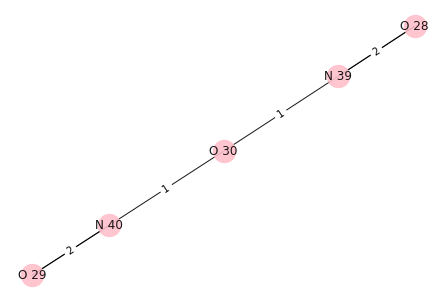

{N 40, O 28, N 39, O 29, O 30}
[N 40, O 28, N 39, O 29, O 30]
i: 0
Removing edge between: N 40 O 29
Adding edge between: N 40 H 12
N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
H 12 0


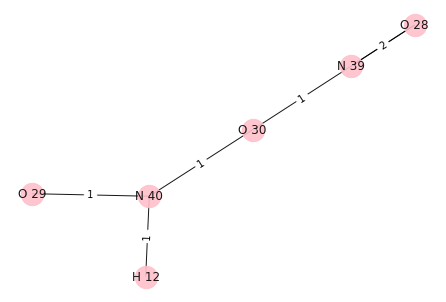

N 40 0
O 28 0
N 39 0
O 29 1
O 30 0
[O 29] H 13


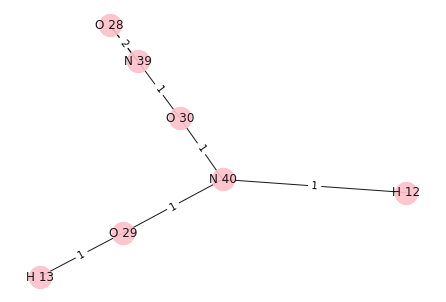

i: 1
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
H 12 0


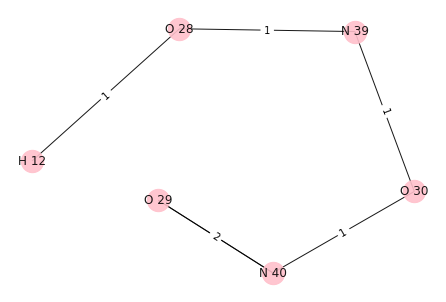

N 40 0
O 28 0
N 39 1
O 29 0
O 30 0
[N 39] H 13


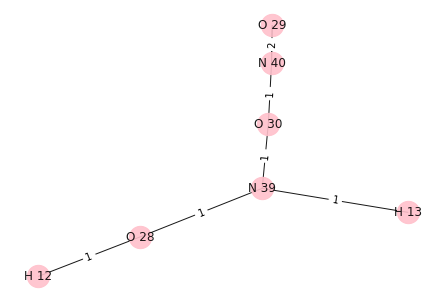

i: 2
Removing edge between: N 39 O 28
Adding edge between: N 39 H 12
N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
H 12 0


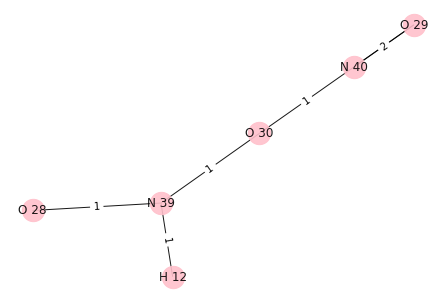

N 40 0
O 28 1
N 39 0
O 29 0
O 30 0
[O 28] H 13


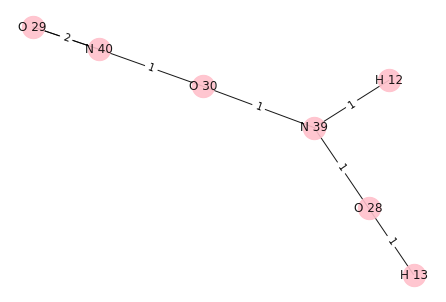

i: 3
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
H 12 0


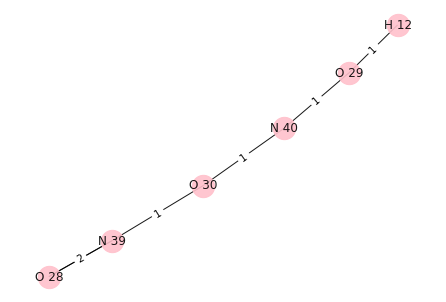

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


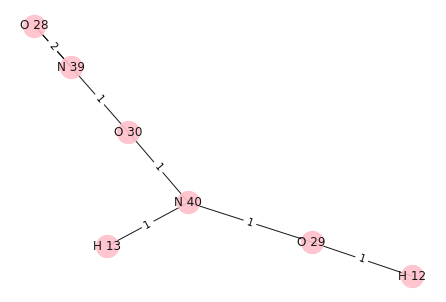

i: 4
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
O 30 0
H 12 0


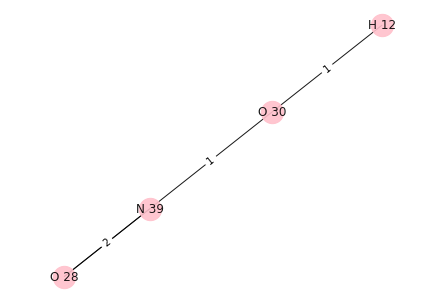

N 40 1
O 28 0
N 39 0
O 29 0
O 30 0
[N 40] H 13


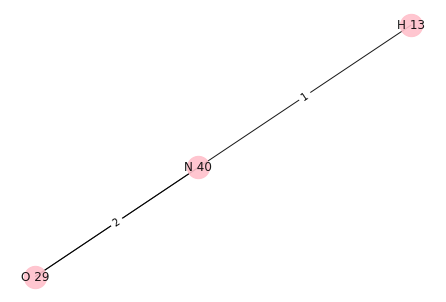

[{H 14, H 15, O 31}, {O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


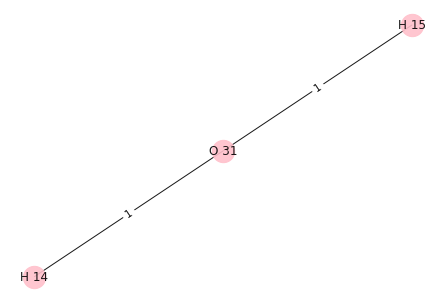

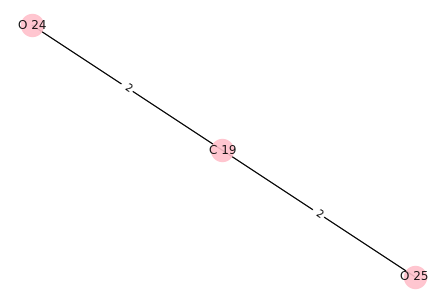

[{O 24, O 25, C 19}, {C 21, C 20, O 32, O 33}]


In [24]:
trails = 10
n = len(list(nx.connected_components(N)))
final_dict = {}
order = [i for i in range(n)]
for i in range(trails):
    final_dict.update(simulated_annealing_bonds(N, order))

In [27]:
for i in nx.connected_components(N):
    print(i)

{H 2, O 22, H 1, C 16}
{N 34, H 3, C 17}
{H 4, H 5, N 35, H 6}
{N 36, O 23, C 18, H 7}
{O 26, H 9, H 8, O 27}
{H 11, H 10, N 37, N 38}
{N 39, O 28, H 12}
{H 13, N 40, O 29, O 30}
{H 14, H 15, O 31}
{O 24, O 25, C 19}
{C 21, C 20, O 32, O 33}


In [28]:
new_final = final_dict.copy()
for i in final_dict:
    if final_dict[i] > 10:
        new_final.pop(i)

In [29]:
len(new_final)

100

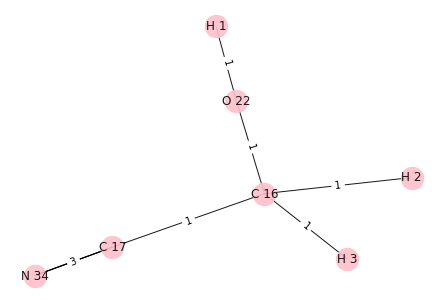

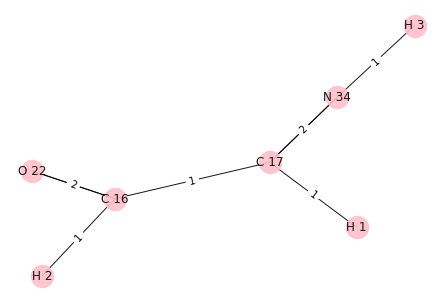

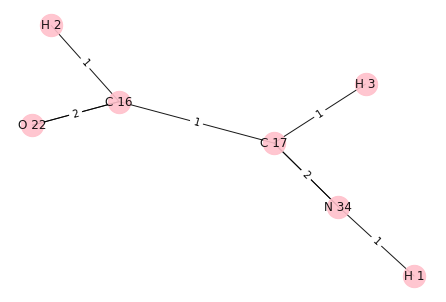

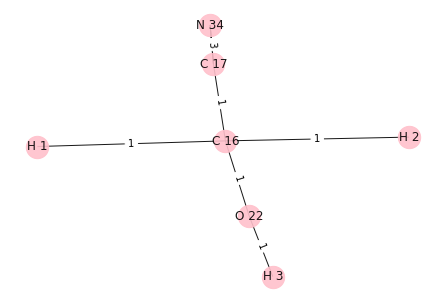

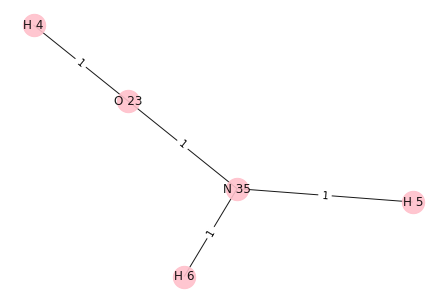

...

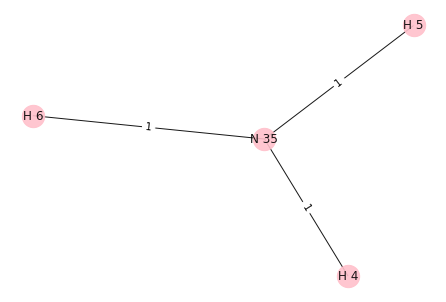

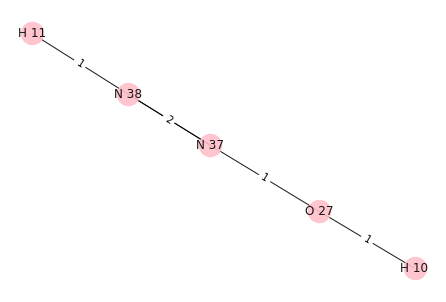

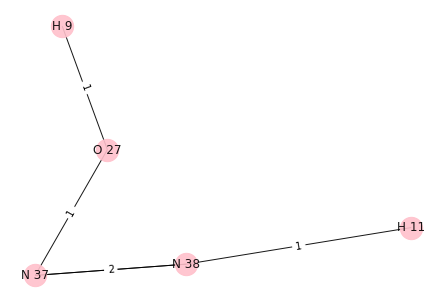

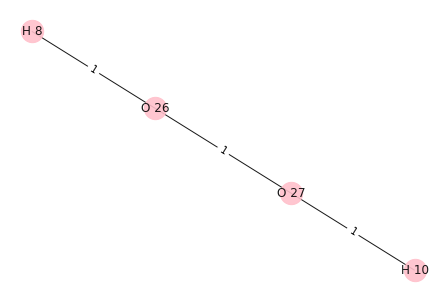

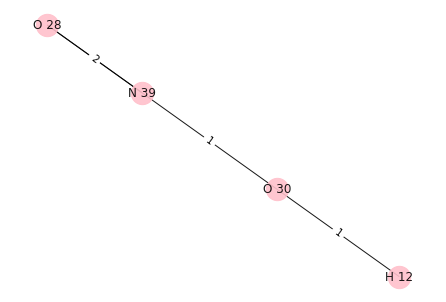

In [32]:
i = 0
for compound in new_final:
    nodes = nx.nodes(compound)
    plot_fig(compound)
    if i == 0:
        essential_compound = compound
    i += 1

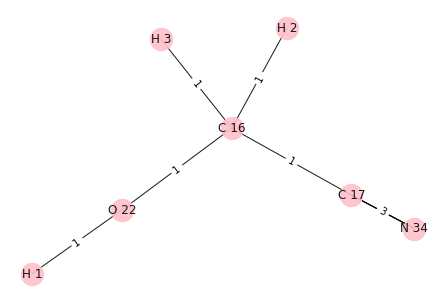

In [33]:
plot_fig(essential_compound)

In [62]:
nodes = nx.nodes(essential_compound)
oxygens = [i for i in nodes if (i._name.split()[0]=="O")]
OHs = []
for i in oxygens:
    for j in essential_compound[i]:
        if j._name.split()[0]=="H": 
            OHs.append((i,j))

for i,j in enumerate(nx.connected_components(G_new)):
    if i == 2:
        ammonia = G_new.subgraph(list(j))

2
[{H 4, H 5, N 35, H 6}, {O 22, H 1, H 3, C 16, N 34, H 2, C 17}]
{H 4, H 5, N 35, H 6}
{O 22, H 1, H 3, C 16, N 34, H 2, C 17}
11


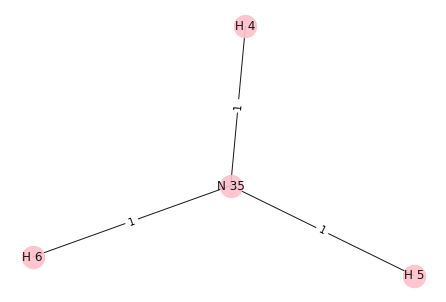

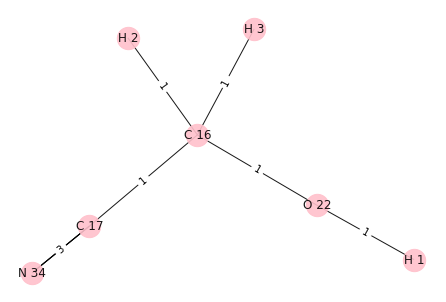

H 4
H 3
N 35 C 16


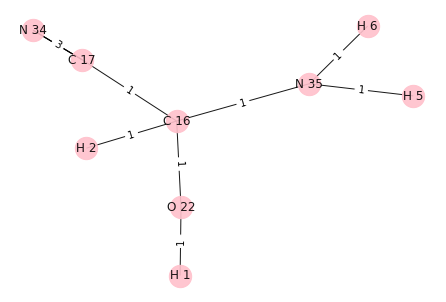

{O 22, H 1, N 34, C 16, H 2, H 5, H 6, N 35, C 17}
[O 22, N 34, C 16, N 35, C 17]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 4
H 4 0
O 22 0
H 1 0


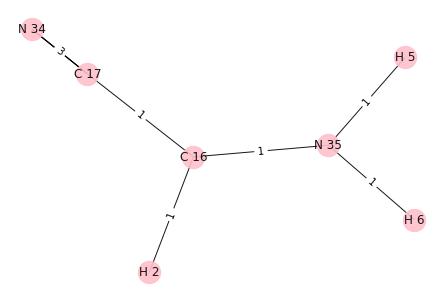

O 22 0
N 34 0
C 16 1
N 35 0
C 17 0
[C 16] H 3


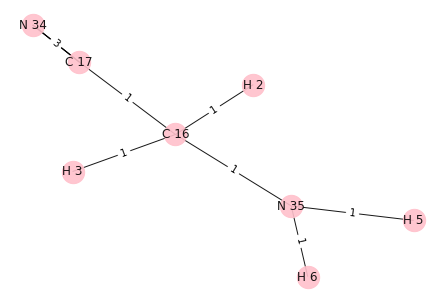

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 4
H 4 0
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
H 5 0
H 6 0
N 35 0
C 17 1


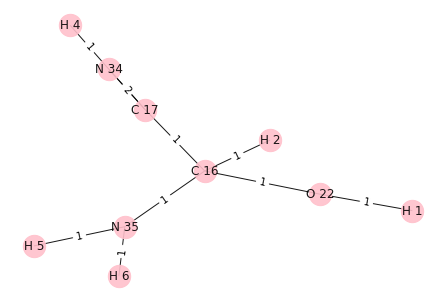

O 22 0
N 34 0
C 16 0
N 35 0
C 17 1
[C 17] H 3


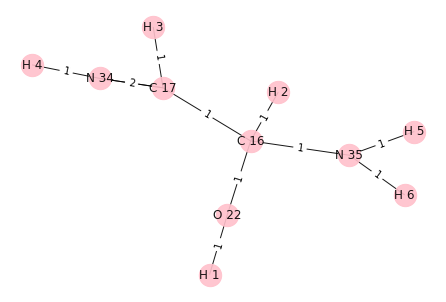

i: 2
Removing edge between: C 16 N 35
Adding edge between: C 16 H 4
H 4 0
O 22 0
H 1 0
N 34 0
C 16 0
H 2 0
C 17 0


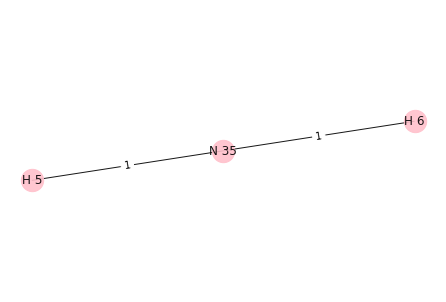

O 22 0
N 34 0
C 16 0
N 35 1
C 17 0
[N 35] H 3


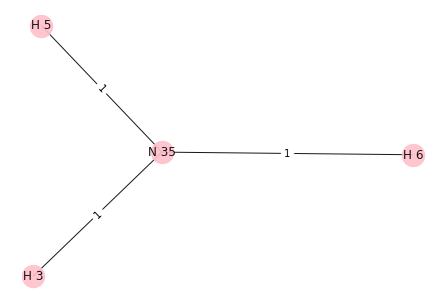

i: 3
Removing edge between: N 35 C 16
Adding edge between: N 35 H 4
H 4 0
H 5 0
N 35 0
H 6 0


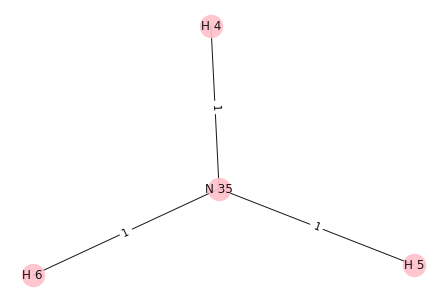

O 22 0
N 34 0
C 16 1
N 35 0
C 17 0
[C 16] H 3


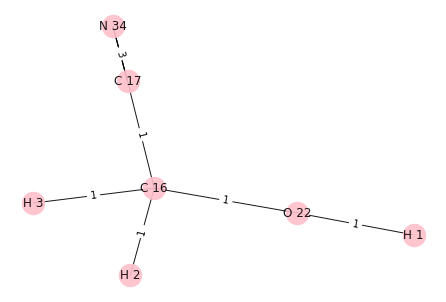

i: 4
Removing edge between: C 17 N 34
Adding edge between: C 17 H 4
H 4 0
O 22 0
H 1 0
N 34 1
C 16 0
H 2 0
H 5 0
H 6 0
N 35 0
C 17 0


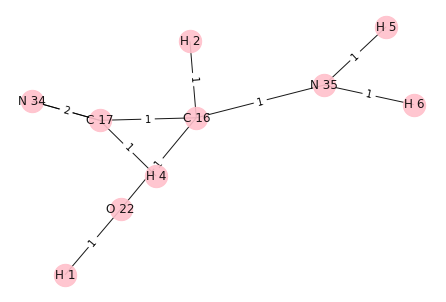

O 22 0
N 34 1
C 16 0
N 35 0
C 17 0
[N 34] H 3


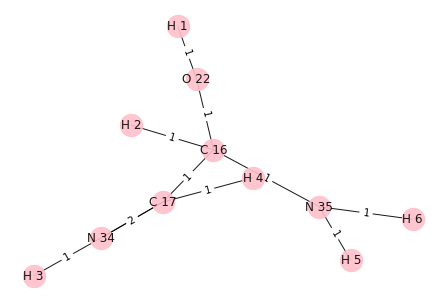

[]


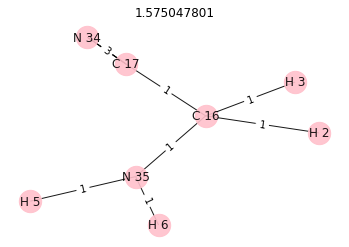

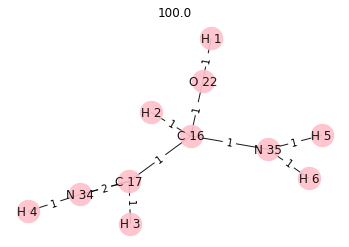

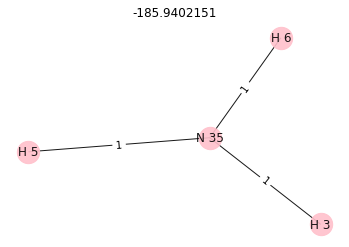

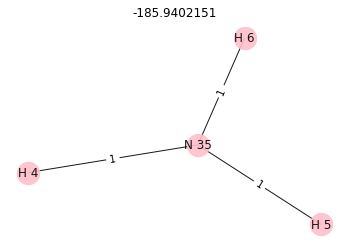

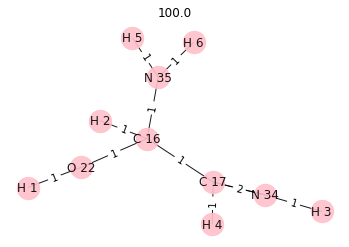

In [63]:
netG = nx.compose(ammonia, essential_compound)
dict_vals = simulated_annealing_bonds(netG)

for i in dict_vals:
    plot_fig(i, dict_vals[i])

In [76]:
cyanides = {}
for compound in dict_vals:
    cyanides[compound] = []
    carbons = [i for i in nx.nodes(compound) if i._name.split()[0]=="C"]
    for i in carbons:
        for j in compound[i]:
            if j._name.split()[0]=="N" and compound[i][j][0]['number']==3:
                cyanides[compound].append((i,j))
                
print(cyanides)

{<networkx.classes.multigraph.MultiGraph object at 0x7fbe5eca59a0>: [(C 17, N 34)], <networkx.classes.multigraph.MultiGraph object at 0x7fbe5f10be50>: [], <networkx.classes.multigraph.MultiGraph object at 0x7fbe5f301f40>: [], <networkx.classes.multigraph.MultiGraph object at 0x7fbe607c8c40>: [], <networkx.classes.multigraph.MultiGraph object at 0x7fbe5f25af70>: []}


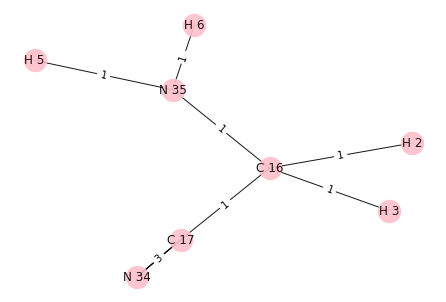

flag == True


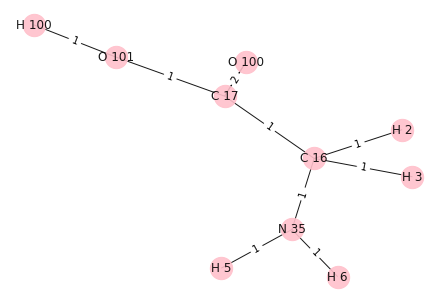

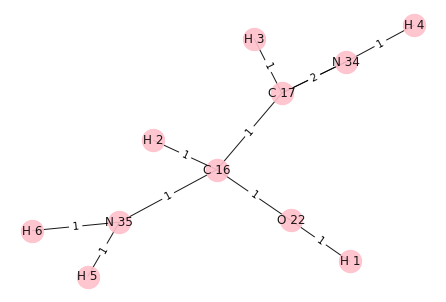

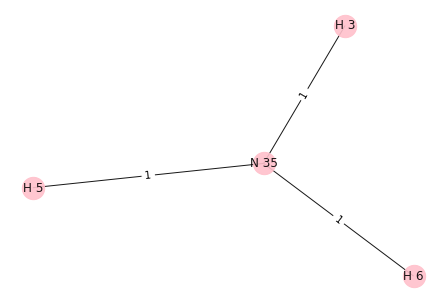

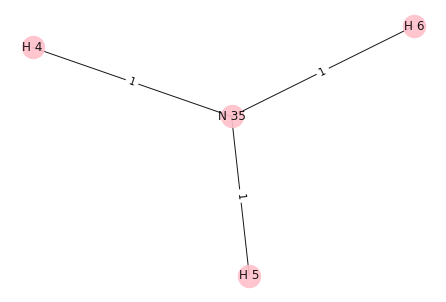

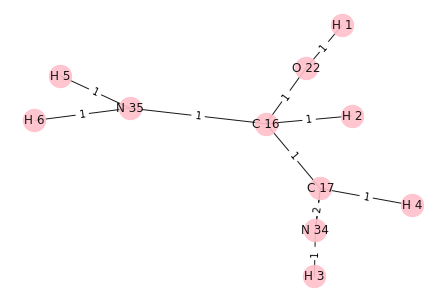

In [86]:
extra_H = [Compound("H", i) for i in range(100,110)]
extra_O = [Compound("O", i) for i in range(100,120)]

oidx = 0
hidx = 0

changed_graph = {}
for compound in dict_vals:
    flag = False
    plot_fig(compound)
    for cn in cyanides[compound]:
        if cn[0] in nx.nodes(compound):
            flag = True
            break
    if flag == True:
        print("flag == True")
        g_val = dict_vals[compound]
        compound = nx.MultiGraph(compound)
        neigh = compound[cn[0]]
        non_n_neigh = [i for i in neigh if (i._name.split()[0]!="N")]
        
        for time in range(3):
            compound.remove_edge(cn[1], cn[0])
        
        for time in range(2):
            compound.add_edge(cn[0], extra_O[oidx])
        oidx += 1
        
        compound.add_edge(cn[0], extra_O[oidx])
        compound.add_edge(extra_O[oidx], extra_H[hidx])
        hidx += 1
        oidx += 1
        
        compound.remove_node(cn[1])
        plot_fig(compound)
        changed_graph[compound] = g_val

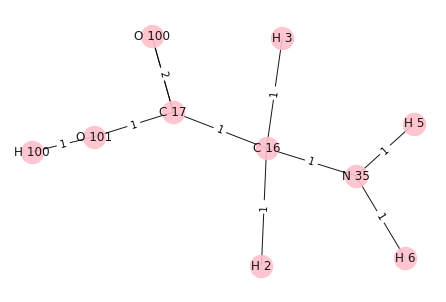

In [87]:
for compound in changed_graph:
    plot_fig(compound)